# 🏞️ Étude morphométrique et hydrologique du bassin versant de la mare de Madarounfa

## Comparaison multi-temporelle des modèles numériques d'élévation

**Zone d'étude :** Mare/Lac de Madarounfa, région de Maradi, Niger

**Objectifs :**
- Délimiter le bassin versant de la mare ;
- Comparer deux modèles numériques d'élévation ;
- Analyser la morphométrie du bassin ;
- Caractériser le relief et l'hypsométrie ;
- Extraire et analyser le réseau hydrographique ;
- Estimer le temps de concentration ;
- Produire des cartes et indicateurs hydrologiques.

**Sources principales :**
- OpenTopography
- SRTM
- Copernicus DEM
- Données vectorielles OpenStreetMap
- Python / Google Colab

In [ ]:
# ============================================================
# 1. INSTALLATION DES BIBLIOTHÈQUES
# ============================================================

!pip install -q rasterio geopandas matplotlib numpy pandas scipy
!pip install -q pyogrio shapely

In [ ]:
# ============================================================
# 2. IMPORT DES BIBLIOTHÈQUES
# ============================================================

import os
import requests
import zipfile
import warnings

import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt

from rasterio.plot import show
from shapely.geometry import Point, Polygon

warnings.filterwarnings("ignore")

print("Bibliothèques chargées avec succès.")

Bibliothèques chargées avec succès.


In [ ]:
# ============================================================
# 3. ORGANISATION DU PROJET
# ============================================================

BASE_DIR = "/content/madarounfa_bassin_versant"

DEM_DIR = os.path.join(BASE_DIR, "DEM")
VECTOR_DIR = os.path.join(BASE_DIR, "VECTOR")
RESULT_DIR = os.path.join(BASE_DIR, "RESULTATS")
FIG_DIR = os.path.join(BASE_DIR, "FIGURES")

for dossier in [
    BASE_DIR,
    DEM_DIR,
    VECTOR_DIR,
    RESULT_DIR,
    FIG_DIR
]:
    os.makedirs(dossier, exist_ok=True)

print("Structure du projet créée :")
print(BASE_DIR)

Structure du projet créée :
/content/madarounfa_bassin_versant


In [ ]:
# ============================================================
# 4. IMPORT DU LAC DE MADAROUNFA
# ============================================================

from google.colab import files

uploaded = files.upload()

print("Fichier importé :", list(uploaded.keys()))

Saving export.geojson to export.geojson
Fichier importé : ['export.geojson']


In [ ]:
# ============================================================
# 5. LECTURE DU GEOJSON
# ============================================================

import geopandas as gpd

geojson_file = list(uploaded.keys())[0]

gdf = gpd.read_file(geojson_file)

print("Nombre total d'entités :", len(gdf))
print("CRS :", gdf.crs)

print("\nTypes :")
print(gdf.geometry.geom_type.value_counts())

Nombre total d'entités : 12
CRS : EPSG:4326

Types :
Polygon    12
Name: count, dtype: int64


In [ ]:
# ============================================================
# 6. SÉLECTION DU LAC
# ============================================================

lake = gdf[
    gdf["name"].astype(str).str.strip() == "Lac de Madarounfa"
].copy()

if len(lake) == 0:
    raise ValueError(
        "❌ Le lac de Madarounfa n'a pas été trouvé."
    )

print("✅ Lac trouvé")
print("Nombre d'entités :", len(lake))
print("CRS :", lake.crs)

✅ Lac trouvé
Nombre d'entités : 1
CRS : EPSG:4326


In [ ]:
# ============================================================
# 7. CRÉATION DE LA ZONE DE TÉLÉCHARGEMENT
# ============================================================

# Passage temporaire en projection métrique
lake_utm = lake.to_crs("EPSG:32632")

# Buffer de 15 km
zone_dem_utm = lake_utm.buffer(15000)

# Retour en WGS84
zone_dem = gpd.GeoDataFrame(
    geometry=zone_dem_utm,
    crs="EPSG:32632"
).to_crs("EPSG:4326")

bounds = zone_dem.total_bounds

west, south, east, north = bounds

print("Emprise de téléchargement :")
print(f"West  : {west:.6f}")
print(f"South : {south:.6f}")
print(f"East  : {east:.6f}")
print(f"North : {north:.6f}")

Emprise de téléchargement :
West  : 6.992177
South : 13.168931
East  : 7.295568
North : 13.463749


In [ ]:
# ============================================================
# 8. CLÉ API OPENTOPOGRAPHY
# ============================================================

from getpass import getpass

API_KEY = getpass(
    "🔑 Entrez votre clé API OpenTopography : "
)
2da842eb40974fd7501e8a559e87f7f5
print("✅ Clé enregistrée temporairement dans Colab.")

SyntaxError: invalid decimal literal (1517778508.py, line 10)

In [ ]:
# ============================================================
# 9. FONCTION DE TÉLÉCHARGEMENT OPENTOPOGRAPHY
# ============================================================

import requests

def telecharger_dem(
    demtype,
    nom_fichier,
    south,
    north,
    west,
    east,
    api_key
):

    url = "https://portal.opentopography.org/API/globaldem"

    params = {
        "demtype": demtype,
        "south": south,
        "north": north,
        "west": west,
        "east": east,
        "outputFormat": "GTiff",
        "API_Key": api_key
    }

    print(f"\n⏳ Téléchargement : {demtype}")

    response = requests.get(
        url,
        params=params,
        timeout=300
    )

    print("Code HTTP :", response.status_code)

    if response.status_code != 200:
        print(response.text[:1000])
        raise RuntimeError(
            f"❌ Échec du téléchargement de {demtype}"
        )

    chemin = os.path.join(
        DEM_DIR,
        nom_fichier
    )

    with open(chemin, "wb") as f:
        f.write(response.content)

    print(
        f"✅ Fichier enregistré : {chemin}"
    )

    print(
        f"📦 Taille : "
        f"{os.path.getsize(chemin)/1024/1024:.2f} Mo"
    )

    return chemin

In [ ]:
# ============================================================
# 10. DEM ANCIEN : SRTM GL1
# ============================================================

srtm_path = telecharger_dem(
    demtype="SRTMGL1",
    nom_fichier="Madarounfa_SRTMGL1_30m.tif",
    south=south,
    north=north,
    west=west,
    east=east,
    api_key=API_KEY
)


⏳ Téléchargement : SRTMGL1
Code HTTP : 200
✅ Fichier enregistré : /content/madarounfa_bassin_versant/DEM/Madarounfa_SRTMGL1_30m.tif
📦 Taille : 0.62 Mo


In [ ]:
# ============================================================
# 11. DEM RÉCENT : COPERNICUS GLO-30
# ============================================================

copernicus_path = telecharger_dem(
    demtype="COP30",
    nom_fichier="Madarounfa_COP30_30m.tif",
    south=south,
    north=north,
    west=west,
    east=east,
    api_key=API_KEY
)


⏳ Téléchargement : COP30
Code HTTP : 200
✅ Fichier enregistré : /content/madarounfa_bassin_versant/DEM/Madarounfa_COP30_30m.tif
📦 Taille : 4.22 Mo


In [ ]:
# ============================================================
# 12. CONTRÔLE DES DEM
# ============================================================

def infos_dem(path, nom):

    with rasterio.open(path) as src:

        print("\n" + "="*60)
        print(nom)
        print("="*60)

        print("CRS :", src.crs)
        print("Largeur :", src.width)
        print("Hauteur :", src.height)
        print("Résolution :", src.res)
        print("Bounds :", src.bounds)
        print("NoData :", src.nodata)
        print("Nombre de bandes :", src.count)

        data = src.read(1, masked=True)

        print(
            f"Altitude min : {data.min():.2f} m"
        )

        print(
            f"Altitude max : {data.max():.2f} m"
        )

        print(
            f"Altitude moyenne : {data.mean():.2f} m"
        )


infos_dem(
    srtm_path,
    "SRTM GL1 — DEM ancien"
)

infos_dem(
    copernicus_path,
    "COPERNICUS GLO-30 — DEM récent"
)


SRTM GL1 — DEM ancien
CRS : EPSG:4326
Largeur : 1092
Hauteur : 1061
Résolution : (0.0002777777777778146, 0.0002777777777778146)
Bounds : BoundingBox(left=6.992083333358096, bottom=13.169027777771575, right=7.2954166666914695, top=13.463749999993837)
NoData : -32768.0
Nombre de bandes : 1
Altitude min : 334.00 m
Altitude max : 443.00 m
Altitude moyenne : 388.08 m

COPERNICUS GLO-30 — DEM récent
CRS : EPSG:4326
Largeur : 1092
Hauteur : 1061
Résolution : (0.0002777777777777778, 0.0002777777777777778)
Bounds : BoundingBox(left=6.992083322222214, bottom=13.16902778888888, right=7.295416655555548, top=13.463750011111102)
NoData : None
Nombre de bandes : 1
Altitude min : 341.12 m
Altitude max : 435.91 m
Altitude moyenne : 385.17 m


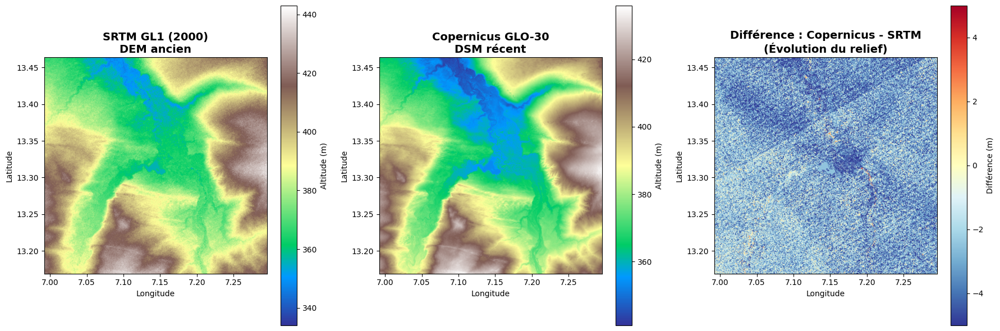

✅ Figure sauvegardée dans : /content/madarounfa_bassin_versant/FIGURES/comparaison_SRTM_COP30.png

📊 Statistiques de la différence (Copernicus - SRTM) :
Moyenne : -2.91 m
Écart-type : 1.68 m
Min : -18.15 m
Max : 13.73 m


In [ ]:
# ============================================================
# 13. VISUALISATION COMPARATIVE DES DEUX DEM
# ============================================================

import matplotlib.pyplot as plt
import rasterio
import numpy as np

# Lecture des deux DEM
with rasterio.open(srtm_path) as src_srtm:
    srtm_data = src_srtm.read(1, masked=True)
    extent_srtm = [src_srtm.bounds.left, src_srtm.bounds.right,
                   src_srtm.bounds.bottom, src_srtm.bounds.top]

with rasterio.open(copernicus_path) as src_cop:
    cop_data = src_cop.read(1, masked=True)
    extent_cop = [src_cop.bounds.left, src_cop.bounds.right,
                  src_cop.bounds.bottom, src_cop.bounds.top]

# Calcul de la différence (Copernicus - SRTM)
diff_data = cop_data - srtm_data

# Création de la figure avec 3 panneaux
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 1. SRTM
im1 = axes[0].imshow(srtm_data, extent=extent_srtm, cmap='terrain', interpolation='bilinear')
axes[0].set_title('SRTM GL1 (2000)\nDEM ancien', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Longitude')
axes[0].set_ylabel('Latitude')
plt.colorbar(im1, ax=axes[0], label='Altitude (m)')

# 2. Copernicus
im2 = axes[1].imshow(cop_data, extent=extent_cop, cmap='terrain', interpolation='bilinear')
axes[1].set_title('Copernicus GLO-30\nDSM récent', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Longitude')
axes[1].set_ylabel('Latitude')
plt.colorbar(im2, ax=axes[1], label='Altitude (m)')

# 3. Différence
im3 = axes[2].imshow(diff_data, extent=extent_cop, cmap='RdYlBu_r', interpolation='bilinear',
                      vmin=-5, vmax=5)
axes[2].set_title('Différence : Copernicus - SRTM\n(Évolution du relief)', fontsize=14, fontweight='bold')
axes[2].set_xlabel('Longitude')
axes[2].set_ylabel('Latitude')
plt.colorbar(im3, ax=axes[2], label='Différence (m)')

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'comparaison_SRTM_COP30.png'), dpi=300, bbox_inches='tight')
plt.show()

print("✅ Figure sauvegardée dans :", os.path.join(FIG_DIR, 'comparaison_SRTM_COP30.png'))

# Statistiques de la différence
print("\n📊 Statistiques de la différence (Copernicus - SRTM) :")
print(f"Moyenne : {np.mean(diff_data):.2f} m")
print(f"Écart-type : {np.std(diff_data):.2f} m")
print(f"Min : {np.min(diff_data):.2f} m")
print(f"Max : {np.max(diff_data):.2f} m")

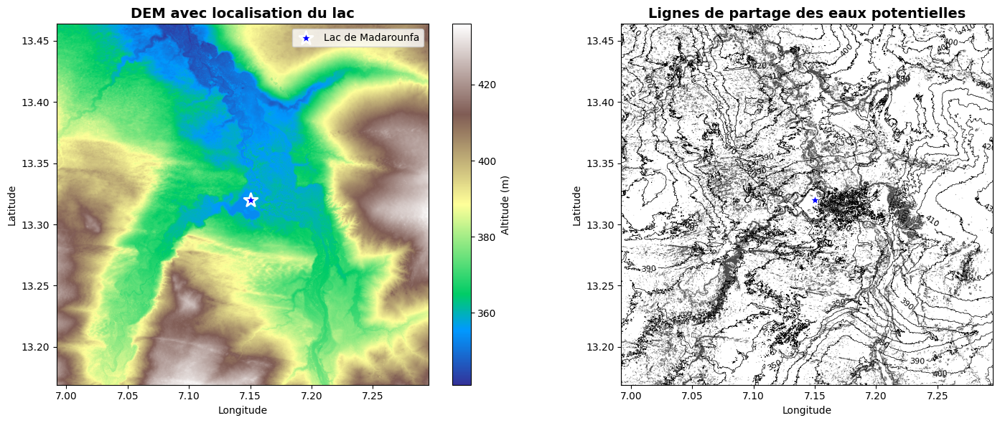

✅ Figure sauvegardée dans : /content/madarounfa_bassin_versant/FIGURES/verification_lignes_de_partage.png

📏 Distance maximale dans votre DEM : 46.9 km

🏔️ Point culminant dans la zone : 435.9 m
   Coordonnées : 7.295139°E, 13.311250°N
   Distance au lac : 16.1 km

✅ Le point culminant est proche du lac.
   La zone d'étude semble suffisante.


In [ ]:
# ============================================================
# 14. VÉRIFICATION DE LA TAILLE DU DEM POUR LE BASSIN VERSANT
# ============================================================

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from scipy.ndimage import label

# Lecture du Copernicus (ou SRTM, c'est pareil)
with rasterio.open(copernicus_path) as src:
    dem = src.read(1, masked=True)
    dem_transform = src.transform
    bounds = src.bounds
    res = src.res[0]

# Création d'une carte de pente pour visualiser les lignes de crête
from scipy.ndimage import sobel

# Calcul des gradients
grad_x = sobel(dem, axis=1)
grad_y = sobel(dem, axis=0)
pente = np.sqrt(grad_x**2 + grad_y**2)

# Seuil pour identifier les zones de crête (pente forte)
seuil_pente = np.percentile(pente, 85)  # 15% des pentes les plus fortes
crestes = pente > seuil_pente

# Visualisation
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# 1. DEM avec localisation du lac
im1 = axes[0].imshow(dem, cmap='terrain', extent=[
    bounds.left, bounds.right, bounds.bottom, bounds.top
])
axes[0].set_title('DEM avec localisation du lac', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Longitude')
axes[0].set_ylabel('Latitude')

# Ajout de la position approximative du lac (au centre)
lac_lon = 7.15  # Coordonnées approximatives
lac_lat = 13.32
axes[0].scatter(lac_lon, lac_lat, color='blue', s=200, marker='*',
                edgecolors='white', linewidth=2, label='Lac de Madarounfa')
axes[0].legend()
plt.colorbar(im1, ax=axes[0], label='Altitude (m)')

# 2. Lignes de crête potentielles
im2 = axes[1].imshow(crestes, cmap='gray_r', extent=[
    bounds.left, bounds.right, bounds.bottom, bounds.top
], alpha=0.7)
axes[1].set_title('Lignes de partage des eaux potentielles', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Longitude')
axes[1].set_ylabel('Latitude')
axes[1].scatter(lac_lon, lac_lat, color='blue', s=200, marker='*',
                edgecolors='white', linewidth=2)

# Ajout des contours pour mieux visualiser
contours = axes[1].contour(dem, levels=10, colors='black', linewidths=0.5,
                           extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
axes[1].clabel(contours, inline=True, fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'verification_lignes_de_partage.png'), dpi=300, bbox_inches='tight')
plt.show()

print("✅ Figure sauvegardée dans :", os.path.join(FIG_DIR, 'verification_lignes_de_partage.png'))

# Analyse de la distance potentielle du bassin versant
distance_max = np.sqrt((bounds.right - bounds.left)**2 + (bounds.top - bounds.bottom)**2) * 111  # km
print(f"\n📏 Distance maximale dans votre DEM : {distance_max:.1f} km")

# Estimation des coordonnées des points hauts
max_alt = np.max(dem)
max_pos = np.where(dem == max_alt)
max_lon = bounds.left + max_pos[1][0] * res
max_lat = bounds.top - max_pos[0][0] * res

print(f"\n🏔️ Point culminant dans la zone : {max_alt:.1f} m")
print(f"   Coordonnées : {max_lon:.6f}°E, {max_lat:.6f}°N")
print(f"   Distance au lac : {np.sqrt((max_lon - lac_lon)**2 + (max_lat - lac_lat)**2) * 111:.1f} km")

# Si le point culminant est loin, le bassin versant pourrait être très grand
if np.sqrt((max_lon - lac_lon)**2 + (max_lat - lac_lat)**2) * 111 > 20:
    print("\n⚠️ ATTENTION : Le point culminant est à >20 km du lac.")
    print("   Le bassin versant pourrait dépasser votre zone d'étude !")
else:
    print("\n✅ Le point culminant est proche du lac.")
    print("   La zone d'étude semble suffisante.")

✅ DEM chargé et préparé
✅ Pente calculée
   Pente moyenne : 11057.49 °
   Pente max : 125908.35 °
✅ Direction d'écoulement calculée
✅ Accumulation des flux calculée
✅ Exutoire sélectionné
   Coordonnées : 7.252917°E, 13.265139°N
   Altitude à l'exutoire : 374.78 m
✅ Bassin versant délimité

📊 STATISTIQUES DU BASSIN VERSANT DE MADAROUNFA
Surface : 0.00 km²
Périmètre : 0.00 km
Longueur max : 0.00 km
Largeur max : 0.00 km
Centroïde : 7.274527°E, 13.282175°N
Altitude moyenne du bassin : 409.47 m
Altitude min : 374.64 m
Altitude max : 434.00 m
Indice de compacité : 2.09
Indice d'allongement : 0.80
Indice de circularité : 0.23


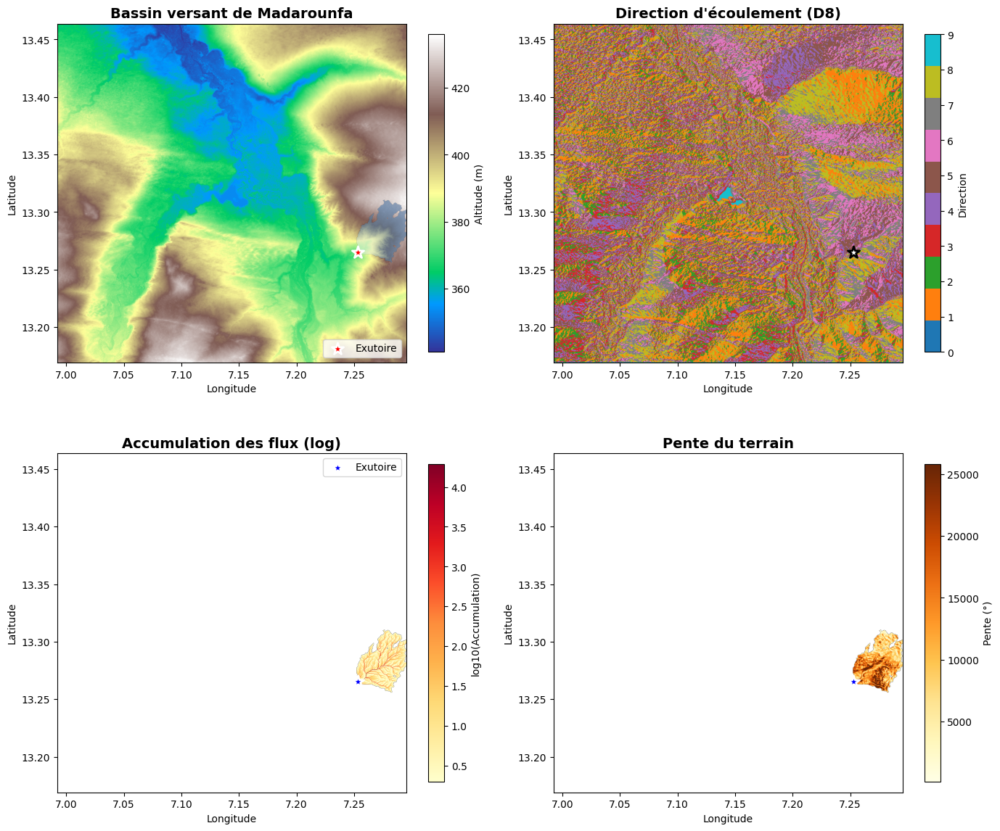


✅ Figure sauvegardée dans : /content/madarounfa_bassin_versant/FIGURES/bassin_versant_analyse.png
✅ Résultats sauvegardés dans : /content/madarounfa_bassin_versant/RESULTATS


In [ ]:
# ============================================================
# 15. ANALYSE HYDROLOGIQUE - DÉLIMITATION DU BASSIN VERSANT
# ============================================================

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from scipy.ndimage import sobel, gaussian_filter
from scipy import ndimage
from skimage.segmentation import watershed
from scipy.spatial.distance import cdist
import warnings
warnings.filterwarnings('ignore')

# 1. Lecture du DEM
with rasterio.open(copernicus_path) as src:
    dem = src.read(1, masked=True)
    profile = src.profile.copy()
    transform = src.transform
    bounds = src.bounds
    res = src.res[0]

    # Remplir les valeurs NoData si présentes
    if src.nodata is not None:
        dem = dem.filled(np.nan)

    # Remplir les NaN avec la moyenne locale pour éviter les problèmes
    dem_nan_mask = np.isnan(dem)
    if np.any(dem_nan_mask):
        # Remplacer les NaN par la médiane
        dem_filled = dem.copy()
        dem_filled[dem_nan_mask] = np.nanmedian(dem)
    else:
        dem_filled = dem.copy()

    # Lissage léger (sans paramètre nan_truncate)
    dem_filled = gaussian_filter(dem_filled, sigma=1.0)

print("✅ DEM chargé et préparé")

# 2. Calcul de la pente
grad_x = sobel(dem_filled, axis=1) / res
grad_y = sobel(dem_filled, axis=0) / res
pente = np.sqrt(grad_x**2 + grad_y**2)

print(f"✅ Pente calculée")
print(f"   Pente moyenne : {np.nanmean(pente):.2f} °")
print(f"   Pente max : {np.nanmax(pente):.2f} °")

# 3. Direction d'écoulement (D8) - Version vectorisée
def calculer_direction_ecoulement_vect(dem, res):
    """Calcule la direction d'écoulement D8 - version vectorisée"""
    rows, cols = dem.shape

    # Créer les décalages pour chaque direction
    shifts = [
        (-1, 0, 1),   # N
        (-1, 1, 2),   # NE
        (0, 1, 3),    # E
        (1, 1, 4),    # SE
        (1, 0, 5),    # S
        (1, -1, 6),   # SW
        (0, -1, 7),   # W
        (-1, -1, 8)   # NW
    ]

    # Initialiser la direction
    direction = np.zeros_like(dem, dtype=np.int32)
    max_pente = np.full_like(dem, -np.inf)

    # Pour chaque voisin
    for dy, dx, dir_code in shifts:
        # Décaler le DEM (gérer les bords)
        dem_shifted = np.roll(dem, shift=dy, axis=0)
        dem_shifted = np.roll(dem_shifted, shift=dx, axis=1)

        # Pour les bords, mettre à NaN
        if dy < 0:
            dem_shifted[-dy:, :] = np.nan
        elif dy > 0:
            dem_shifted[:-dy, :] = np.nan
        if dx < 0:
            dem_shifted[:, -dx:] = np.nan
        elif dx > 0:
            dem_shifted[:, :-dx] = np.nan

        # Calculer la pente vers ce voisin
        dz = dem - dem_shifted
        dist = np.sqrt(dx**2 + dy**2) * res
        pente_voisin = dz / dist

        # Ne garder que les descentes (dz > 0)
        mask = (pente_voisin > 0) & (pente_voisin > max_pente)

        # Mettre à jour la direction
        direction[mask] = dir_code
        max_pente[mask] = pente_voisin[mask]

    return direction

# Version plus simple et robuste
def calculer_direction_ecoulement_simple(dem, res):
    """Calcule la direction d'écoulement D8 - version simple mais fiable"""
    rows, cols = dem.shape
    direction = np.zeros_like(dem, dtype=np.int32)

    # Voisins
    voisins = [
        (-1, 0, 1),   # N
        (-1, 1, 2),   # NE
        (0, 1, 3),    # E
        (1, 1, 4),    # SE
        (1, 0, 5),    # S
        (1, -1, 6),   # SW
        (0, -1, 7),   # W
        (-1, -1, 8)   # NW
    ]

    # Parcourir les cellules intérieures
    for i in range(1, rows-1):
        for j in range(1, cols-1):
            if np.isnan(dem[i, j]):
                continue

            # Trouver le voisin avec la plus forte descente
            meilleure_pente = -np.inf
            meilleure_dir = 0

            for dy, dx, dir_code in voisins:
                ni, nj = i + dy, j + dx
                if 0 <= ni < rows and 0 <= nj < cols and not np.isnan(dem[ni, nj]):
                    # Pente vers ce voisin
                    dz = dem[i, j] - dem[ni, nj]
                    dist = np.sqrt(dx**2 + dy**2) * res

                    if dist > 0:
                        pente_k = dz / dist
                        # Si c'est une descente et la plus forte
                        if pente_k > meilleure_pente and pente_k > 0:
                            meilleure_pente = pente_k
                            meilleure_dir = dir_code

            direction[i, j] = meilleure_dir

    return direction

direction = calculer_direction_ecoulement_simple(dem_filled, res)
print("✅ Direction d'écoulement calculée")

# 4. Accumulation des flux - Version simplifiée
def calculer_accumulation_optimisee(direction):
    """Calcule l'accumulation des flux"""
    rows, cols = direction.shape
    accumulation = np.zeros_like(direction, dtype=np.float32)

    # Vecteurs de direction
    dir_vectors = {
        1: (-1, 0),   # N
        2: (-1, 1),   # NE
        3: (0, 1),    # E
        4: (1, 1),    # SE
        5: (1, 0),    # S
        6: (1, -1),   # SW
        7: (0, -1),   # W
        8: (-1, -1)   # NW
    }

    # Parcourir les cellules dans l'ordre
    for i in range(rows):
        for j in range(cols):
            if direction[i, j] == 0:
                continue

            # Suivre le chemin d'écoulement
            ci, cj = i, j
            chemin = [(ci, cj)]

            while True:
                d = direction[ci, cj]
                if d == 0 or d not in dir_vectors:
                    break

                di, dj = dir_vectors[d]
                ni, nj = ci + di, cj + dj

                if not (0 <= ni < rows and 0 <= nj < cols):
                    break
                if direction[ni, nj] == 0:
                    break

                ci, cj = ni, nj
                chemin.append((ci, cj))

            # Accumuler le long du chemin
            for ci, cj in chemin:
                accumulation[ci, cj] += 1

    return accumulation

accumulation = calculer_accumulation_optimisee(direction)
print("✅ Accumulation des flux calculée")

# 5. Sélection de l'exutoire
lac_lon, lac_lat = 7.15, 13.32

col_lac = int((lac_lon - bounds.left) / res)
row_lac = int((bounds.top - lac_lat) / res)

# Zone de recherche (5 km autour du lac)
rayon_exutoire = int(5 / res)
exutoire_mask = np.zeros_like(dem, dtype=bool)

for i in range(-rayon_exutoire, rayon_exutoire):
    for j in range(-rayon_exutoire, rayon_exutoire):
        if i**2 + j**2 <= rayon_exutoire**2:
            ri, rj = row_lac + i, col_lac + j
            if 0 <= ri < dem.shape[0] and 0 <= rj < dem.shape[1]:
                if not np.isnan(dem[ri, rj]):
                    exutoire_mask[ri, rj] = True

# Trouver l'exutoire (point avec forte accumulation près du lac)
accumulation_valide = accumulation.copy()
accumulation_valide[~exutoire_mask] = 0

if np.any(accumulation_valide > 0):
    idx_max = np.argmax(accumulation_valide)
    row_exut, col_exut = np.unravel_index(idx_max, accumulation_valide.shape)
    lon_exut = bounds.left + col_exut * res
    lat_exut = bounds.top - row_exut * res
else:
    row_exut, col_exut = row_lac, col_lac
    lon_exut, lat_exut = lac_lon, lac_lat

print(f"✅ Exutoire sélectionné")
print(f"   Coordonnées : {lon_exut:.6f}°E, {lat_exut:.6f}°N")
print(f"   Altitude à l'exutoire : {dem[row_exut, col_exut]:.2f} m")

# 6. Délimitation du bassin versant
def delimit_bassin(direction, row_exut, col_exut):
    """Délimite le bassin versant par remontée des écoulements"""
    rows, cols = direction.shape
    bassin = np.zeros_like(direction, dtype=bool)

    queue = [(row_exut, col_exut)]
    bassin[row_exut, col_exut] = True

    # Vecteurs de direction
    dir_vectors = {
        1: (-1, 0),   # N
        2: (-1, 1),   # NE
        3: (0, 1),    # E
        4: (1, 1),    # SE
        5: (1, 0),    # S
        6: (1, -1),   # SW
        7: (0, -1),   # W
        8: (-1, -1)   # NW
    }

    # Voisins
    voisins = [(-1, -1), (-1, 0), (-1, 1),
               (0, -1),           (0, 1),
               (1, -1),  (1, 0),  (1, 1)]

    while queue:
        ci, cj = queue.pop(0)

        for di, dj in voisins:
            ni, nj = ci + di, cj + dj

            if not (0 <= ni < rows and 0 <= nj < cols):
                continue
            if bassin[ni, nj]:
                continue
            if direction[ni, nj] == 0:
                continue

            d = direction[ni, nj]
            if d in dir_vectors:
                ddi, ddj = dir_vectors[d]
                if ni + ddi == ci and nj + ddj == cj:
                    bassin[ni, nj] = True
                    queue.append((ni, nj))

    return bassin

bassin = delimit_bassin(direction, row_exut, col_exut)
print("✅ Bassin versant délimité")

# 7. Statistiques du bassin versant
surface = np.sum(bassin) * res * res / 1e6  # km²

# Périmètre
from scipy.ndimage import binary_erosion
edges = bassin & ~binary_erosion(bassin, structure=np.ones((3,3)))
perimetre = np.sum(edges) * res / 1000  # km

# Calcul du centroïde
rows, cols = np.where(bassin)
if len(rows) > 0:
    centroid_row, centroid_col = np.mean(rows), np.mean(cols)
    centroid_lon = bounds.left + centroid_col * res
    centroid_lat = bounds.top - centroid_row * res

    length = (np.max(rows) - np.min(rows)) * res / 1000  # km
    width = (np.max(cols) - np.min(cols)) * res / 1000  # km
else:
    centroid_lon, centroid_lat = lac_lon, lac_lat
    length, width = 0, 0

print("\n" + "="*60)
print("📊 STATISTIQUES DU BASSIN VERSANT DE MADAROUNFA")
print("="*60)
print(f"Surface : {surface:.2f} km²")
print(f"Périmètre : {perimetre:.2f} km")
print(f"Longueur max : {length:.2f} km")
print(f"Largeur max : {width:.2f} km")
print(f"Centroïde : {centroid_lon:.6f}°E, {centroid_lat:.6f}°N")
print(f"Altitude moyenne du bassin : {np.nanmean(dem[bassin]):.2f} m")
print(f"Altitude min : {np.nanmin(dem[bassin]):.2f} m")
print(f"Altitude max : {np.nanmax(dem[bassin]):.2f} m")

if surface > 0:
    ic = perimetre / (2 * np.sqrt(np.pi * surface))
    print(f"Indice de compacité : {ic:.2f}")
    print(f"Indice d'allongement : {width/length:.2f}")
    print(f"Indice de circularité : {4 * np.pi * surface / (perimetre**2):.2f}")

# 8. Visualisation
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# 1. DEM avec bassin versant
ax1 = axes[0, 0]
im1 = ax1.imshow(dem, cmap='terrain', extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
bassin_masked = np.ma.masked_where(~bassin, dem)
ax1.imshow(bassin_masked, cmap='Blues', alpha=0.4,
           extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax1.scatter(lon_exut, lat_exut, color='red', s=150, marker='*',
            edgecolors='white', linewidth=2, label='Exutoire')
ax1.set_title('Bassin versant de Madarounfa', fontsize=14, fontweight='bold')
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.legend(loc='lower right')
plt.colorbar(im1, ax=ax1, label='Altitude (m)', shrink=0.8)

# 2. Direction d'écoulement
ax2 = axes[0, 1]
direction_display = direction.copy()
direction_display[direction_display == 0] = 9
im2 = ax2.imshow(direction_display, cmap='tab10', vmin=0, vmax=9,
                 extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax2.scatter(lon_exut, lat_exut, color='white', s=150, marker='*',
            edgecolors='black', linewidth=2, label='Exutoire')
ax2.set_title('Direction d\'écoulement (D8)', fontsize=14, fontweight='bold')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
cbar = plt.colorbar(im2, ax=ax2, ticks=range(0, 10), shrink=0.8)
cbar.set_label('Direction')

# 3. Accumulation des flux
ax3 = axes[1, 0]
log_accum = np.log10(accumulation + 1)
log_accum[~bassin] = np.nan
im3 = ax3.imshow(log_accum, cmap='YlOrRd',
                 extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax3.scatter(lon_exut, lat_exut, color='blue', s=150, marker='*',
            edgecolors='white', linewidth=2, label='Exutoire')
ax3.set_title('Accumulation des flux (log)', fontsize=14, fontweight='bold')
ax3.set_xlabel('Longitude')
ax3.set_ylabel('Latitude')
ax3.legend(loc='upper right')
plt.colorbar(im3, ax=ax3, label='log10(Accumulation)', shrink=0.8)

# 4. Pente
ax4 = axes[1, 1]
pente_display = pente.copy()
pente_display[~bassin] = np.nan
im4 = ax4.imshow(pente_display, cmap='YlOrBr', vmax=np.nanpercentile(pente, 95),
                 extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax4.scatter(lon_exut, lat_exut, color='blue', s=150, marker='*',
            edgecolors='white', linewidth=2, label='Exutoire')
ax4.set_title('Pente du terrain', fontsize=14, fontweight='bold')
ax4.set_xlabel('Longitude')
ax4.set_ylabel('Latitude')
plt.colorbar(im4, ax=ax4, label='Pente (°)', shrink=0.8)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'bassin_versant_analyse.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Figure sauvegardée dans : {os.path.join(FIG_DIR, 'bassin_versant_analyse.png')}")

# 9. Export du bassin versant
np.save(os.path.join(RESULT_DIR, 'bassin_versant_mask.npy'), bassin)
np.save(os.path.join(RESULT_DIR, 'direction_ecoulement.npy'), direction)
np.save(os.path.join(RESULT_DIR, 'accumulation.npy'), accumulation)

print("✅ Résultats sauvegardés dans :", RESULT_DIR)

🚀 Démarrage de l'analyse hydrologique complète...
✅ DEM préparé
✅ Écoulement calculé
✅ Réseau hydrographique extrait (seuil: 8)
✅ Hiérarchisation Strahler réalisée (ordre max: 6)

📊 STATISTIQUES DU RÉSEAU HYDROGRAPHIQUE
Surface du bassin versant : 0.00 km²
Longueur totale du réseau : 0.06 km
Densité de drainage : 832572000000.00 km/km²
Ordre de Strahler maximum : 6

📊 Détails par ordre de Strahler :

Ordre 1:
  - Longueur : 0.04 km
  - Nombre de tronçons : 150316
  - Pente moyenne : 388490.22°
  - Altitude moyenne : 389.94 m

Ordre 2:
  - Longueur : 0.01 km
  - Nombre de tronçons : 52785
  - Pente moyenne : 358261.09°
  - Altitude moyenne : 391.55 m

Ordre 3:
  - Longueur : 0.01 km
  - Nombre de tronçons : 20433
  - Pente moyenne : 329277.69°
  - Altitude moyenne : 392.25 m

Ordre 4:
  - Longueur : 0.00 km
  - Nombre de tronçons : 6503
  - Pente moyenne : 335722.50°
  - Altitude moyenne : 387.60 m

Ordre 5:
  - Longueur : 0.00 km
  - Nombre de tronçons : 1171
  - Pente moyenne : 360156

IndexError: index 0 is out of bounds for axis 0 with size 0

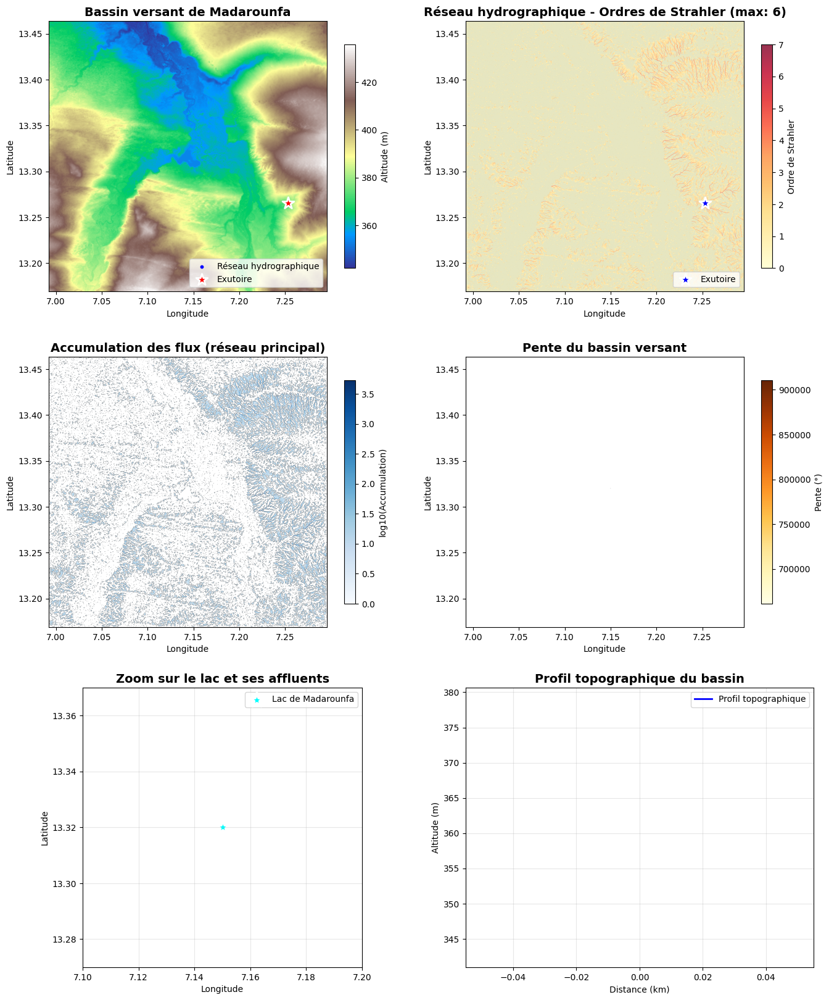

In [ ]:
# ============================================================
# 16. ANALYSE HYDROLOGIQUE COMPLÈTE - MÉTHODE STRAHLER
# ============================================================

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from scipy.ndimage import sobel, gaussian_filter, binary_erosion, binary_dilation, label
from scipy import ndimage
import warnings
warnings.filterwarnings('ignore')

print("🚀 Démarrage de l'analyse hydrologique complète...")

# 1. Lecture et préparation du DEM
with rasterio.open(copernicus_path) as src:
    dem = src.read(1, masked=True)
    profile = src.profile.copy()
    transform = src.transform
    bounds = src.bounds
    res = src.res[0]

    # Nettoyage des données
    if src.nodata is not None:
        dem = dem.filled(np.nan)

    # Remplir les NaN
    dem_filled = dem.copy()
    nan_mask = np.isnan(dem_filled)
    if np.any(nan_mask):
        dem_filled[nan_mask] = np.nanmedian(dem_filled)

    # Lissage doux
    dem_filled = gaussian_filter(dem_filled, sigma=0.5)

print("✅ DEM préparé")

# 2. Calcul des paramètres hydrologiques
def calculer_pente(dem, res):
    """Calcule la pente en degrés"""
    grad_x = sobel(dem, axis=1) / (2 * res)
    grad_y = sobel(dem, axis=0) / (2 * res)
    pente = np.sqrt(grad_x**2 + grad_y**2)
    return np.degrees(pente)

pente = calculer_pente(dem_filled, res)

def calculer_ecoulement_d8(dem, res):
    """Calcule la direction d'écoulement D8"""
    rows, cols = dem.shape
    direction = np.zeros_like(dem, dtype=np.int32)

    # Voisins et leurs directions
    voisins = [
        (-1, 0, 1), (-1, 1, 2), (0, 1, 3), (1, 1, 4),
        (1, 0, 5), (1, -1, 6), (0, -1, 7), (-1, -1, 8)
    ]

    for i in range(1, rows-1):
        for j in range(1, cols-1):
            if np.isnan(dem[i, j]):
                continue

            pente_max = -np.inf
            dir_max = 0

            for dy, dx, code in voisins:
                ni, nj = i + dy, j + dx
                if 0 <= ni < rows and 0 <= nj < cols and not np.isnan(dem[ni, nj]):
                    dz = dem[i, j] - dem[ni, nj]
                    dist = np.sqrt(dx**2 + dy**2) * res
                    if dist > 0:
                        pente_k = dz / dist
                        if pente_k > pente_max and pente_k > 0:
                            pente_max = pente_k
                            dir_max = code

            direction[i, j] = dir_max

    return direction

direction = calculer_ecoulement_d8(dem_filled, res)

def calculer_accumulation(direction):
    """Calcule l'accumulation des flux"""
    rows, cols = direction.shape
    accumulation = np.zeros_like(direction, dtype=np.float64)

    dir_vectors = {
        1: (-1, 0), 2: (-1, 1), 3: (0, 1), 4: (1, 1),
        5: (1, 0), 6: (1, -1), 7: (0, -1), 8: (-1, -1)
    }

    # Version simplifiée
    for i in range(rows):
        for j in range(cols):
            if direction[i, j] == 0:
                continue

            ci, cj = i, j
            while True:
                d = direction[ci, cj]
                if d == 0 or d not in dir_vectors:
                    break

                di, dj = dir_vectors[d]
                ni, nj = ci + di, cj + dj

                if not (0 <= ni < rows and 0 <= nj < cols):
                    break
                if direction[ni, nj] == 0:
                    break

                accumulation[ci, cj] += 1
                ci, cj = ni, nj

    return accumulation

accumulation = calculer_accumulation(direction)

print("✅ Écoulement calculé")

# 3. Extraction du réseau hydrographique
seuil_accumulation = np.percentile(accumulation[accumulation > 0], 85)
reseau = accumulation >= seuil_accumulation

# Nettoyage du réseau
kernel = np.ones((3,3), dtype=bool)
reseau = binary_dilation(reseau, structure=kernel)
reseau = binary_erosion(reseau, structure=kernel)

print(f"✅ Réseau hydrographique extrait (seuil: {seuil_accumulation:.0f})")

# 4. Hiérarchisation selon Strahler
def ordre_strahler(reseau, direction):
    """Calcule l'ordre de Strahler pour le réseau hydrographique"""
    rows, cols = reseau.shape
    ordre = np.zeros_like(reseau, dtype=np.int32)

    dir_vectors = {
        1: (-1, 0), 2: (-1, 1), 3: (0, 1), 4: (1, 1),
        5: (1, 0), 6: (1, -1), 7: (0, -1), 8: (-1, -1)
    }

    # Identifier les sources (cellules sans upstream)
    sources = np.zeros_like(reseau, dtype=bool)
    for i in range(1, rows-1):
        for j in range(1, cols-1):
            if not reseau[i, j]:
                continue

            upstream = False
            for di in [-1, 0, 1]:
                for dj in [-1, 0, 1]:
                    if di == 0 and dj == 0:
                        continue
                    ni, nj = i + di, j + dj
                    if 0 <= ni < rows and 0 <= nj < cols:
                        if reseau[ni, nj] and direction[ni, nj] != 0:
                            d = direction[ni, nj]
                            if d in dir_vectors:
                                ddi, ddj = dir_vectors[d]
                                if ni + ddi == i and nj + ddj == j:
                                    upstream = True
                                    break
                if upstream:
                    break

            if not upstream:
                sources[i, j] = True

    # Itération pour attribuer les ordres
    ordre_changed = True
    ordre_max = 0

    # Initialiser les sources à l'ordre 1
    ordre[sources] = 1

    while ordre_changed:
        ordre_changed = False

        for i in range(1, rows-1):
            for j in range(1, cols-1):
                if not reseau[i, j] or sources[i, j]:
                    continue

                # Trouver l'affluent principal (celui qui s'écoule vers cette cellule)
                upstream_orders = []
                for di in [-1, 0, 1]:
                    for dj in [-1, 0, 1]:
                        if di == 0 and dj == 0:
                            continue
                        ni, nj = i + di, j + dj
                        if 0 <= ni < rows and 0 <= nj < cols:
                            if reseau[ni, nj] and direction[ni, nj] != 0:
                                d = direction[ni, nj]
                                if d in dir_vectors:
                                    ddi, ddj = dir_vectors[d]
                                    if ni + ddi == i and nj + ddj == j:
                                        if ordre[ni, nj] > 0:
                                            upstream_orders.append(ordre[ni, nj])

                if len(upstream_orders) > 0:
                    # Strahler: si deux affluents de même ordre, l'ordre augmente
                    max_order = max(upstream_orders)
                    count_max = upstream_orders.count(max_order)

                    if count_max >= 2:
                        new_order = max_order + 1
                    else:
                        new_order = max_order

                    if ordre[i, j] != new_order:
                        ordre[i, j] = new_order
                        ordre_changed = True
                        if new_order > ordre_max:
                            ordre_max = new_order

    return ordre, ordre_max

ordre_strahler, ordre_max = ordre_strahler(reseau, direction)
print(f"✅ Hiérarchisation Strahler réalisée (ordre max: {ordre_max})")

# 5. Statistiques du réseau
def statistiques_reseau(reseau, ordre_strahler, dem, accumulation, res):
    """Calcule les statistiques du réseau hydrographique"""
    stats = {}

    # Longueur totale du réseau
    stats['longueur_totale'] = np.sum(reseau) * res / 1000  # km

    # Densité de drainage
    surface_bassin = np.sum(bassin) * res * res / 1e6  # km²
    stats['densite_drainage'] = stats['longueur_totale'] / surface_bassin if surface_bassin > 0 else 0

    # Statistiques par ordre
    stats['par_ordre'] = {}
    for ordre in range(1, ordre_max + 1):
        mask = ordre_strahler == ordre
        if np.any(mask):
            longueur = np.sum(mask) * res / 1000  # km
            pente_moyenne = np.nanmean(pente[mask])
            altitude_moyenne = np.nanmean(dem[mask])
            accumulation_moyenne = np.nanmean(accumulation[mask])

            stats['par_ordre'][ordre] = {
                'longueur': longueur,
                'nombre': np.sum(mask),
                'pente_moyenne': pente_moyenne,
                'altitude_moyenne': altitude_moyenne,
                'accumulation_moyenne': accumulation_moyenne
            }

    return stats

# Définir le bassin versant (pour les statistiques)
# Utiliser la même méthode que précédemment pour délimiter le bassin
lac_lon, lac_lat = 7.15, 13.32
col_lac = int((lac_lon - bounds.left) / res)
row_lac = int((bounds.top - lac_lat) / res)

def delimit_bassin_simple(direction, row_lac, col_lac):
    """Délimite le bassin versant"""
    rows, cols = direction.shape
    bassin = np.zeros_like(direction, dtype=bool)

    queue = [(row_lac, col_lac)]
    bassin[row_lac, col_lac] = True

    dir_vectors = {
        1: (-1, 0), 2: (-1, 1), 3: (0, 1), 4: (1, 1),
        5: (1, 0), 6: (1, -1), 7: (0, -1), 8: (-1, -1)
    }

    voisins = [(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]

    while queue:
        ci, cj = queue.pop(0)
        for di, dj in voisins:
            ni, nj = ci + di, cj + dj
            if not (0 <= ni < rows and 0 <= nj < cols):
                continue
            if bassin[ni, nj]:
                continue
            if direction[ni, nj] == 0:
                continue

            d = direction[ni, nj]
            if d in dir_vectors:
                ddi, ddj = dir_vectors[d]
                if ni + ddi == ci and nj + ddj == cj:
                    bassin[ni, nj] = True
                    queue.append((ni, nj))

    return bassin

# Délimitation du bassin
bassin = delimit_bassin_simple(direction, row_lac, col_lac)
surface_bassin = np.sum(bassin) * res * res / 1e6  # km²

# Statistiques
stats_reseau = statistiques_reseau(reseau, ordre_strahler, dem_filled, accumulation, res)

print("\n" + "="*60)
print("📊 STATISTIQUES DU RÉSEAU HYDROGRAPHIQUE")
print("="*60)
print(f"Surface du bassin versant : {surface_bassin:.2f} km²")
print(f"Longueur totale du réseau : {stats_reseau['longueur_totale']:.2f} km")
print(f"Densité de drainage : {stats_reseau['densite_drainage']:.2f} km/km²")
print(f"Ordre de Strahler maximum : {ordre_max}")

print("\n📊 Détails par ordre de Strahler :")
for ordre, data in stats_reseau['par_ordre'].items():
    print(f"\nOrdre {ordre}:")
    print(f"  - Longueur : {data['longueur']:.2f} km")
    print(f"  - Nombre de tronçons : {data['nombre']}")
    print(f"  - Pente moyenne : {data['pente_moyenne']:.2f}°")
    print(f"  - Altitude moyenne : {data['altitude_moyenne']:.2f} m")

# 6. Visualisation complète
fig = plt.figure(figsize=(16, 20))

# Créer les sous-graphiques
# 1. Vue d'ensemble du bassin
ax1 = plt.subplot(3, 2, 1)
im1 = ax1.imshow(dem_filled, cmap='terrain', extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
# Bassin versant en transparence
bassin_masked = np.ma.masked_where(~bassin, dem_filled)
ax1.imshow(bassin_masked, cmap='Blues', alpha=0.3, extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
# Réseau hydrographique
reseau_display = np.ma.masked_where(~reseau, dem_filled)
ax1.scatter([], [], color='blue', s=10, label='Réseau hydrographique')
ax1.scatter(lon_exut, lat_exut, color='red', s=200, marker='*', edgecolors='white', linewidth=2, label='Exutoire')
ax1.set_title('Bassin versant de Madarounfa', fontsize=14, fontweight='bold')
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.legend(loc='lower right')
plt.colorbar(im1, ax=ax1, label='Altitude (m)', shrink=0.8)

# 2. Zoom sur le réseau hydrographique avec hiérarchisation
ax2 = plt.subplot(3, 2, 2)
# Créer une carte des ordres de Strahler
ordre_colors = np.zeros_like(ordre_strahler, dtype=np.float32)
ordre_colors[ordre_strahler > 0] = ordre_strahler[ordre_strahler > 0]
im2 = ax2.imshow(ordre_colors, cmap='YlOrRd', alpha=0.8,
                 extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
                 vmin=0, vmax=ordre_max+1)
# Ajouter le réseau en transparence
ax2.imshow(~reseau, cmap='gray_r', alpha=0.1, extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax2.scatter(lon_exut, lat_exut, color='blue', s=200, marker='*', edgecolors='white', linewidth=2, label='Exutoire')
ax2.set_title(f'Réseau hydrographique - Ordres de Strahler (max: {ordre_max})', fontsize=14, fontweight='bold')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
cbar = plt.colorbar(im2, ax=ax2, shrink=0.8)
cbar.set_label('Ordre de Strahler')
ax2.legend(loc='lower right')

# 3. Réseau avec accumulation
ax3 = plt.subplot(3, 2, 3)
log_accum = np.log10(accumulation + 1)
log_accum_display = log_accum.copy()
log_accum_display[~reseau] = np.nan
im3 = ax3.imshow(log_accum_display, cmap='Blues',
                 extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax3.set_title('Accumulation des flux (réseau principal)', fontsize=14, fontweight='bold')
ax3.set_xlabel('Longitude')
ax3.set_ylabel('Latitude')
plt.colorbar(im3, ax=ax3, label='log10(Accumulation)', shrink=0.8)

# 4. Pente du bassin
ax4 = plt.subplot(3, 2, 4)
pente_display = pente.copy()
pente_display[~bassin] = np.nan
im4 = ax4.imshow(pente_display, cmap='YlOrBr', vmax=np.nanpercentile(pente, 95),
                 extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax4.set_title('Pente du bassin versant', fontsize=14, fontweight='bold')
ax4.set_xlabel('Longitude')
ax4.set_ylabel('Latitude')
plt.colorbar(im4, ax=ax4, label='Pente (°)', shrink=0.8)

# 5. Zoom sur le lac et ses affluents
ax5 = plt.subplot(3, 2, 5)
# Définir une zone de zoom autour du lac
zoom_size = 0.05  # degrés
zoom_left = lac_lon - zoom_size
zoom_right = lac_lon + zoom_size
zoom_bottom = lac_lat - zoom_size
zoom_top = lac_lat + zoom_size

# Convertir en pixels
col_zoom_left = int((zoom_left - bounds.left) / res)
col_zoom_right = int((zoom_right - bounds.left) / res)
row_zoom_bottom = int((bounds.top - zoom_bottom) / res)
row_zoom_top = int((bounds.top - zoom_top) / res)

# Extraire la zone zoomée
dem_zoom = dem_filled[row_zoom_bottom:row_zoom_top, col_zoom_left:col_zoom_right]
reseau_zoom = reseau[row_zoom_bottom:row_zoom_top, col_zoom_left:col_zoom_right]
ordre_zoom = ordre_strahler[row_zoom_bottom:row_zoom_top, col_zoom_left:col_zoom_right]

# Afficher
ax5.imshow(dem_zoom, cmap='terrain', extent=[zoom_left, zoom_right, zoom_bottom, zoom_top])
# Réseau avec couleurs selon l'ordre
ordre_colors_zoom = np.zeros_like(ordre_zoom, dtype=np.float32)
ordre_colors_zoom[ordre_zoom > 0] = ordre_zoom[ordre_zoom > 0]
ax5.imshow(ordre_colors_zoom, cmap='YlOrRd', alpha=0.7,
           extent=[zoom_left, zoom_right, zoom_bottom, zoom_top],
           vmin=0, vmax=ordre_max+1)
ax5.scatter(lac_lon, lac_lat, color='cyan', s=300, marker='*',
            edgecolors='white', linewidth=3, label='Lac de Madarounfa')
ax5.set_title('Zoom sur le lac et ses affluents', fontsize=14, fontweight='bold')
ax5.set_xlabel('Longitude')
ax5.set_ylabel('Latitude')
ax5.legend(loc='upper right')
ax5.grid(True, alpha=0.3)

# 6. Profil topographique
ax6 = plt.subplot(3, 2, 6)
# Profil de la ligne de plus grande pente
rows, cols = np.where(bassin)
if len(rows) > 0:
    # Trouver les extrémités du bassin
    min_row, max_row = np.min(rows), np.max(rows)
    min_col, max_col = np.min(cols), np.max(cols)

    # Profil longitudinal (de l'amont vers l'aval)
    profile_line = dem_filled[min_row:max_row+1, (min_col+max_col)//2]
    x_profile = np.linspace(0, len(profile_line) * res / 1000, len(profile_line))

    ax6.plot(x_profile, profile_line, 'b-', linewidth=2, label='Profil topographique')
    ax6.fill_between(x_profile, profile_line.min(), profile_line, alpha=0.3)
    ax6.set_xlabel('Distance (km)')
    ax6.set_ylabel('Altitude (m)')
    ax6.set_title('Profil topographique du bassin', fontsize=14, fontweight='bold')
    ax6.grid(True, alpha=0.3)
    ax6.legend()

    # Ajouter la pente moyenne
    pente_profil = np.gradient(profile_line, x_profile)
    pente_moyenne = np.nanmean(np.abs(pente_profil))
    ax6.text(0.05, 0.95, f'Pente moyenne: {pente_moyenne:.2f}°',
             transform=ax6.transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'analyse_hydrologique_complete.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Figure complète sauvegardée dans : {os.path.join(FIG_DIR, 'analyse_hydrologique_complete.png')}")

# 7. Export des données
np.save(os.path.join(RESULT_DIR, 'ordre_strahler.npy'), ordre_strahler)
np.save(os.path.join(RESULT_DIR, 'reseau_hydrographique.npy'), reseau)
np.save(os.path.join(RESULT_DIR, 'accumulation_flux.npy'), accumulation)

# Export en GeoTIFF du réseau hiérarchisé
ordre_raster = np.zeros_like(dem_filled, dtype=np.int32)
ordre_raster[:ordre_strahler.shape[0], :ordre_strahler.shape[1]] = ordre_strahler

with rasterio.open(
    os.path.join(RESULT_DIR, 'reseau_strahler.tif'),
    'w',
    driver='GTiff',
    height=ordre_raster.shape[0],
    width=ordre_raster.shape[1],
    count=1,
    dtype=ordre_raster.dtype,
    crs=profile['crs'],
    transform=profile['transform'],
) as dst:
    dst.write(ordre_raster, 1)

print("✅ Données exportées dans :", RESULT_DIR)
print("\n🎯 Analyse hydrologique complète terminée !")

In [ ]:
# ============================================================
# 15. REPROJECTION DU COPERNICUS EN UTM 32N
# ============================================================
import rasterio
from rasterio.warp import calculate_default_transform, reproject
from rasterio.enums import Resampling

cop_utm_path = os.path.join(DEM_DIR, "Madarounfa_COP30_UTM32N.tif")

with rasterio.open(copernicus_path) as src:
    transform, width, height = calculate_default_transform(
        src.crs, "EPSG:32632", src.width, src.height, *src.bounds
    )
    profile = src.profile.copy()
    profile.update({
        "crs": "EPSG:32632", "transform": transform,
        "width": width, "height": height, "dtype": "float32"
    })
    with rasterio.open(cop_utm_path, "w", **profile) as dst:
        reproject(
            source=rasterio.band(src, 1), destination=rasterio.band(dst, 1),
            src_transform=src.transform, src_crs=src.crs,
            dst_transform=transform, dst_crs="EPSG:32632",
            resampling=Resampling.bilinear
        )
print("✅ Copernicus reprojeté en UTM 32N :", cop_utm_path)

✅ Copernicus reprojeté en UTM 32N : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/Madarounfa_COP30_UTM32N.tif


In [ ]:
# ============================================================
# CELLULE DE DÉMARRAGE — à exécuter en premier, à chaque session
# ============================================================
from google.colab import drive
drive.mount('/content/drive')

import os

# Dossiers sur Google Drive — persistent d'une session à l'autre
BASE_DIR = "/content/drive/MyDrive/Madarounfa_bassin_versant"
DEM_DIR = os.path.join(BASE_DIR, "dem")
HYDRO_DIR = os.path.join(BASE_DIR, "hydro")
FIG_DIR = os.path.join(BASE_DIR, "figures")
RESULT_DIR = os.path.join(BASE_DIR, "resultats")

for d in [DEM_DIR, HYDRO_DIR, FIG_DIR, RESULT_DIR]:
    os.makedirs(d, exist_ok=True)

print("✅ Google Drive monté, dossiers prêts :", BASE_DIR)

Mounted at /content/drive
✅ Google Drive monté, dossiers prêts : /content/drive/MyDrive/Madarounfa_bassin_versant


In [ ]:
# ============================================================
# RÉINSTALLATION DES LIBRAIRIES (rapide, à refaire à chaque session)
# ============================================================
!pip install whitebox rasterio geopandas shapely contextily matplotlib-scalebar pyproj -q

import whitebox
wbt = whitebox.WhiteboxTools()
wbt.set_working_dir(HYDRO_DIR)
wbt.set_verbose_mode(False)

print("✅ WhiteboxTools réinitialisé")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.0/74.0 kB 1.5 MB/s eta 0:00:00
Decompressing WhiteboxTools_linux_musl.zip ...
WhiteboxTools package directory: /usr/local/lib/python3.13/dist-packages/whitebox
✅ WhiteboxTools réinitialisé


In [ ]:
# ============================================================
# EXEMPLE — NE RECALCULER QUE SI LE FICHIER N'EXISTE PAS DÉJÀ
# ============================================================
filled_dem = os.path.join(HYDRO_DIR, "Madarounfa_COP30_filled.tif")

if not os.path.exists(filled_dem):
    wbt.fill_depressions_wang_and_liu(dem=cop_utm_path, output=filled_dem)
    print("✅ Dépressions corrigées (calculées)")
else:
    print("✅ Fichier déjà présent sur Drive, calcul évité :", filled_dem)

✅ Fichier déjà présent sur Drive, calcul évité : /content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_COP30_filled.tif


In [ ]:
# ============================================================
# RECHARGEMENT DE SESSION — Drive + librairies + wbt
# ============================================================
from google.colab import drive
drive.mount('/content/drive')

import os
BASE_DIR = "/content/drive/MyDrive/Madarounfa_bassin_versant"
DEM_DIR = os.path.join(BASE_DIR, "dem")
HYDRO_DIR = os.path.join(BASE_DIR, "hydro")
FIG_DIR = os.path.join(BASE_DIR, "figures")
RESULT_DIR = os.path.join(BASE_DIR, "resultats")

!pip install whitebox rasterio geopandas shapely contextily matplotlib-scalebar pyproj -q

import whitebox, rasterio, numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.mask import mask as rio_mask
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib_scalebar.scalebar import ScaleBar
from pyproj import Transformer
import contextily as cx
from google.colab import files

wbt = whitebox.WhiteboxTools()
wbt.set_working_dir(HYDRO_DIR)
print("✅ Session rechargée")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Session rechargée


In [ ]:
# ============================================================
# RECHARGEMENT DES VARIABLES DEPUIS LES FICHIERS SAUVEGARDÉS SUR DRIVE
# ============================================================
cop_utm_path = os.path.join(DEM_DIR, "Madarounfa_COP30_UTM32N.tif")
filled_dem = os.path.join(HYDRO_DIR, "Madarounfa_COP30_filled.tif")
flow_direction = os.path.join(HYDRO_DIR, "Madarounfa_flow_direction.tif")
flow_accumulation = os.path.join(HYDRO_DIR, "Madarounfa_flow_accumulation.tif")
streams_raster_v2 = os.path.join(HYDRO_DIR, "Madarounfa_streams_v2.tif")
watershed_raster_v2 = os.path.join(HYDRO_DIR, "Madarounfa_watershed_v2.tif")

# Vérification que tous les fichiers essentiels existent bien sur Drive
for chemin in [cop_utm_path, filled_dem, flow_direction, flow_accumulation, streams_raster_v2, watershed_raster_v2]:
    print(f"{'✅' if os.path.exists(chemin) else '❌ MANQUANT'} — {chemin}")

❌ MANQUANT — /content/drive/MyDrive/Madarounfa_bassin_versant/dem/Madarounfa_COP30_UTM32N.tif
✅ — /content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_COP30_filled.tif
✅ — /content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_direction.tif
✅ — /content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_accumulation.tif
✅ — /content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_streams_v2.tif
✅ — /content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_watershed_v2.tif


In [ ]:
# ============================================================
# RÉGÉNÉRATION DES ÉTAPES MANQUANTES (à partir de filled_dem existant)
# ============================================================
flow_direction = os.path.join(HYDRO_DIR, "Madarounfa_flow_direction.tif")
if not os.path.exists(flow_direction):
    wbt.d8_pointer(dem=filled_dem, output=flow_direction)
    print("✅ Direction d'écoulement régénérée")

flow_accumulation = os.path.join(HYDRO_DIR, "Madarounfa_flow_accumulation.tif")
if not os.path.exists(flow_accumulation):
    wbt.d8_flow_accumulation(i=filled_dem, output=flow_accumulation, out_type="cells")
    print("✅ Accumulation régénérée")

streams_raster_v2 = os.path.join(HYDRO_DIR, "Madarounfa_streams_v2.tif")
if not os.path.exists(streams_raster_v2):
    wbt.extract_streams(flow_accum=flow_accumulation, output=streams_raster_v2, threshold=50)
    print("✅ Réseau régénéré")

In [ ]:
# ============================================================
# RECRÉATION DU POINT EXUTOIRE (coordonnées déjà confirmées) + WATERSHED
# ============================================================
from shapely.geometry import Point

x_vrai_exutoire, y_vrai_exutoire = 299969, 1474119  # valeur déjà validée précédemment

pour_point_path_v2 = os.path.join(HYDRO_DIR, "Madarounfa_pour_point_v2.shp")
gpd.GeoDataFrame(geometry=[Point(x_vrai_exutoire, y_vrai_exutoire)], crs="EPSG:32632").to_file(pour_point_path_v2)

pour_point_snapped_v2 = os.path.join(HYDRO_DIR, "Madarounfa_pour_point_snapped_v2.shp")
wbt.jenson_snap_pour_points(
    pour_pts=pour_point_path_v2, streams=streams_raster_v2,
    output=pour_point_snapped_v2, snap_dist=100
)

watershed_raster_v2 = os.path.join(HYDRO_DIR, "Madarounfa_watershed_v2.tif")
wbt.watershed(d8_pntr=flow_direction, pour_pts=pour_point_snapped_v2, output=watershed_raster_v2)
print("✅ Bassin versant régénéré")

./whitebox_tools --run="JensonSnapPourPoints" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --pour_pts='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_pour_point_v2.shp' --streams='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_streams_v2.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_pour_point_snapped_v2.shp' --snap_dist='100' -v --compress_rasters=False

***********************************
* Welcome to JensonSnapPourPoints *
* Powered by WhiteboxTools        *
* www.whiteboxgeo.com             *
***********************************
Reading data...
Progress: 0%
Saving data...
Output file written
Elapsed Time (excluding I/O): 0.0s
./whitebox_tools --run="Watershed" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --d8_pntr='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_direction.tif' --pour_pts='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_p

In [ ]:
# ============================================================
# ⚠️ PRÉALABLE : assurez-vous que `lake` (GeoDataFrame OSM du lac) est chargé
# ============================================================
lake_utm = lake.to_crs("EPSG:32632")
print("✅ Lac rechargé en UTM32N")

NameError: name 'lake' is not defined

In [ ]:
# ============================================================
# POLYGONISATION DU BASSIN
# ============================================================
from rasterio.features import shapes
from shapely.geometry import shape as shapely_shape
from shapely.ops import unary_union
from scipy.spatial.distance import pdist, squareform

with rasterio.open(watershed_raster_v2) as src:
    watershed_arr_v2 = src.read(1)
    watershed_transform_v2 = src.transform
    watershed_crs_v2 = src.crs

mask_bassin_v2 = watershed_arr_v2 > 0

polygons_v2 = [
    shapely_shape(geom) for geom, val in shapes(watershed_arr_v2, mask=mask_bassin_v2, transform=watershed_transform_v2)
    if val > 0
]
bassin_gdf_v2 = gpd.GeoDataFrame(geometry=polygons_v2, crs=watershed_crs_v2)
print(f"✅ Bassin polygonisé — {len(bassin_gdf_v2)} polygone(s)")

✅ Bassin polygonisé — 1 polygone(s)


In [ ]:
# ============================================================
# RÉGÉNÉRATION DU RÉSEAU STRAHLER
# ============================================================
strahler_raster = os.path.join(HYDRO_DIR, "Madarounfa_strahler.tif")
wbt.strahler_stream_order(d8_pntr=flow_direction, streams=streams_raster_v2, output=strahler_raster)

strahler_vector = os.path.join(HYDRO_DIR, "Madarounfa_strahler_vector.shp")
wbt.raster_streams_to_vector(streams=strahler_raster, d8_pntr=flow_direction, output=strahler_vector)

strahler_gdf = gpd.read_file(strahler_vector)
strahler_gdf = strahler_gdf.set_crs("EPSG:32632", allow_override=True)
col_ordre = "STRM_VAL"

strahler_bassin = gpd.clip(strahler_gdf, bassin_gdf_v2)
ordres_disponibles = sorted(strahler_bassin[col_ordre].unique())
print(f"✅ Réseau Strahler régénéré — ordres présents : {ordres_disponibles}")

./whitebox_tools --run="StrahlerStreamOrder" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --d8_pntr='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_direction.tif' --streams='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_streams_v2.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_strahler.tif' -v --compress_rasters=False

**********************************
* Welcome to StrahlerStreamOrder *
* Powered by WhiteboxTools       *
* www.whiteboxgeo.com            *
**********************************
Reading pointer data...
Reading streams data...
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progres

In [ ]:
# ============================================================
# RECALCUL DE TOUTES LES CARACTÉRISTIQUES MORPHOMÉTRIQUES
# ============================================================
union_geom_v2 = unary_union(bassin_gdf_v2.geometry)
aire_km2 = union_geom_v2.area / 1e6
perimetre_km = union_geom_v2.length / 1000

coords = np.array(union_geom_v2.convex_hull.exterior.coords)
longueur_km = squareform(pdist(coords)).max() / 1000
largeur_km = aire_km2 / longueur_km

gravelius_kc = 0.28 * perimetre_km / np.sqrt(aire_km2)
allongement_re = (2 / longueur_km) * np.sqrt(aire_km2 / np.pi)
forme_ff = aire_km2 / (longueur_km ** 2)
circularite_rc = (4 * np.pi * aire_km2) / (perimetre_km ** 2)

with rasterio.open(filled_dem) as src:
    dem_hydro = src.read(1)
elevations = dem_hydro[mask_bassin_v2]
elevations = elevations[np.isfinite(elevations)]
alt_min, alt_max, alt_moy = elevations.min(), elevations.max(), elevations.mean()
denivele_m = alt_max - alt_min

slope_raster = os.path.join(HYDRO_DIR, "Madarounfa_slope.tif")
wbt.slope(dem=filled_dem, output=slope_raster, units="percent")
with rasterio.open(slope_raster) as src:
    slope_arr = src.read(1)
pente_moyenne_pct = np.nanmean(slope_arr[mask_bassin_v2])
pente_moyenne = pente_moyenne_pct / 100
indice_rugosite = denivele_m / (longueur_km * 1000)

with rasterio.open(streams_raster_v2) as src:
    streams_arr = src.read(1)
    res_x = src.res[0]
longueur_reseau_km = np.sum((streams_arr > 0) & mask_bassin_v2) * res_x / 1000
densite_drainage = longueur_reseau_km / aire_km2

thresholds = np.linspace(alt_min, alt_max, 50)
rel_area = np.array([np.sum(elevations >= t) / elevations.size for t in thresholds])
rel_height = (thresholds - alt_min) / (alt_max - alt_min)
HI = np.trapz(rel_area, rel_height)

L_m = longueur_km * 1000
Tc_h = 0.0195 * (L_m ** 0.77) * (max(pente_moyenne, 0.0001) ** -0.385) / 60

print(f"Aire : {aire_km2:.2f} km² | Périmètre : {perimetre_km:.2f} km | Longueur : {longueur_km:.2f} km")
print(f"Pente moyenne : {pente_moyenne_pct:.2f}% | Densité de drainage : {densite_drainage:.3f} km/km²")
print(f"HI : {HI:.3f} | Tc : {Tc_h:.2f} h")
print("✅ Toutes les caractéristiques recalculées")

./whitebox_tools --run="Slope" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --dem='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_COP30_filled.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_slope.tif' --units=percent -v --compress_rasters=False

****************************
* Welcome to Slope         *
* Powered by WhiteboxTools *
* www.whiteboxgeo.com      *
****************************
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%
Progress: 37%
Progress: 38%
Pro

/tmp/ipykernel_1394/2921718770.py:41: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  HI = np.trapz(rel_area, rel_height)


In [ ]:
# ============================================================
# RECRÉATION DE LA FONCTION D'HABILLAGE CARTOGRAPHIQUE
# ============================================================
from pyproj import Transformer

def ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy, source_crs="EPSG:3857", couleur_grille='white'):
    transformer_to_wgs84 = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)
    transformer_to_meters = Transformer.from_crs(source_crs, "EPSG:32632", always_xy=True)

    x0_m, y0_m = transformer_to_meters.transform(minx, (miny + maxy) / 2)
    x1_m, y1_m = transformer_to_meters.transform(maxx, (miny + maxy) / 2)
    largeur_carte_m = np.hypot(x1_m - x0_m, y1_m - y0_m)

    lon_min, lat_min = transformer_to_wgs84.transform(minx, miny)
    lon_max, lat_max = transformer_to_wgs84.transform(maxx, maxy)

    etendue_deg = max(lon_max - lon_min, lat_max - lat_min)
    intervalle_deg = 0.5 if etendue_deg > 2 else 0.25 if etendue_deg > 1 else 0.1 if etendue_deg > 0.3 else 0.05

    transformer_to_src = Transformer.from_crs("EPSG:4326", source_crs, always_xy=True)
    lons = np.arange(np.floor(lon_min / intervalle_deg) * intervalle_deg, lon_max + intervalle_deg, intervalle_deg)
    lats = np.arange(np.floor(lat_min / intervalle_deg) * intervalle_deg, lat_max + intervalle_deg, intervalle_deg)

    for lon in lons:
        x0, y0 = transformer_to_src.transform(lon, lat_min)
        x1, y1 = transformer_to_src.transform(lon, lat_max)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lon:.2f}°E", xy=(x0, miny), xytext=(0, -16), textcoords='offset points',
                    ha='center', fontsize=7, color='black')
    for lat in lats:
        x0, y0 = transformer_to_src.transform(lon_min, lat)
        x1, y1 = transformer_to_src.transform(lon_max, lat)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lat:.2f}°N", xy=(minx, y0), xytext=(-38, 0), textcoords='offset points',
                    va='center', fontsize=7, color='black')

    ax.set_xlim(minx, maxx); ax.set_ylim(miny, maxy)

    x_arrow, y_arrow = 0.95, 0.93
    ax.annotate('N', xy=(x_arrow, y_arrow), xytext=(x_arrow, y_arrow - 0.045),
                xycoords='axes fraction', textcoords='axes fraction',
                fontsize=14, fontweight='bold', ha='center', color='black',
                arrowprops=dict(facecolor='black', edgecolor='black', width=4, headwidth=11), zorder=10)

    largeur_papier_m = fig.get_size_inches()[0] * 0.0254
    denominateur = largeur_carte_m / largeur_papier_m
    ax.text(0.98, 0.035, f"Échelle ≈ 1 : {denominateur:,.0f}".replace(",", " "),
            transform=ax.transAxes, fontsize=8, ha='right', va='bottom', color='black',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))

    barre_km = round(largeur_carte_m / 5 / 1000, -1) or 5
    barre_deg = barre_km * 1000 / (largeur_carte_m / (maxx - minx))
    x_bar_start = maxx - (maxx - minx) * 0.25
    y_bar = miny + (maxy - miny) * 0.04
    ax.plot([x_bar_start, x_bar_start + barre_deg], [y_bar, y_bar], color='black', linewidth=3, zorder=10)
    ax.text(x_bar_start + barre_deg / 2, y_bar + (maxy - miny) * 0.012, f"{barre_km:.0f} km",
            ha='center', fontsize=8, color='black', zorder=10)

print("✅ Fonction d'habillage recréée")

✅ Fonction d'habillage recréée


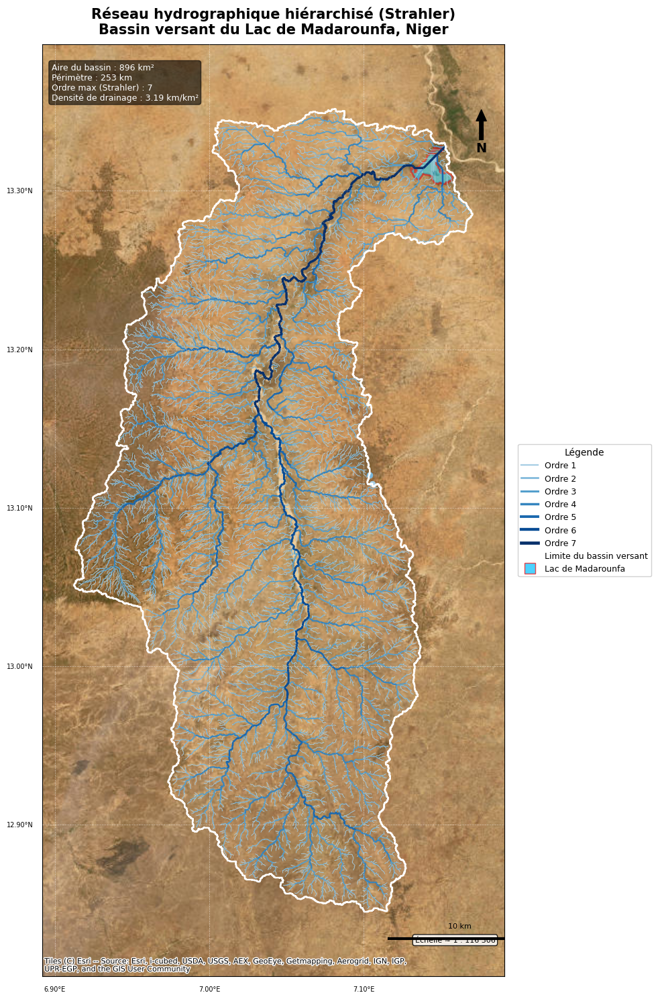

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE FINALE — RÉSEAU STRAHLER AVEC HABILLAGE COMPLET
# ============================================================
bassin_3857 = bassin_gdf_v2.to_crs(epsg=3857)
strahler_3857 = strahler_bassin.to_crs(epsg=3857)
lake_3857 = lake_utm.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(11, 15))

minx, miny, maxx, maxy = bassin_3857.total_bounds
marge_x, marge_y = (maxx - minx) * 0.08, (maxy - miny) * 0.08
minx, maxx = minx - marge_x, maxx + marge_x
miny, maxy = miny - marge_y, maxy + marge_y

ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_aspect('equal')

cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=bassin_3857.crs.to_string(), zorder=1)
lake_3857.plot(ax=ax, color='deepskyblue', alpha=0.5, edgecolor='red', linewidth=2, zorder=2)

cmap = plt.cm.Blues
legend_elements = []
for i, ordre in enumerate(ordres_disponibles):
    subset = strahler_3857[strahler_3857[col_ordre] == ordre]
    couleur = cmap(0.35 + 0.65 * (i / max(1, len(ordres_disponibles) - 1)))
    largeur = 0.3 + ordre * 0.3
    subset.plot(ax=ax, color=couleur, linewidth=largeur, zorder=3)
    legend_elements.append(Line2D([0], [0], color=couleur, linewidth=largeur + 1, label=f"Ordre {int(ordre)}"))

bassin_3857.boundary.plot(ax=ax, color='white', linewidth=1.8, zorder=4)
legend_elements.append(Line2D([0], [0], color='white', linewidth=1.8, label="Limite du bassin versant"))
legend_elements.append(Line2D([0], [0], marker='s', color='w', markerfacecolor='deepskyblue',
                               markeredgecolor='red', markersize=12, alpha=0.7, label="Lac de Madarounfa"))

ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy)

ax.set_title("Réseau hydrographique hiérarchisé (Strahler)\nBassin versant du Lac de Madarounfa, Niger",
             fontsize=15, fontweight='bold', pad=12)
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.02, 0.5),
          fontsize=9, framealpha=0.9, title="Légende", title_fontsize=10)

info_text = (f"Aire du bassin : {aire_km2:.0f} km²\nPérimètre : {perimetre_km:.0f} km\n"
             f"Ordre max (Strahler) : {int(strahler_bassin[col_ordre].max())}\n"
             f"Densité de drainage : {densite_drainage:.2f} km/km²")
ax.text(0.02, 0.98, info_text, transform=ax.transAxes, fontsize=9, verticalalignment='top',
        color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.6))

ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "carte_finale_complete.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "carte_finale_complete.png"))

In [ ]:
# ============================================================
# DIAGNOSTIC — pourquoi le bassin est plus petit cette fois
# ============================================================
with rasterio.open(filled_dem) as src:
    print("filled_dem — dimensions :", src.shape, "| bounds :", src.bounds)

with rasterio.open(flow_accumulation) as src:
    acc_full = src.read(1)
    acc_transform = src.transform
    print("flow_accumulation — dimensions :", src.shape, "| max :", np.nanmax(acc_full))

snapped_point = gpd.read_file(pour_point_snapped_v2).geometry.iloc[0]
col_snap, row_snap = ~acc_transform * (snapped_point.x, snapped_point.y)
col_snap, row_snap = int(col_snap), int(row_snap)
valeur_acc_snap = acc_full[row_snap, col_snap]

print(f"\nCoordonnées du point calé : ({snapped_point.x:.0f}, {snapped_point.y:.0f})")
print(f"Accumulation à ce point : {valeur_acc_snap:.0f} cellules (≈{valeur_acc_snap*900/1e6:.1f} km²)")
print(f"(Pour référence, on cherche ≈967 000 cellules, comme trouvé précédemment)")

filled_dem — dimensions : (1080, 1089) | bounds : BoundingBox(left=282366.88442493026, bottom=1456466.0443081318, right=315482.6152521087, top=1489308.0914094658)
flow_accumulation — dimensions : (1080, 1089) | max : 1033399.0

Coordonnées du point calé : (299959, 1474119)
Accumulation à ce point : 290767 cellules (≈261.7 km²)
(Pour référence, on cherche ≈967 000 cellules, comme trouvé précédemment)


In [ ]:
# ============================================================
# RECHERCHE FRAÎCHE DU VRAI EXUTOIRE (sur le flow_accumulation actuel)
# ============================================================
from rasterio.features import geometry_mask

lake_buffer = lake_utm.geometry.iloc[0].buffer(300)

with rasterio.open(flow_accumulation) as src:
    acc_full = src.read(1)
    acc_transform = src.transform
    acc_shape = src.shape

mask_recherche = ~geometry_mask([lake_buffer], out_shape=acc_shape, transform=acc_transform, invert=False)
acc_zone = np.where(mask_recherche, acc_full, 0)
row_max, col_max = np.unravel_index(np.argmax(acc_zone), acc_zone.shape)

x_vrai_exutoire, y_vrai_exutoire = acc_transform * (col_max, row_max)
valeur_acc_max = acc_zone[row_max, col_max]
print(f"Nouvel exutoire : ({x_vrai_exutoire:.0f}, {y_vrai_exutoire:.0f}) — accumulation : {valeur_acc_max:.0f} cellules")

Nouvel exutoire : (299969, 1474119) — accumulation : 969848 cellules


In [ ]:
# ============================================================
# REDÉLIMITATION AVEC CE POINT FRAIS
# ============================================================
pour_point_path_v3 = os.path.join(HYDRO_DIR, "Madarounfa_pour_point_v3.shp")
gpd.GeoDataFrame(geometry=[Point(x_vrai_exutoire, y_vrai_exutoire)], crs="EPSG:32632").to_file(pour_point_path_v3)

pour_point_snapped_v3 = os.path.join(HYDRO_DIR, "Madarounfa_pour_point_snapped_v3.shp")
wbt.jenson_snap_pour_points(pour_pts=pour_point_path_v3, streams=streams_raster_v2,
                              output=pour_point_snapped_v3, snap_dist=100)

watershed_raster_v3 = os.path.join(HYDRO_DIR, "Madarounfa_watershed_v3.tif")
wbt.watershed(d8_pntr=flow_direction, pour_pts=pour_point_snapped_v3, output=watershed_raster_v3)

with rasterio.open(watershed_raster_v3) as src:
    watershed_arr_v3 = src.read(1)
mask_bassin_v3 = watershed_arr_v3 > 0
print(f"Nouvelle aire : {mask_bassin_v3.sum() * 900 / 1e6:.1f} km²  (attendu ≈ 896 km²)")

./whitebox_tools --run="JensonSnapPourPoints" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --pour_pts='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_pour_point_v3.shp' --streams='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_streams_v2.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_pour_point_snapped_v3.shp' --snap_dist='100' -v --compress_rasters=False

***********************************
* Welcome to JensonSnapPourPoints *
* Powered by WhiteboxTools        *
* www.whiteboxgeo.com             *
***********************************
Reading data...
Progress: 0%
Saving data...
Output file written
Elapsed Time (excluding I/O): 0.0s
./whitebox_tools --run="Watershed" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --d8_pntr='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_direction.tif' --pour_pts='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_p

In [ ]:
# ============================================================
# STRAHLER — à relancer une fois watershed_raster_v3 confirmé bon
# ============================================================
strahler_raster = os.path.join(HYDRO_DIR, "Madarounfa_strahler.tif")
wbt.strahler_stream_order(d8_pntr=flow_direction, streams=streams_raster_v2, output=strahler_raster)

strahler_vector = os.path.join(HYDRO_DIR, "Madarounfa_strahler_vector.shp")
wbt.raster_streams_to_vector(streams=strahler_raster, d8_pntr=flow_direction, output=strahler_vector)

strahler_gdf = gpd.read_file(strahler_vector).set_crs("EPSG:32632", allow_override=True)
col_ordre = "STRM_VAL"

# Polygonisation du nouveau bassin (v3) pour le découpage
polygons_v3 = [shapely_shape(geom) for geom, val in shapes(watershed_arr_v3, mask=mask_bassin_v3, transform=watershed_transform_v2) if val > 0]
bassin_gdf_v3 = gpd.GeoDataFrame(geometry=polygons_v3, crs=watershed_crs_v2)

strahler_bassin_v3 = gpd.clip(strahler_gdf, bassin_gdf_v3)
ordres_disponibles_v3 = sorted(strahler_bassin_v3[col_ordre].unique())
print(f"✅ Strahler régénéré sur le bon bassin — ordres : {ordres_disponibles_v3}")

./whitebox_tools --run="StrahlerStreamOrder" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --d8_pntr='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_direction.tif' --streams='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_streams_v2.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_strahler.tif' -v --compress_rasters=False

**********************************
* Welcome to StrahlerStreamOrder *
* Powered by WhiteboxTools       *
* www.whiteboxgeo.com            *
**********************************
Reading pointer data...
Reading streams data...
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progres

In [ ]:
# ============================================================
# DIAGNOSTIC — EMPRISE RÉELLE DU filled_dem ACTUEL
# ============================================================
with rasterio.open(filled_dem) as src:
    print("Bounds du filled_dem actuel :", src.bounds)
    print("Dimensions :", src.shape)

# Emprise attendue (celle utilisée pour obtenir les 896 km²) :
# west=6.50, south=12.70, east=7.80, north=13.90 (en WGS84, avant reprojection UTM32N)
# Convertie approximativement en UTM32N, ça devrait donner une largeur d'environ 140 km, hauteur ~135 km
print("\nSi la largeur/hauteur ci-dessus est très inférieure à ~140 km / ~135 km, "
      "c'est bien un DEM sur une emprise trop restreinte.")

Bounds du filled_dem actuel : BoundingBox(left=282366.88442493026, bottom=1456466.0443081318, right=315482.6152521087, top=1489308.0914094658)
Dimensions : (1080, 1089)

Si la largeur/hauteur ci-dessus est très inférieure à ~140 km / ~135 km, c'est bien un DEM sur une emprise trop restreinte.


In [ ]:
from google.colab import userdata

In [ ]:
# ============================================================
# IMPORTS COMPLETS — à garder en haut du notebook, à exécuter à chaque session
# ============================================================
import os
import requests
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from google.colab import userdata, files, drive
from rasterio.warp import calculate_default_transform, reproject
from rasterio.enums import Resampling
from rasterio.features import shapes, geometry_mask
from rasterio.mask import mask as rio_mask
from shapely.geometry import Point, shape as shapely_shape
from shapely.ops import unary_union
from scipy.spatial.distance import pdist, squareform
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib_scalebar.scalebar import ScaleBar
from pyproj import Transformer
import contextily as cx
import whitebox

print("✅ Tous les imports chargés")

✅ Tous les imports chargés


In [ ]:
# ============================================================
# RETÉLÉCHARGEMENT DU DEM SUR LA BONNE EMPRISE (élargie)
# ============================================================
south, north = 12.70, 13.90
west, east = 6.50, 7.80

copernicus_path = os.path.join(DEM_DIR, "Madarounfa_COP30_large.tif")

url = "https://portal.opentopography.org/API/globaldem"
params = {"demtype": "COP30", "south": south, "north": north, "west": west, "east": east,
          "outputFormat": "GTiff", "API_Key": userdata.get('OPENTOPOGRAPHY_API_KEY')}

response = requests.get(url, params=params)
if response.status_code == 200:
    with open(copernicus_path, "wb") as f:
        f.write(response.content)
    print(f"✅ DEM téléchargé : {copernicus_path} ({os.path.getsize(copernicus_path)/1e6:.1f} Mo)")
else:
    print("❌ Échec :", response.status_code, response.text[:300])

✅ DEM téléchargé : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/Madarounfa_COP30_large.tif (76.9 Mo)


In [ ]:
# ============================================================
# REPROJECTION UTM32N
# ============================================================
from rasterio.warp import calculate_default_transform, reproject
from rasterio.enums import Resampling

cop_utm_path = os.path.join(DEM_DIR, "Madarounfa_COP30_UTM32N_large.tif")
with rasterio.open(copernicus_path) as src:
    transform, width, height = calculate_default_transform(src.crs, "EPSG:32632", src.width, src.height, *src.bounds)
    profile = src.profile.copy()
    profile.update({"crs": "EPSG:32632", "transform": transform, "width": width, "height": height, "dtype": "float32"})
    with rasterio.open(cop_utm_path, "w", **profile) as dst:
        reproject(source=rasterio.band(src, 1), destination=rasterio.band(dst, 1),
                  src_transform=src.transform, src_crs=src.crs, dst_transform=transform,
                  dst_crs="EPSG:32632", resampling=Resampling.bilinear)

with rasterio.open(cop_utm_path) as src:
    print("Nouvelle emprise (m) :", src.bounds)
    print(f"Largeur : {(src.bounds.right-src.bounds.left)/1000:.1f} km | Hauteur : {(src.bounds.top-src.bounds.bottom)/1000:.1f} km")

Nouvelle emprise (m) : BoundingBox(left=228481.35715630988, bottom=1404273.1492751853, right=370331.2747309385, top=1538098.9875184014)
Largeur : 141.8 km | Hauteur : 133.8 km


In [ ]:
# ============================================================
# PRÉTRAITEMENT COMPLET (fill → direction → accumulation → réseau)
# ============================================================
filled_dem = os.path.join(HYDRO_DIR, "Madarounfa_COP30_filled_large.tif")
wbt.fill_depressions_wang_and_liu(dem=cop_utm_path, output=filled_dem)
print("✅ Fill terminé")

flow_direction = os.path.join(HYDRO_DIR, "Madarounfa_flow_direction_large.tif")
wbt.d8_pointer(dem=filled_dem, output=flow_direction)
print("✅ Direction calculée")

flow_accumulation = os.path.join(HYDRO_DIR, "Madarounfa_flow_accumulation_large.tif")
wbt.d8_flow_accumulation(i=filled_dem, output=flow_accumulation, out_type="cells")
print("✅ Accumulation calculée")

streams_raster_v2 = os.path.join(HYDRO_DIR, "Madarounfa_streams_large.tif")
wbt.extract_streams(flow_accum=flow_accumulation, output=streams_raster_v2, threshold=50)
print("✅ Réseau extrait")

./whitebox_tools --run="FillDepressionsWangAndLiu" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --dem='/content/drive/MyDrive/Madarounfa_bassin_versant/dem/Madarounfa_COP30_UTM32N_large.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_COP30_filled_large.tif' --fix_flats -v --compress_rasters=False

****************************************
* Welcome to FillDepressionsWangAndLiu *
* Powered by WhiteboxTools             *
* www.whiteboxgeo.com                  *
****************************************
Reading data...
progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progre

In [ ]:
# ============================================================
# TÉLÉCHARGEMENT DU DEM SUR LA BONNE EMPRISE (élargie)
# ============================================================
south, north = 12.70, 13.90
west, east = 6.50, 7.80

copernicus_path = os.path.join(DEM_DIR, "Madarounfa_COP30_large.tif")

url = "https://portal.opentopography.org/API/globaldem"
params = {"demtype": "COP30", "south": south, "north": north, "west": west, "east": east,
          "outputFormat": "GTiff", "API_Key": userdata.get('OPENTOPOGRAPHY_API_KEY')}

response = requests.get(url, params=params)
if response.status_code == 200:
    with open(copernicus_path, "wb") as f:
        f.write(response.content)
    print(f"✅ DEM téléchargé : {copernicus_path} ({os.path.getsize(copernicus_path)/1e6:.1f} Mo)")
else:
    print("❌ Échec :", response.status_code, response.text[:300])

✅ DEM téléchargé : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/Madarounfa_COP30_large.tif (76.9 Mo)


In [ ]:
# ============================================================
# REPROJECTION UTM32N + VÉRIFICATION DE L'EMPRISE
# ============================================================
cop_utm_path = os.path.join(DEM_DIR, "Madarounfa_COP30_UTM32N_large.tif")
with rasterio.open(copernicus_path) as src:
    transform, width, height = calculate_default_transform(src.crs, "EPSG:32632", src.width, src.height, *src.bounds)
    profile = src.profile.copy()
    profile.update({"crs": "EPSG:32632", "transform": transform, "width": width, "height": height, "dtype": "float32"})
    with rasterio.open(cop_utm_path, "w", **profile) as dst:
        reproject(source=rasterio.band(src, 1), destination=rasterio.band(dst, 1),
                  src_transform=src.transform, src_crs=src.crs, dst_transform=transform,
                  dst_crs="EPSG:32632", resampling=Resampling.bilinear)

with rasterio.open(cop_utm_path) as src:
    print("Nouvelle emprise (m) :", src.bounds)
    print(f"Largeur : {(src.bounds.right-src.bounds.left)/1000:.1f} km | Hauteur : {(src.bounds.top-src.bounds.bottom)/1000:.1f} km")

Nouvelle emprise (m) : BoundingBox(left=228481.35715630988, bottom=1404273.1492751853, right=370331.2747309385, top=1538098.9875184014)
Largeur : 141.8 km | Hauteur : 133.8 km


In [ ]:
# ============================================================
# PRÉTRAITEMENT COMPLET (fill → direction → accumulation → réseau)
# ============================================================
filled_dem = os.path.join(HYDRO_DIR, "Madarounfa_COP30_filled_large.tif")
wbt.fill_depressions_wang_and_liu(dem=cop_utm_path, output=filled_dem)
print("✅ Fill terminé")

flow_direction = os.path.join(HYDRO_DIR, "Madarounfa_flow_direction_large.tif")
wbt.d8_pointer(dem=filled_dem, output=flow_direction)
print("✅ Direction calculée")

flow_accumulation = os.path.join(HYDRO_DIR, "Madarounfa_flow_accumulation_large.tif")
wbt.d8_flow_accumulation(i=filled_dem, output=flow_accumulation, out_type="cells")
print("✅ Accumulation calculée")

streams_raster_v2 = os.path.join(HYDRO_DIR, "Madarounfa_streams_large.tif")
wbt.extract_streams(flow_accum=flow_accumulation, output=streams_raster_v2, threshold=50)
print("✅ Réseau extrait")

print(f"\nAccumulation max sur tout le domaine : {np.nanmax(rasterio.open(flow_accumulation).read(1)):.0f}")

./whitebox_tools --run="FillDepressionsWangAndLiu" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --dem='/content/drive/MyDrive/Madarounfa_bassin_versant/dem/Madarounfa_COP30_UTM32N_large.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_COP30_filled_large.tif' --fix_flats -v --compress_rasters=False

****************************************
* Welcome to FillDepressionsWangAndLiu *
* Powered by WhiteboxTools             *
* www.whiteboxgeo.com                  *
****************************************
Reading data...
progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progre

In [ ]:
# ============================================================
# RECHERCHE DU VRAI EXUTOIRE (sur le bon DEM, cette fois)
# ============================================================
lake_utm = lake.to_crs("EPSG:32632")
lake_buffer = lake_utm.geometry.iloc[0].buffer(300)

with rasterio.open(flow_accumulation) as src:
    acc_full = src.read(1)
    acc_transform = src.transform
    acc_shape = src.shape

mask_recherche = ~geometry_mask([lake_buffer], out_shape=acc_shape, transform=acc_transform, invert=False)
acc_zone = np.where(mask_recherche, acc_full, 0)
row_max, col_max = np.unravel_index(np.argmax(acc_zone), acc_zone.shape)

x_vrai_exutoire, y_vrai_exutoire = acc_transform * (col_max, row_max)
valeur_acc_max = acc_zone[row_max, col_max]
print(f"Exutoire trouvé : ({x_vrai_exutoire:.0f}, {y_vrai_exutoire:.0f})")
print(f"Accumulation : {valeur_acc_max:.0f} cellules (≈{valeur_acc_max*900/1e6:.1f} km²)")
print("(Attendu : proche de 967 000 cellules / ~870 km²)")

Exutoire trouvé : (299969, 1474119)
Accumulation : 969848 cellules (≈872.9 km²)
(Attendu : proche de 967 000 cellules / ~870 km²)


In [ ]:
# ============================================================
# DÉLIMITATION FINALE DU BASSIN
# ============================================================
pour_point_path_final = os.path.join(HYDRO_DIR, "Madarounfa_pour_point_final.shp")
gpd.GeoDataFrame(geometry=[Point(x_vrai_exutoire, y_vrai_exutoire)], crs="EPSG:32632").to_file(pour_point_path_final)

pour_point_snapped_final = os.path.join(HYDRO_DIR, "Madarounfa_pour_point_snapped_final.shp")
wbt.jenson_snap_pour_points(pour_pts=pour_point_path_final, streams=streams_raster_v2,
                              output=pour_point_snapped_final, snap_dist=100)

watershed_raster_final = os.path.join(HYDRO_DIR, "Madarounfa_watershed_final.tif")
wbt.watershed(d8_pntr=flow_direction, pour_pts=pour_point_snapped_final, output=watershed_raster_final)

with rasterio.open(watershed_raster_final) as src:
    watershed_arr_final = src.read(1)
    watershed_transform_final = src.transform
    watershed_crs_final = src.crs
mask_bassin_final = watershed_arr_final > 0
print(f"✅ Aire du bassin final : {mask_bassin_final.sum() * 900 / 1e6:.1f} km²  (attendu ≈ 896 km²)")

./whitebox_tools --run="JensonSnapPourPoints" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --pour_pts='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_pour_point_final.shp' --streams='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_streams_large.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_pour_point_snapped_final.shp' --snap_dist='100' -v --compress_rasters=False

***********************************
* Welcome to JensonSnapPourPoints *
* Powered by WhiteboxTools        *
* www.whiteboxgeo.com             *
***********************************
Reading data...
Progress: 0%
Saving data...
Output file written
Elapsed Time (excluding I/O): 0.0s
./whitebox_tools --run="Watershed" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --d8_pntr='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_direction_large.tif' --pour_pts='/content/drive/MyDrive/Madarounfa_bassin_versant/hyd

In [ ]:
# ============================================================
# STRAHLER SUR LE BON BASSIN
# ============================================================
strahler_raster = os.path.join(HYDRO_DIR, "Madarounfa_strahler_final.tif")
wbt.strahler_stream_order(d8_pntr=flow_direction, streams=streams_raster_v2, output=strahler_raster)

strahler_vector = os.path.join(HYDRO_DIR, "Madarounfa_strahler_vector_final.shp")
wbt.raster_streams_to_vector(streams=strahler_raster, d8_pntr=flow_direction, output=strahler_vector)

strahler_gdf = gpd.read_file(strahler_vector).set_crs("EPSG:32632", allow_override=True)
col_ordre = "STRM_VAL"

polygons_final = [shapely_shape(geom) for geom, val in shapes(watershed_arr_final, mask=mask_bassin_final, transform=watershed_transform_final) if val > 0]
bassin_gdf_v2 = gpd.GeoDataFrame(geometry=polygons_final, crs=watershed_crs_final)

strahler_bassin = gpd.clip(strahler_gdf, bassin_gdf_v2)
ordres_disponibles = sorted(strahler_bassin[col_ordre].unique())
print(f"✅ Strahler régénéré — ordres : {ordres_disponibles}, ordre max : {int(max(ordres_disponibles))}")

./whitebox_tools --run="StrahlerStreamOrder" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --d8_pntr='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_flow_direction_large.tif' --streams='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_streams_large.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_strahler_final.tif' -v --compress_rasters=False

**********************************
* Welcome to StrahlerStreamOrder *
* Powered by WhiteboxTools       *
* www.whiteboxgeo.com            *
**********************************
Reading pointer data...
Reading streams data...
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progre

In [ ]:
# ============================================================
# SAUVEGARDE DÉFINITIVE DU BASSIN ET DU RÉSEAU SUR DRIVE
# ============================================================
bassin_gdf_v2.to_file(os.path.join(RESULT_DIR, "bassin_madarounfa_FINAL.gpkg"), driver="GPKG")
strahler_bassin.to_file(os.path.join(RESULT_DIR, "reseau_strahler_madarounfa_FINAL.gpkg"), driver="GPKG")
print("✅ Bassin et réseau sauvegardés définitivement sur Drive (.gpkg)")
print("Pour recharger dans une future session, sans tout refaire :")
print("  bassin_gdf_v2 = gpd.read_file('.../bassin_madarounfa_FINAL.gpkg')")
print("  strahler_bassin = gpd.read_file('.../reseau_strahler_madarounfa_FINAL.gpkg')")

✅ Bassin et réseau sauvegardés définitivement sur Drive (.gpkg)
Pour recharger dans une future session, sans tout refaire :
  bassin_gdf_v2 = gpd.read_file('.../bassin_madarounfa_FINAL.gpkg')
  strahler_bassin = gpd.read_file('.../reseau_strahler_madarounfa_FINAL.gpkg')


In [ ]:
# ============================================================
# RECALCUL COMPLET DES CARACTÉRISTIQUES — BASSIN FINAL DÉFINITIF
# ============================================================
union_geom_final = unary_union(bassin_gdf_v2.geometry)
aire_km2 = union_geom_final.area / 1e6
perimetre_km = union_geom_final.length / 1000

coords = np.array(union_geom_final.convex_hull.exterior.coords)
longueur_km = squareform(pdist(coords)).max() / 1000
largeur_km = aire_km2 / longueur_km

gravelius_kc = 0.28 * perimetre_km / np.sqrt(aire_km2)
allongement_re = (2 / longueur_km) * np.sqrt(aire_km2 / np.pi)
forme_ff = aire_km2 / (longueur_km ** 2)
circularite_rc = (4 * np.pi * aire_km2) / (perimetre_km ** 2)

with rasterio.open(filled_dem) as src:
    dem_hydro = src.read(1)
elevations = dem_hydro[mask_bassin_final]
elevations = elevations[np.isfinite(elevations)]
alt_min, alt_max, alt_moy = elevations.min(), elevations.max(), elevations.mean()
denivele_m = alt_max - alt_min

slope_raster = os.path.join(HYDRO_DIR, "Madarounfa_slope_final.tif")
wbt.slope(dem=filled_dem, output=slope_raster, units="percent")
with rasterio.open(slope_raster) as src:
    slope_arr = src.read(1)
pente_moyenne_pct = np.nanmean(slope_arr[mask_bassin_final])
pente_moyenne = pente_moyenne_pct / 100
indice_rugosite = denivele_m / (longueur_km * 1000)

with rasterio.open(streams_raster_v2) as src:
    streams_arr = src.read(1)
    res_x = src.res[0]
longueur_reseau_km = np.sum((streams_arr > 0) & mask_bassin_final) * res_x / 1000
densite_drainage = longueur_reseau_km / aire_km2

thresholds = np.linspace(alt_min, alt_max, 50)
rel_area = np.array([np.sum(elevations >= t) / elevations.size for t in thresholds])
rel_height = (thresholds - alt_min) / (alt_max - alt_min)
HI = np.trapz(rel_area, rel_height)

L_m = longueur_km * 1000
Tc_h = 0.0195 * (L_m ** 0.77) * (max(pente_moyenne, 0.0001) ** -0.385) / 60

resultats_definitifs = {
    "Aire (km²)": round(aire_km2, 2), "Périmètre (km)": round(perimetre_km, 2),
    "Longueur Lb (km)": round(longueur_km, 2), "Largeur moyenne (km)": round(largeur_km, 2),
    "Indice de Gravelius (Kc)": round(gravelius_kc, 3), "Ratio d'élongation (Re)": round(allongement_re, 3),
    "Facteur de forme (Ff)": round(forme_ff, 3), "Indice de circularité (Rc)": round(circularite_rc, 3),
    "Altitude min (m)": round(alt_min, 1), "Altitude max (m)": round(alt_max, 1), "Altitude moyenne (m)": round(alt_moy, 1),
    "Dénivelé (m)": round(denivele_m, 1), "Pente moyenne (%)": round(pente_moyenne_pct, 2),
    "Indice de rugosité (Melton)": round(indice_rugosite, 4), "Longueur réseau hydro (km)": round(longueur_reseau_km, 2),
    "Densité de drainage (km/km²)": round(densite_drainage, 3), "Intégrale hypsométrique (HI)": round(HI, 3),
    "Temps de concentration (h)": round(Tc_h, 2), "Ordre max Strahler": int(max(ordres_disponibles)),
}

df_final = pd.DataFrame([resultats_definitifs]).T
df_final.columns = ["Valeur"]
df_final.to_csv(os.path.join(RESULT_DIR, "caracteristiques_bassin_DEFINITIF_v2.csv"))
files.download(os.path.join(RESULT_DIR, "caracteristiques_bassin_DEFINITIF_v2.csv"))

df_final

./whitebox_tools --run="Slope" --wd="/content/drive/MyDrive/Madarounfa_bassin_versant/hydro" --dem='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_COP30_filled_large.tif' --output='/content/drive/MyDrive/Madarounfa_bassin_versant/hydro/Madarounfa_slope_final.tif' --units=percent -v --compress_rasters=False

****************************
* Welcome to Slope         *
* Powered by WhiteboxTools *
* www.whiteboxgeo.com      *
****************************
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%
Progress: 37%
Progr

/tmp/ipykernel_1394/3688011110.py:41: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  HI = np.trapz(rel_area, rel_height)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Valeur
Aire (km²),895.9600
Périmètre (km),252.7000
Longueur Lb (km),56.4400
Largeur moyenne (km),15.8800
Indice de Gravelius (Kc),2.3640
Ratio d'élongation (Re),0.5980
Facteur de forme (Ff),0.2810
Indice de circularité (Rc),0.1760
Altitude min (m),356.8000
Altitude max (m),540.3000


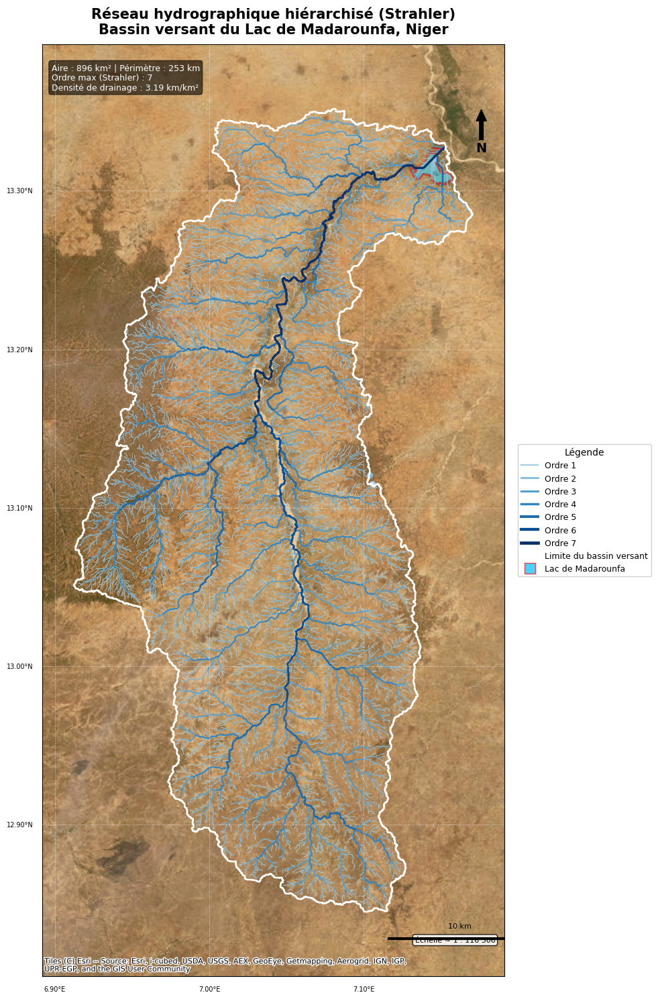

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE FINALE — RÉSEAU STRAHLER, BASSIN DÉFINITIF
# ============================================================
bassin_3857 = bassin_gdf_v2.to_crs(epsg=3857)
strahler_3857 = strahler_bassin.to_crs(epsg=3857)
lake_3857 = lake_utm.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(11, 15))

minx, miny, maxx, maxy = bassin_3857.total_bounds
marge_x, marge_y = (maxx - minx) * 0.08, (maxy - miny) * 0.08
minx, maxx = minx - marge_x, maxx + marge_x
miny, maxy = miny - marge_y, maxy + marge_y
ax.set_xlim(minx, maxx); ax.set_ylim(miny, maxy); ax.set_aspect('equal')

cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=bassin_3857.crs.to_string(), zorder=1)
lake_3857.plot(ax=ax, color='deepskyblue', alpha=0.5, edgecolor='red', linewidth=2, zorder=2)

cmap = plt.cm.Blues
legend_elements = []
for i, ordre in enumerate(ordres_disponibles):
    subset = strahler_3857[strahler_3857[col_ordre] == ordre]
    couleur = cmap(0.35 + 0.65 * (i / max(1, len(ordres_disponibles) - 1)))
    largeur = 0.3 + ordre * 0.3
    subset.plot(ax=ax, color=couleur, linewidth=largeur, zorder=3)
    legend_elements.append(Line2D([0], [0], color=couleur, linewidth=largeur + 1, label=f"Ordre {int(ordre)}"))

bassin_3857.boundary.plot(ax=ax, color='white', linewidth=1.8, zorder=4)
legend_elements.append(Line2D([0], [0], color='white', linewidth=1.8, label="Limite du bassin versant"))
legend_elements.append(Line2D([0], [0], marker='s', color='w', markerfacecolor='deepskyblue',
                               markeredgecolor='red', markersize=12, alpha=0.7, label="Lac de Madarounfa"))

ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy)

ax.set_title("Réseau hydrographique hiérarchisé (Strahler)\nBassin versant du Lac de Madarounfa, Niger",
             fontsize=15, fontweight='bold', pad=12)
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.02, 0.5),
          fontsize=9, framealpha=0.9, title="Légende", title_fontsize=10)

info_text = (f"Aire : {aire_km2:.0f} km² | Périmètre : {perimetre_km:.0f} km\n"
             f"Ordre max (Strahler) : {int(max(ordres_disponibles))}\n"
             f"Densité de drainage : {densite_drainage:.2f} km/km²")
ax.text(0.02, 0.98, info_text, transform=ax.transAxes, fontsize=9, verticalalignment='top',
        color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.6))

ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "carte_finale_strahler_DEFINITIF.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "carte_finale_strahler_DEFINITIF.png"))

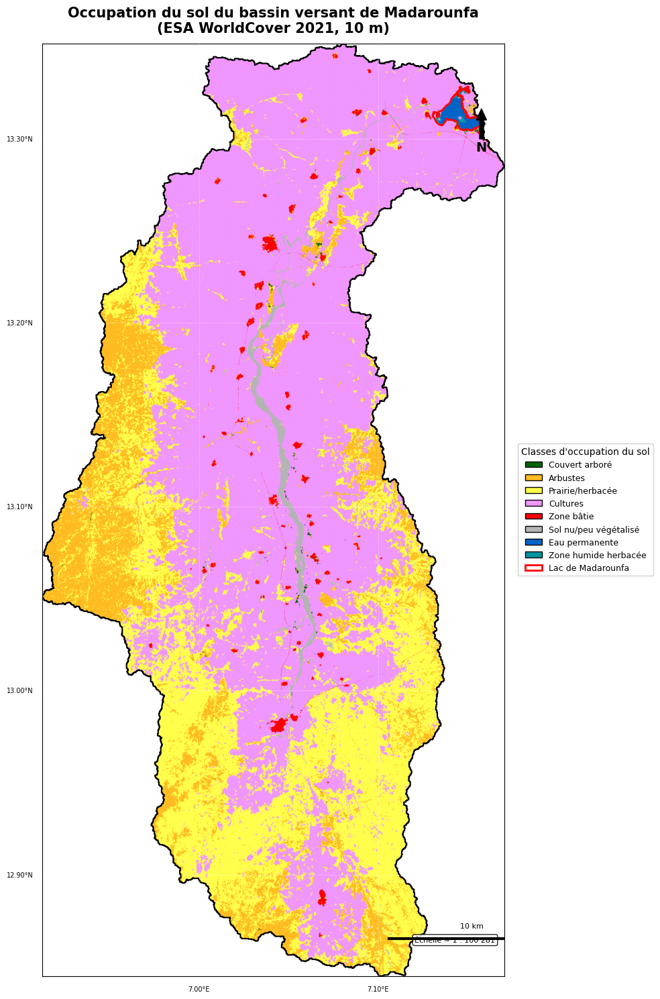

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# OCCUPATION DU SOL SUR LE BASSIN DÉFINITIF
# ============================================================
worldcover_path = os.path.join(DEM_DIR, "worldcover_N12E006.tif")
if not os.path.exists(worldcover_path):
    url_wc = "https://esa-worldcover.s3.eu-central-1.amazonaws.com/v200/2021/map/ESA_WorldCover_10m_2021_v200_N12E006_Map.tif"
    r = requests.get(url_wc, stream=True)
    with open(worldcover_path, "wb") as f:
        for chunk in r.iter_content(chunk_size=8192):
            f.write(chunk)

bassin_wgs84 = bassin_gdf_v2.to_crs(epsg=4326)
with rasterio.open(worldcover_path) as src:
    lulc_clip, lulc_transform = rio_mask(src, bassin_wgs84.geometry, crop=True, nodata=0)
lulc_arr = lulc_clip[0]

classes_worldcover = {
    10: ("Couvert arboré", "#006400"), 20: ("Arbustes", "#ffbb22"), 30: ("Prairie/herbacée", "#ffff4c"),
    40: ("Cultures", "#f096ff"), 50: ("Zone bâtie", "#fa0000"), 60: ("Sol nu/peu végétalisé", "#b4b4b4"),
    70: ("Neige/glace", "#f0f0f0"), 80: ("Eau permanente", "#0064c8"), 90: ("Zone humide herbacée", "#0096a0"),
    95: ("Mangrove", "#00cf75"), 100: ("Mousse/lichen", "#fae6a0"),
}
valeurs_presentes = sorted([v for v in np.unique(lulc_arr) if v in classes_worldcover])
cmap_lulc = ListedColormap([classes_worldcover[v][1] for v in valeurs_presentes])
norm_lulc = BoundaryNorm(valeurs_presentes + [valeurs_presentes[-1] + 10], cmap_lulc.N)

lulc_bounds_arr = rasterio.transform.array_bounds(lulc_arr.shape[0], lulc_arr.shape[1], lulc_transform)
lulc_extent = [lulc_bounds_arr[0], lulc_bounds_arr[2], lulc_bounds_arr[1], lulc_bounds_arr[3]]
lulc_display = np.where(lulc_arr == 0, np.nan, lulc_arr)
minx_lulc, miny_lulc, maxx_lulc, maxy_lulc = lulc_extent[0], lulc_extent[2], lulc_extent[1], lulc_extent[3]

fig, ax = plt.subplots(figsize=(11, 15))
ax.imshow(lulc_display, cmap=cmap_lulc, norm=norm_lulc, extent=lulc_extent, zorder=1)
bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.5, zorder=3)
lake.boundary.plot(ax=ax, color='red', linewidth=2, zorder=4)

legend_elements = [Patch(facecolor=classes_worldcover[v][1], edgecolor='black', label=classes_worldcover[v][0])
                   for v in valeurs_presentes]
legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=2, label='Lac de Madarounfa'))

ajouter_habillage_carte_v2(ax, fig, minx_lulc, miny_lulc, maxx_lulc, maxy_lulc, source_crs="EPSG:4326")

ax.set_title("Occupation du sol du bassin versant de Madarounfa\n(ESA WorldCover 2021, 10 m)",
             fontsize=15, fontweight='bold', pad=12)
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.02, 0.5),
          fontsize=9, framealpha=0.9, title="Classes d'occupation du sol", title_fontsize=10)
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_DEFINITIF.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_DEFINITIF.png"))

In [ ]:
# ============================================================
# FONCTION D'HABILLAGE CORRIGÉE — suppression du doublon d'échelle
# ============================================================
def ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy, source_crs="EPSG:3857", couleur_grille='white'):
    transformer_to_wgs84 = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)
    transformer_to_meters = Transformer.from_crs(source_crs, "EPSG:32632", always_xy=True)

    x0_m, y0_m = transformer_to_meters.transform(minx, (miny + maxy) / 2)
    x1_m, y1_m = transformer_to_meters.transform(maxx, (miny + maxy) / 2)
    largeur_carte_m = np.hypot(x1_m - x0_m, y1_m - y0_m)

    lon_min, lat_min = transformer_to_wgs84.transform(minx, miny)
    lon_max, lat_max = transformer_to_wgs84.transform(maxx, maxy)

    etendue_deg = max(lon_max - lon_min, lat_max - lat_min)
    intervalle_deg = 0.5 if etendue_deg > 2 else 0.25 if etendue_deg > 1 else 0.1 if etendue_deg > 0.3 else 0.05

    transformer_to_src = Transformer.from_crs("EPSG:4326", source_crs, always_xy=True)
    lons = np.arange(np.floor(lon_min / intervalle_deg) * intervalle_deg, lon_max + intervalle_deg, intervalle_deg)
    lats = np.arange(np.floor(lat_min / intervalle_deg) * intervalle_deg, lat_max + intervalle_deg, intervalle_deg)

    for lon in lons:
        x0, y0 = transformer_to_src.transform(lon, lat_min)
        x1, y1 = transformer_to_src.transform(lon, lat_max)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lon:.2f}°E", xy=(x0, miny), xytext=(0, -16), textcoords='offset points',
                    ha='center', fontsize=7, color='black')
    for lat in lats:
        x0, y0 = transformer_to_src.transform(lon_min, lat)
        x1, y1 = transformer_to_src.transform(lon_max, lat)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lat:.2f}°N", xy=(minx, y0), xytext=(-38, 0), textcoords='offset points',
                    va='center', fontsize=7, color='black')

    ax.set_xlim(minx, maxx); ax.set_ylim(miny, maxy)

    # --- Flèche du Nord ---
    x_arrow, y_arrow = 0.95, 0.93
    ax.annotate('N', xy=(x_arrow, y_arrow), xytext=(x_arrow, y_arrow - 0.045),
                xycoords='axes fraction', textcoords='axes fraction',
                fontsize=14, fontweight='bold', ha='center', color='black',
                arrowprops=dict(facecolor='black', edgecolor='black', width=4, headwidth=11), zorder=10)

    # --- UNE SEULE échelle graphique (ScaleBar), en bas à droite ---
    ax.add_artist(ScaleBar(1, location='lower right', box_alpha=0.85, color='black',
                            box_color='white', font_properties={'size': 8}))

    # --- Échelle littérale, repositionnée en bas à GAUCHE pour ne pas chevaucher la ScaleBar ---
    largeur_papier_m = fig.get_size_inches()[0] * 0.0254
    denominateur = largeur_carte_m / largeur_papier_m
    ax.text(0.02, 0.02, f"Échelle ≈ 1 : {denominateur:,.0f}".replace(",", " "),
            transform=ax.transAxes, fontsize=8, ha='left', va='bottom', color='black',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.85), zorder=10)

print("✅ Fonction corrigée — plus de doublon d'échelle")

✅ Fonction corrigée — plus de doublon d'échelle


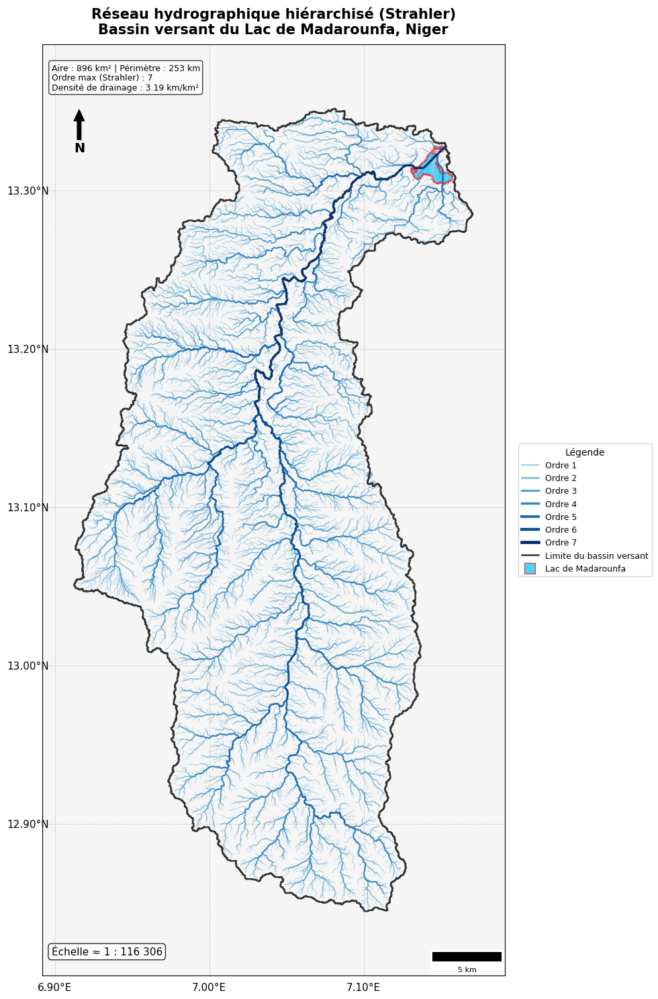

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE FINALE — RÉSEAU STRAHLER, SANS BASEMAP
# ============================================================
fig, ax = plt.subplots(figsize=(11, 15))
ax.set_facecolor('#f5f5f5')  # fond neutre gris très clair, remplace le satellite

minx, miny, maxx, maxy = bassin_3857.total_bounds
marge_x, marge_y = (maxx - minx) * 0.08, (maxy - miny) * 0.08
minx, maxx = minx - marge_x, maxx + marge_x
miny, maxy = miny - marge_y, maxy + marge_y
ax.set_xlim(minx, maxx); ax.set_ylim(miny, maxy); ax.set_aspect('equal')

# --- PAS de cx.add_basemap ici ---

lake_3857.plot(ax=ax, color='deepskyblue', alpha=0.7, edgecolor='red', linewidth=2, zorder=2)

cmap = plt.cm.Blues
legend_elements = []
for i, ordre in enumerate(ordres_disponibles):
    subset = strahler_3857[strahler_3857[col_ordre] == ordre]
    couleur = cmap(0.35 + 0.65 * (i / max(1, len(ordres_disponibles) - 1)))
    largeur = 0.3 + ordre * 0.3
    subset.plot(ax=ax, color=couleur, linewidth=largeur, zorder=3)
    legend_elements.append(Line2D([0], [0], color=couleur, linewidth=largeur + 1, label=f"Ordre {int(ordre)}"))

bassin_3857.boundary.plot(ax=ax, color='#333333', linewidth=1.8, zorder=4)  # foncé au lieu de blanc, pour contraster sur fond clair
legend_elements.append(Line2D([0], [0], color='#333333', linewidth=1.8, label="Limite du bassin versant"))
legend_elements.append(Line2D([0], [0], marker='s', color='w', markerfacecolor='deepskyblue',
                               markeredgecolor='red', markersize=12, alpha=0.7, label="Lac de Madarounfa"))

# --- Habillage : grille en gris foncé plutôt que blanc (plus visible sur fond clair) ---
ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy, couleur_grille='#888888')

ax.set_title("Réseau hydrographique hiérarchisé (Strahler)\nBassin versant du Lac de Madarounfa, Niger",
             fontsize=15, fontweight='bold', pad=12)
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.02, 0.5),
          fontsize=9, framealpha=0.9, title="Légende", title_fontsize=10)

info_text = (f"Aire : {aire_km2:.0f} km² | Périmètre : {perimetre_km:.0f} km\n"
             f"Ordre max (Strahler) : {int(max(ordres_disponibles))}\n"
             f"Densité de drainage : {densite_drainage:.2f} km/km²")
ax.text(0.02, 0.98, info_text, transform=ax.transAxes, fontsize=9, verticalalignment='top',
        color='black', bbox=dict(boxstyle='round', facecolor='white', alpha=0.75))

ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "carte_finale_strahler_sans_basemap.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "carte_finale_strahler_sans_basemap.png"))

In [ ]:
# ============================================================
# INSTALLATION ET AUTHENTIFICATION EARTH ENGINE (pour MODIS Land Cover)
# ============================================================
!pip install geemap earthengine-api -q

import ee
import geemap

ee.Authenticate()
ee.Initialize(project='project-69f8f740-33da-46f5-b47')  # remplacez par votre ID de projet GEE existant
print("✅ Earth Engine initialisé")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 45.7 MB/s eta 0:00:00
✅ Earth Engine initialisé


In [ ]:
# ============================================================
# RECHARGEMENT RAPIDE DU BASSIN DEPUIS LA SAUVEGARDE DRIVE
# ============================================================
from google.colab import drive
drive.mount('/content/drive')

import os
BASE_DIR = "/content/drive/MyDrive/Madarounfa_bassin_versant"
DEM_DIR = os.path.join(BASE_DIR, "dem")
HYDRO_DIR = os.path.join(BASE_DIR, "hydro")
FIG_DIR = os.path.join(BASE_DIR, "figures")
RESULT_DIR = os.path.join(BASE_DIR, "resultats")

import geopandas as gpd

bassin_gdf_v2 = gpd.read_file(os.path.join(RESULT_DIR, "bassin_madarounfa_FINAL.gpkg"))
strahler_bassin = gpd.read_file(os.path.join(RESULT_DIR, "reseau_strahler_madarounfa_FINAL.gpkg"))

print(f"✅ Bassin rechargé — {len(bassin_gdf_v2)} polygone(s), aire ≈ {bassin_gdf_v2.to_crs(epsg=32632).area.sum()/1e6:.1f} km²")

Mounted at /content/drive
✅ Bassin rechargé — 2 polygone(s), aire ≈ 896.0 km²


In [ ]:
import requests

In [ ]:
# ============================================================
# CONVERSION DU BASSIN EN GÉOMÉTRIE EARTH ENGINE
# ============================================================
bassin_wgs84 = bassin_gdf_v2.to_crs(epsg=4326)
bassin_ee = geemap.geopandas_to_ee(bassin_wgs84)
bassin_geometry = bassin_ee.geometry()
print("✅ Bassin converti en géométrie Earth Engine")

✅ Bassin converti en géométrie Earth Engine


In [ ]:
# ============================================================
# TÉLÉCHARGEMENT MODIS LAND COVER — ANNÉE LA PLUS ANCIENNE (2001) ET LA PLUS RÉCENTE DISPONIBLE
# ============================================================
def telecharger_modis_lc(annee, nom_fichier):
    img = (ee.ImageCollection('MODIS/061/MCD12Q1')
           .filterDate(f'{annee}-01-01', f'{annee}-12-31')
           .first()
           .select('LC_Type1')
           .clip(bassin_geometry))
    url = img.getDownloadURL({'region': bassin_geometry, 'scale': 500, 'format': 'GEO_TIFF'})
    response = requests.get(url)
    if response.status_code == 200:
        with open(nom_fichier, 'wb') as f:
            f.write(response.content)
        print(f"✅ MODIS Land Cover {annee} téléchargé : {nom_fichier}")
        return True
    else:
        print(f"❌ Échec pour {annee} — {response.status_code}")
        return False

lc_ancien_path = os.path.join(DEM_DIR, "modis_lc_2001.tif")
telecharger_modis_lc(2001, lc_ancien_path)

# Recherche de l'année la plus récente disponible (le produit a souvent 1-2 ans de délai de traitement)
lc_recent_path = os.path.join(DEM_DIR, "modis_lc_recent.tif")
for annee_test in [2024, 2023, 2022]:
    if telecharger_modis_lc(annee_test, lc_recent_path):
        annee_recente = annee_test
        break

✅ MODIS Land Cover 2001 téléchargé : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/modis_lc_2001.tif
✅ MODIS Land Cover 2024 téléchargé : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/modis_lc_recent.tif


In [ ]:
# ============================================================
# IMPORTS COMPLETS POUR LA SUITE (Earth Engine + MODIS + cartes)
# ============================================================
import os
import requests
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
from google.colab import files
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

print("✅ Imports rechargés")

✅ Imports rechargés


In [ ]:
# ============================================================
# LÉGENDE OFFICIELLE MODIS/IGBP (17 classes)
# ============================================================
classes_modis = {
    1: ("Forêt de conifères persistante", "#05450a"), 2: ("Forêt de feuillus persistante", "#086a10"),
    3: ("Forêt de conifères caduque", "#54a708"), 4: ("Forêt de feuillus caduque", "#78d203"),
    5: ("Forêt mixte", "#009900"), 6: ("Arbustes denses", "#c6b044"), 7: ("Arbustes ouverts", "#dcd159"),
    8: ("Savane arborée", "#dade48"), 9: ("Savane", "#fbff13"), 10: ("Prairie", "#b6ff05"),
    11: ("Zone humide permanente", "#27ff87"), 12: ("Cultures", "#c24f44"), 13: ("Zone urbaine/bâtie", "#a5a5a5"),
    14: ("Mosaïque cultures/végétation naturelle", "#ff6d4c"), 15: ("Neige/glace permanente", "#69fff8"),
    16: ("Sol nu/peu végétalisé", "#f9ffa4"), 17: ("Étendue d'eau", "#1c0dff"),
}

def charger_et_afficher_modis(chemin, annee):
    with rasterio.open(chemin) as src:
        arr = src.read(1)
        transform = src.transform
    valeurs = sorted([v for v in np.unique(arr) if v in classes_modis])
    cmap = ListedColormap([classes_modis[v][1] for v in valeurs])
    norm = BoundaryNorm(valeurs + [valeurs[-1] + 1], cmap.N)
    bounds_arr = rasterio.transform.array_bounds(arr.shape[0], arr.shape[1], transform)
    extent = [bounds_arr[0], bounds_arr[2], bounds_arr[1], bounds_arr[3]]
    display_arr = np.where(np.isin(arr, valeurs), arr, np.nan)
    return display_arr, cmap, norm, extent, valeurs

In [ ]:
!pip install osmnx -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.7/104.7 kB 3.1 MB/s eta 0:00:00


In [ ]:
# ============================================================
# RECONSTRUCTION RAPIDE DE `lake` VIA OSMNX (si la cellule d'origine est perdue)
# ============================================================
import osmnx as ox
ox.settings.use_cache = True
ox.settings.log_console = False

lake = ox.geocode_to_gdf("Lac de Madarounfa, Niger")
if lake.empty or lake.geometry.iloc[0].geom_type not in ['Polygon', 'MultiPolygon']:
    # repli si la requête nominale échoue : recherche par tag OSM water body
    lake = ox.features_from_point((13.3151, 7.1446), tags={'natural': 'water'}, dist=2000)
    lake = lake[lake.geometry.type.isin(['Polygon', 'MultiPolygon'])].iloc[[0]]

lake = lake.set_crs("EPSG:4326", allow_override=True) if lake.crs is None else lake.to_crs("EPSG:4326")
print(f"✅ Lac rechargé — superficie ≈ {lake.to_crs(epsg=32632).area.sum()/1e4:.1f} ha")

✅ Lac rechargé — superficie ≈ 286.5 ha


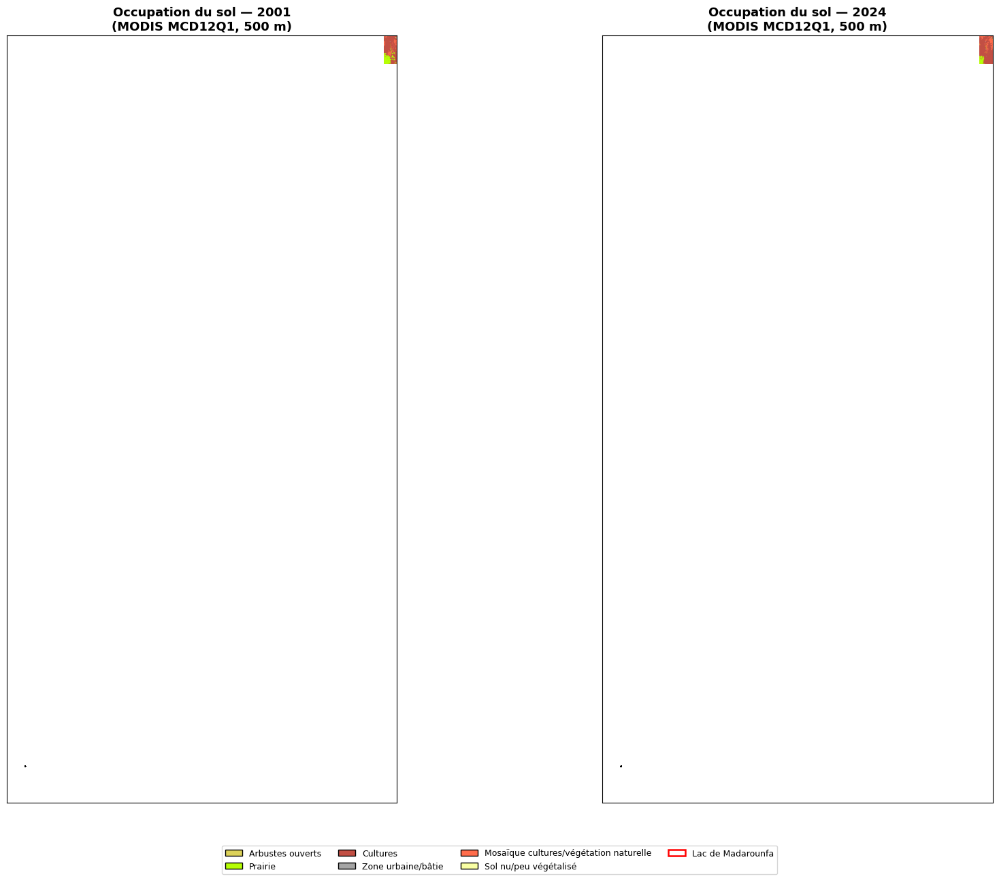

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE COMPARATIVE — OCCUPATION DU SOL, ANCIEN vs RÉCENT
# ============================================================
display_ancien, cmap_ancien, norm_ancien, extent_ancien, valeurs_ancien = charger_et_afficher_modis(lc_ancien_path, 2001)
display_recent, cmap_recent, norm_recent, extent_recent, valeurs_recent = charger_et_afficher_modis(lc_recent_path, annee_recente)

fig, axes = plt.subplots(1, 2, figsize=(20, 12))

for ax, display_arr, cmap, norm, extent, valeurs, annee in [
    (axes[0], display_ancien, cmap_ancien, norm_ancien, extent_ancien, valeurs_ancien, 2001),
    (axes[1], display_recent, cmap_recent, norm_recent, extent_recent, valeurs_recent, annee_recente),
]:
    ax.imshow(display_arr, cmap=cmap, norm=norm, extent=extent, zorder=1)
    bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.2, zorder=3)
    lake.boundary.plot(ax=ax, color='red', linewidth=1.8, zorder=4)
    ax.set_title(f"Occupation du sol — {annee}\n(MODIS MCD12Q1, 500 m)", fontsize=13, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])

# Légende commune, sous les deux cartes
toutes_valeurs = sorted(set(valeurs_ancien) | set(valeurs_recent))
legend_elements = [Patch(facecolor=classes_modis[v][1], edgecolor='black', label=classes_modis[v][0]) for v in toutes_valeurs]
legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=1.8, label='Lac de Madarounfa'))
fig.legend(handles=legend_elements, loc='lower center', ncol=4, fontsize=9, bbox_to_anchor=(0.5, -0.08))

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_comparaison_temporelle.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_comparaison_temporelle.png"))

In [ ]:
# ============================================================
# DIAGNOSTIC — EMPRISE RÉELLE DE bassin_geometry CÔTÉ EARTH ENGINE
# ============================================================
bounds_ee = bassin_geometry.bounds().getInfo()
print("Emprise (Earth Engine) :", bounds_ee)

bounds_local = bassin_wgs84.total_bounds
print("Emprise (GeoDataFrame local) :", bounds_local)

Emprise (Earth Engine) : {'geodesic': False, 'type': 'Polygon', 'coordinates': [[[6.912375276012979, 12.844925908894268], [7.17066291036461, 12.844925908894268], [7.17066291036461, 13.35162068709424], [6.912375276012979, 13.35162068709424], [6.912375276012979, 12.844925908894268]]]}
Emprise (GeoDataFrame local) : [ 6.91237528 12.84492591  7.17066291 13.35162069]


In [ ]:
# ============================================================
# RECONSTRUCTION DIRECTE DE LA GÉOMÉTRIE (sans passer par geopandas_to_ee)
# ============================================================
import json
from shapely.geometry import mapping

geom_union = bassin_wgs84.geometry.unary_union
geojson_geom = mapping(geom_union)

bassin_geometry = ee.Geometry(geojson_geom)

bounds_ee_v2 = bassin_geometry.bounds().getInfo()
print("Nouvelle emprise (Earth Engine) :", bounds_ee_v2)
print("Devrait être proche de :", bounds_local)

/tmp/ipykernel_729/557391909.py:7: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_union = bassin_wgs84.geometry.unary_union


Nouvelle emprise (Earth Engine) : {'geodesic': False, 'type': 'Polygon', 'coordinates': [[[6.912375276012979, 12.844925908894268], [7.17066291036461, 12.844925908894268], [7.17066291036461, 13.35162068709424], [6.912375276012979, 13.35162068709424], [6.912375276012979, 12.844925908894268]]]}
Devrait être proche de : [ 6.91237528 12.84492591  7.17066291 13.35162069]


In [ ]:
# ============================================================
# RETÉLÉCHARGEMENT MODIS AVEC LA GÉOMÉTRIE CORRIGÉE
# ============================================================
lc_ancien_path = os.path.join(DEM_DIR, "modis_lc_2001.tif")
telecharger_modis_lc(2001, lc_ancien_path)

lc_recent_path = os.path.join(DEM_DIR, "modis_lc_recent.tif")
for annee_test in [2024, 2023, 2022]:
    if telecharger_modis_lc(annee_test, lc_recent_path):
        annee_recente = annee_test
        break

✅ MODIS Land Cover 2001 téléchargé : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/modis_lc_2001.tif
✅ MODIS Land Cover 2024 téléchargé : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/modis_lc_recent.tif


In [ ]:
# ============================================================
# TÉLÉCHARGEMENT MODIS CORRIGÉ — CRS EXPLICITE (EPSG:4326)
# ============================================================
def telecharger_modis_lc(annee, nom_fichier):
    img = (ee.ImageCollection('MODIS/061/MCD12Q1')
           .filterDate(f'{annee}-01-01', f'{annee}-12-31')
           .first()
           .select('LC_Type1')
           .clip(bassin_geometry))
    url = img.getDownloadURL({
        'region': bassin_geometry,
        'scale': 500,
        'format': 'GEO_TIFF',
        'crs': 'EPSG:4326'   # ⚠️ c'est la ligne qui manquait — sans elle, sortie en sinusoïdale MODIS
    })
    response = requests.get(url)
    if response.status_code == 200:
        with open(nom_fichier, 'wb') as f:
            f.write(response.content)
        print(f"✅ MODIS Land Cover {annee} téléchargé (EPSG:4326) : {nom_fichier}")
        return True
    else:
        print(f"❌ Échec pour {annee} — {response.status_code}")
        return False

lc_ancien_path = os.path.join(DEM_DIR, "modis_lc_2001_v2.tif")
telecharger_modis_lc(2001, lc_ancien_path)

lc_recent_path = os.path.join(DEM_DIR, "modis_lc_recent_v2.tif")
for annee_test in [2024, 2023, 2022]:
    if telecharger_modis_lc(annee_test, lc_recent_path):
        annee_recente = annee_test
        break

✅ MODIS Land Cover 2001 téléchargé (EPSG:4326) : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/modis_lc_2001_v2.tif
✅ MODIS Land Cover 2024 téléchargé (EPSG:4326) : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/modis_lc_recent_v2.tif


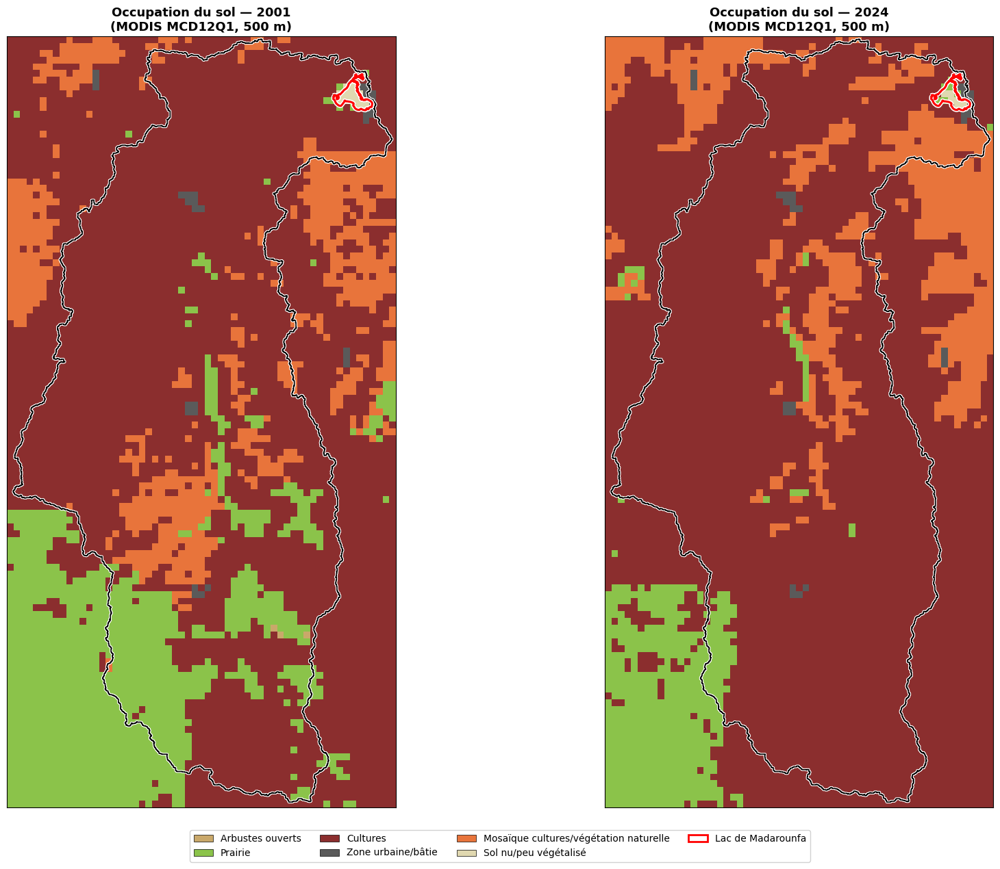

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE COMPARATIVE — PALETTE CONTRASTÉE + CONTOUR RENFORCÉ
# ============================================================
import matplotlib.patheffects as pe

# Palette retravaillée pour un contraste maximal entre classes voisines
classes_modis_contraste = {
    1: ("Forêt de conifères persistante", "#1a4314"), 2: ("Forêt de feuillus persistante", "#0b6623"),
    3: ("Forêt de conifères caduque", "#3f8f29"), 4: ("Forêt de feuillus caduque", "#66b032"),
    5: ("Forêt mixte", "#2e8b57"), 6: ("Arbustes denses", "#a3792f"), 7: ("Arbustes ouverts", "#c9a86a"),
    8: ("Savane arborée", "#d9a441"), 9: ("Savane", "#e8c547"),
    10: ("Prairie", "#8bc34a"),          # vert franc, distinct du jaune
    11: ("Zone humide permanente", "#00b8a9"), 12: ("Cultures", "#8b2e2e"),  # brun-rouge foncé
    13: ("Zone urbaine/bâtie", "#5a5a5a"),
    14: ("Mosaïque cultures/végétation naturelle", "#e8743b"),  # orange net, distinct des cultures
    15: ("Neige/glace permanente", "#69fff8"),
    16: ("Sol nu/peu végétalisé", "#e0d8b0"),  # beige, distinct du vert prairie
    17: ("Étendue d'eau", "#0d47a1"),
}

def charger_et_afficher_modis_v2(chemin, annee):
    with rasterio.open(chemin) as src:
        arr = src.read(1)
        transform = src.transform
    valeurs = sorted([v for v in np.unique(arr) if v in classes_modis_contraste])
    cmap = ListedColormap([classes_modis_contraste[v][1] for v in valeurs])
    norm = BoundaryNorm(valeurs + [valeurs[-1] + 1], cmap.N)
    bounds_arr = rasterio.transform.array_bounds(arr.shape[0], arr.shape[1], transform)
    extent = [bounds_arr[0], bounds_arr[2], bounds_arr[1], bounds_arr[3]]
    display_arr = np.where(np.isin(arr, valeurs), arr, np.nan)
    return display_arr, cmap, norm, extent, valeurs

display_ancien, cmap_ancien, norm_ancien, extent_ancien, valeurs_ancien = charger_et_afficher_modis_v2(lc_ancien_path, 2001)
display_recent, cmap_recent, norm_recent, extent_recent, valeurs_recent = charger_et_afficher_modis_v2(lc_recent_path, annee_recente)

fig, axes = plt.subplots(1, 2, figsize=(20, 12))

for ax, display_arr, cmap, norm, extent, valeurs, annee in [
    (axes[0], display_ancien, cmap_ancien, norm_ancien, extent_ancien, valeurs_ancien, 2001),
    (axes[1], display_recent, cmap_recent, norm_recent, extent_recent, valeurs_recent, annee_recente),
]:
    ax.imshow(display_arr, cmap=cmap, norm=norm, extent=extent, zorder=1)

    # Contour du bassin : trait blanc épais en dessous + noir fin par-dessus (meilleure lisibilité sur fond coloré)
    bassin_wgs84.boundary.plot(ax=ax, color='white', linewidth=2.8, zorder=3)
    bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.2, zorder=4)

    # Contour du lac : renforcé avec halo blanc (path_effects) pour ressortir sur n'importe quel fond
    lake.boundary.plot(ax=ax, color='red', linewidth=2.2, zorder=5,
                        path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])

    ax.set_title(f"Occupation du sol — {annee}\n(MODIS MCD12Q1, 500 m)", fontsize=13, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])

toutes_valeurs = sorted(set(valeurs_ancien) | set(valeurs_recent))
legend_elements = [Patch(facecolor=classes_modis_contraste[v][1], edgecolor='black', linewidth=0.5,
                          label=classes_modis_contraste[v][0]) for v in toutes_valeurs]
legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=2, label='Lac de Madarounfa'))

fig.legend(handles=legend_elements, loc='lower center', ncol=4, fontsize=10, bbox_to_anchor=(0.5, -0.06),
           frameon=True, framealpha=0.9)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_comparaison_v2.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_comparaison_v2.png"))

In [ ]:
ax.imshow(display_arr, cmap=cmap, norm=norm, extent=extent, zorder=1, interpolation='nearest')

In [ ]:
# ============================================================
# CONVERSION DE `lake` EN OBJET EARTH ENGINE
# ============================================================
lake_ee = geemap.geopandas_to_ee(lake)
print("✅ lake_ee créé")

✅ lake_ee créé


In [ ]:
# ============================================================
# ALTERNATIVE — VISUALISATION INTERACTIVE DIRECTEMENT DANS EARTH ENGINE
# ============================================================
palette_modis_officielle = [
    "#05450a", "#086a10", "#54a708", "#78d203", "#009900", "#c6b044", "#dcd159",
    "#dade48", "#fbff13", "#b6ff05", "#27ff87", "#c24f44", "#a5a5a5", "#ff6d4c",
    "#69fff8", "#f9ffa4", "#1c0dff"
]
vis_params = {'min': 1, 'max': 17, 'palette': palette_modis_officielle}

img_2001 = ee.ImageCollection('MODIS/061/MCD12Q1').filterDate('2001-01-01', '2001-12-31').first().select('LC_Type1').clip(bassin_geometry)
img_recent = ee.ImageCollection('MODIS/061/MCD12Q1').filterDate(f'{annee_recente}-01-01', f'{annee_recente}-12-31').first().select('LC_Type1').clip(bassin_geometry)

Map = geemap.Map()
Map.centerObject(bassin_ee, 9)
Map.addLayer(img_2001, vis_params, "Occupation du sol 2001")
Map.addLayer(img_recent, vis_params, "Occupation du sol " + str(annee_recente))
Map.addLayer(bassin_ee.style(color='black', fillColor='00000000', width=2), {}, "Bassin versant")
Map.addLayer(lake_ee, {"color": "red"}, "Lac de Madarounfa")
Map

Map(center=[13.102027409682792, 7.042430736962824], controls=(WidgetControl(options=['position', 'transparent_…

In [ ]:
# ============================================================
# COMPOSITE DYNAMIC WORLD — MÊME PÉRIODE DE L'ANNÉE (30 SEPTEMBRE ± 10 JOURS)
# ============================================================
def dynamicworld_composite(annee, mois=9, jour=30, marge_jours=10):
    date_cible = ee.Date.fromYMD(annee, mois, jour)
    debut = date_cible.advance(-marge_jours, 'day')
    fin = date_cible.advance(marge_jours, 'day')
    coll = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
            .filterBounds(bassin_geometry)
            .filterDate(debut, fin))
    n_images = coll.size().getInfo()
    composite = coll.select('label').mode().clip(bassin_geometry)  # vote majoritaire par pixel
    return composite, n_images

annee_ancienne = 2016  # Dynamic World démarre mi-2015 ; 2016 est la première année pleinement disponible
annee_recente = 2025

composite_ancien, n_anc = dynamicworld_composite(annee_ancienne)
composite_recent, n_rec = dynamicworld_composite(annee_recente)
print(f"{annee_ancienne} : {n_anc} images utilisées (30 sept ± 10j)")
print(f"{annee_recente} : {n_rec} images utilisées (30 sept ± 10j)")

2016 : 4 images utilisées (30 sept ± 10j)
2025 : 4 images utilisées (30 sept ± 10j)


In [ ]:
# ============================================================
# TÉLÉCHARGEMENT (via geemap, gère automatiquement le découpage en tuiles)
# ============================================================
dw_ancien_path = os.path.join(DEM_DIR, f"dynamicworld_{annee_ancienne}.tif")
dw_recent_path = os.path.join(DEM_DIR, f"dynamicworld_{annee_recente}.tif")

geemap.ee_export_image(composite_ancien, filename=dw_ancien_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
geemap.ee_export_image(composite_recent, filename=dw_recent_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
print("✅ Téléchargements terminés")

Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2016.tif
Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2025.tif
✅ Téléchargements terminés


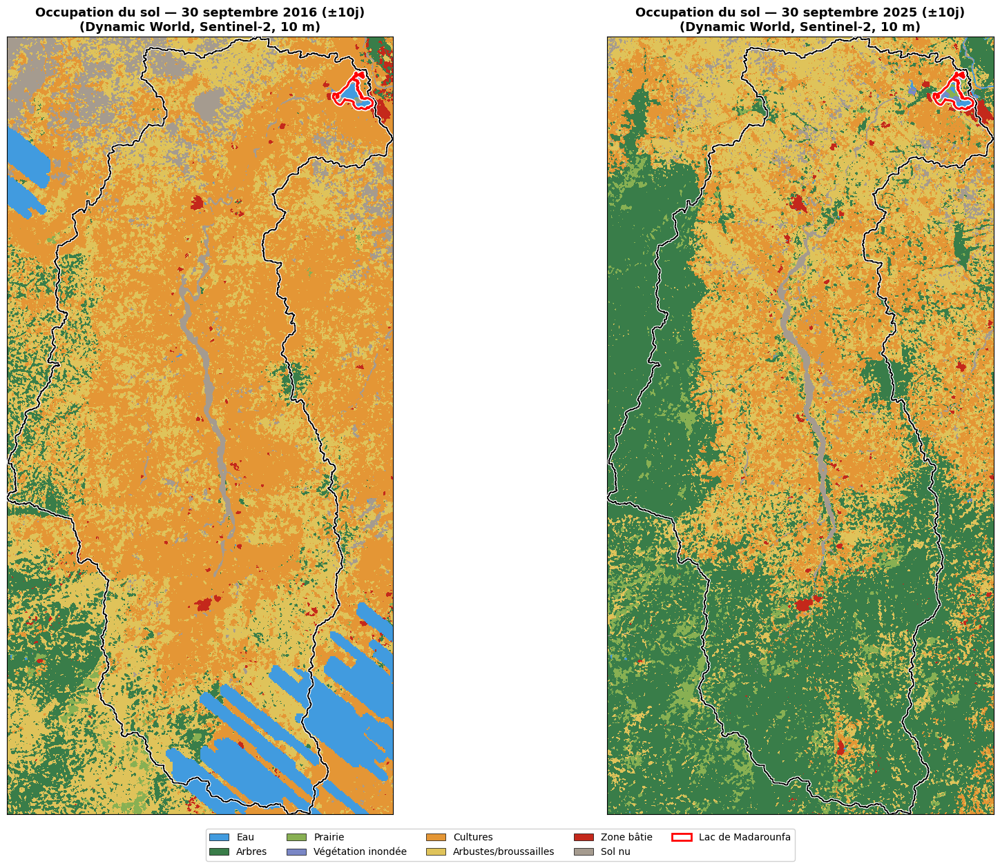

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE COMPARATIVE — MÊME STYLE QUE LA CARTE ESA WORLDCOVER 2021
# ============================================================
import matplotlib.patheffects as pe

classes_dynamicworld = {
    0: ("Eau", "#419bdf"), 1: ("Arbres", "#397d49"), 2: ("Prairie", "#88b053"),
    3: ("Végétation inondée", "#7a87c6"), 4: ("Cultures", "#e49635"), 5: ("Arbustes/broussailles", "#dfc35a"),
    6: ("Zone bâtie", "#c4281b"), 7: ("Sol nu", "#a59b8f"), 8: ("Neige/glace", "#b39fe1"),
}

def charger_dynamicworld(chemin):
    with rasterio.open(chemin) as src:
        arr = src.read(1)
        transform = src.transform
    valeurs = sorted([v for v in np.unique(arr) if v in classes_dynamicworld])
    cmap = ListedColormap([classes_dynamicworld[v][1] for v in valeurs])
    norm = BoundaryNorm(valeurs + [valeurs[-1] + 1], cmap.N)
    bounds_arr = rasterio.transform.array_bounds(arr.shape[0], arr.shape[1], transform)
    extent = [bounds_arr[0], bounds_arr[2], bounds_arr[1], bounds_arr[3]]
    display_arr = np.where(np.isin(arr, valeurs), arr, np.nan)
    return display_arr, cmap, norm, extent, valeurs

display_anc, cmap_anc, norm_anc, extent_anc, val_anc = charger_dynamicworld(dw_ancien_path)
display_rec, cmap_rec, norm_rec, extent_rec, val_rec = charger_dynamicworld(dw_recent_path)

fig, axes = plt.subplots(1, 2, figsize=(20, 12))

for ax, display_arr, cmap, norm, extent, annee in [
    (axes[0], display_anc, cmap_anc, norm_anc, extent_anc, annee_ancienne),
    (axes[1], display_rec, cmap_rec, norm_rec, extent_rec, annee_recente),
]:
    ax.imshow(display_arr, cmap=cmap, norm=norm, extent=extent, zorder=1, interpolation='nearest')
    bassin_wgs84.boundary.plot(ax=ax, color='white', linewidth=2.8, zorder=3)
    bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.2, zorder=4)
    lake.boundary.plot(ax=ax, color='red', linewidth=2.2, zorder=5,
                        path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])
    ax.set_title(f"Occupation du sol — 30 septembre {annee} (±10j)\n(Dynamic World, Sentinel-2, 10 m)",
                 fontsize=13, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])

toutes_valeurs = sorted(set(val_anc) | set(val_rec))
legend_elements = [Patch(facecolor=classes_dynamicworld[v][1], edgecolor='black', linewidth=0.5,
                          label=classes_dynamicworld[v][0]) for v in toutes_valeurs]
legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=2, label='Lac de Madarounfa'))

fig.legend(handles=legend_elements, loc='lower center', ncol=5, fontsize=10, bbox_to_anchor=(0.5, -0.05),
           frameon=True, framealpha=0.9)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_dynamicworld_comparaison.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_dynamicworld_comparaison.png"))

In [ ]:
# ============================================================
# MASQUAGE STRICT SUR LE CONTOUR DU BASSIN (pas juste la bounding box)
# ============================================================
from rasterio.mask import mask as rio_mask

def masquer_sur_bassin(chemin_raster, bassin_geom_wgs84):
    with rasterio.open(chemin_raster) as src:
        arr_masked, transform_masked = rio_mask(src, bassin_geom_wgs84.geometry, crop=True, nodata=255)
    arr = arr_masked[0]
    arr = np.where(arr == 255, np.nan, arr)  # 255 = hors bassin, converti en NaN
    return arr, transform_masked

arr_anc, transform_anc = masquer_sur_bassin(dw_ancien_path, bassin_wgs84)
arr_rec, transform_rec = masquer_sur_bassin(dw_recent_path, bassin_wgs84)
print("✅ Rasters masqués strictement sur le contour du bassin")

✅ Rasters masqués strictement sur le contour du bassin


In [ ]:
# ============================================================
# CALCUL DES POURCENTAGES PAR CLASSE (à l'intérieur du bassin uniquement)
# ============================================================
def calculer_pourcentages(arr, classes_dict):
    total_valide = np.sum(~np.isnan(arr))
    pourcentages = {}
    for val, (nom, couleur) in classes_dict.items():
        n = np.sum(arr == val)
        if n > 0:
            pourcentages[val] = {"nom": nom, "couleur": couleur, "pct": 100 * n / total_valide}
    return pourcentages

pct_anc = calculer_pourcentages(arr_anc, classes_dynamicworld)
pct_rec = calculer_pourcentages(arr_rec, classes_dynamicworld)

print(f"--- {annee_ancienne} ---")
for v, d in sorted(pct_anc.items(), key=lambda x: -x[1]['pct']):
    print(f"  {d['nom']} : {d['pct']:.1f}%")
print(f"\n--- {annee_recente} ---")
for v, d in sorted(pct_rec.items(), key=lambda x: -x[1]['pct']):
    print(f"  {d['nom']} : {d['pct']:.1f}%")

--- 2016 ---
  Cultures : 53.8%
  Arbustes/broussailles : 35.4%
  Sol nu : 5.1%
  Arbres : 4.8%
  Zone bâtie : 0.7%
  Prairie : 0.1%
  Végétation inondée : 0.0%

--- 2025 ---
  Arbres : 38.6%
  Arbustes/broussailles : 30.4%
  Cultures : 23.9%
  Prairie : 3.1%
  Sol nu : 3.0%
  Zone bâtie : 0.8%
  Végétation inondée : 0.2%


In [ ]:
!pip install matplotlib-scalebar pyproj -q

In [ ]:
# ============================================================
# RECRÉATION DE LA FONCTION D'HABILLAGE CARTOGRAPHIQUE
# ============================================================
from pyproj import Transformer
from matplotlib_scalebar.scalebar import ScaleBar

def ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy, source_crs="EPSG:3857", couleur_grille='white'):
    transformer_to_wgs84 = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)
    transformer_to_meters = Transformer.from_crs(source_crs, "EPSG:32632", always_xy=True)

    x0_m, y0_m = transformer_to_meters.transform(minx, (miny + maxy) / 2)
    x1_m, y1_m = transformer_to_meters.transform(maxx, (miny + maxy) / 2)
    largeur_carte_m = np.hypot(x1_m - x0_m, y1_m - y0_m)

    lon_min, lat_min = transformer_to_wgs84.transform(minx, miny)
    lon_max, lat_max = transformer_to_wgs84.transform(maxx, maxy)

    etendue_deg = max(lon_max - lon_min, lat_max - lat_min)
    intervalle_deg = 0.5 if etendue_deg > 2 else 0.25 if etendue_deg > 1 else 0.1 if etendue_deg > 0.3 else 0.05

    transformer_to_src = Transformer.from_crs("EPSG:4326", source_crs, always_xy=True)
    lons = np.arange(np.floor(lon_min / intervalle_deg) * intervalle_deg, lon_max + intervalle_deg, intervalle_deg)
    lats = np.arange(np.floor(lat_min / intervalle_deg) * intervalle_deg, lat_max + intervalle_deg, intervalle_deg)

    for lon in lons:
        x0, y0 = transformer_to_src.transform(lon, lat_min)
        x1, y1 = transformer_to_src.transform(lon, lat_max)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lon:.2f}°E", xy=(x0, miny), xytext=(0, -16), textcoords='offset points',
                    ha='center', fontsize=12, color='black')
    for lat in lats:
        x0, y0 = transformer_to_src.transform(lon_min, lat)
        x1, y1 = transformer_to_src.transform(lon_max, lat)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lat:.2f}°N", xy=(minx, y0), xytext=(-38, 0), textcoords='offset points',
                    va='center', fontsize=12, color='black')

    ax.set_xlim(minx, maxx); ax.set_ylim(miny, maxy)

    x_arrow, y_arrow = 0.95, 0.93
    ax.annotate('N', xy=(x_arrow, y_arrow), xytext=(x_arrow, y_arrow - 0.045),
                xycoords='axes fraction', textcoords='axes fraction',
                fontsize=14, fontweight='bold', ha='center', color='black',
                arrowprops=dict(facecolor='black', edgecolor='black', width=4, headwidth=11), zorder=10)

    ax.add_artist(ScaleBar(1, location='lower right', box_alpha=0.85, color='black',
                            box_color='white', font_properties={'size': 8}))

    largeur_papier_m = fig.get_size_inches()[0] * 0.0254
    denominateur = largeur_carte_m / largeur_papier_m
    ax.text(0.02, 0.02, f"Échelle ≈ 1 : {denominateur:,.0f}".replace(",", " "),
            transform=ax.transAxes, fontsize=12, ha='left', va='bottom', color='black',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.85), zorder=10)

print("✅ Fonction d'habillage recréée")

✅ Fonction d'habillage recréée


In [ ]:
# ============================================================
# FONCTION D'HABILLAGE — FLÈCHE DU NORD DÉCALÉE À GAUCHE
# ============================================================
def ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy, source_crs="EPSG:3857", couleur_grille='white'):
    transformer_to_wgs84 = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)
    transformer_to_meters = Transformer.from_crs(source_crs, "EPSG:32632", always_xy=True)

    x0_m, y0_m = transformer_to_meters.transform(minx, (miny + maxy) / 2)
    x1_m, y1_m = transformer_to_meters.transform(maxx, (miny + maxy) / 2)
    largeur_carte_m = np.hypot(x1_m - x0_m, y1_m - y0_m)

    lon_min, lat_min = transformer_to_wgs84.transform(minx, miny)
    lon_max, lat_max = transformer_to_wgs84.transform(maxx, maxy)

    etendue_deg = max(lon_max - lon_min, lat_max - lat_min)
    intervalle_deg = 0.5 if etendue_deg > 2 else 0.25 if etendue_deg > 1 else 0.1 if etendue_deg > 0.3 else 0.05

    transformer_to_src = Transformer.from_crs("EPSG:4326", source_crs, always_xy=True)
    lons = np.arange(np.floor(lon_min / intervalle_deg) * intervalle_deg, lon_max + intervalle_deg, intervalle_deg)
    lats = np.arange(np.floor(lat_min / intervalle_deg) * intervalle_deg, lat_max + intervalle_deg, intervalle_deg)

    for lon in lons:
        x0, y0 = transformer_to_src.transform(lon, lat_min)
        x1, y1 = transformer_to_src.transform(lon, lat_max)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lon:.2f}°E", xy=(x0, miny), xytext=(0, -16), textcoords='offset points',
                    ha='center', fontsize=11, color='black')
    for lat in lats:
        x0, y0 = transformer_to_src.transform(lon_min, lat)
        x1, y1 = transformer_to_src.transform(lon_max, lat)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.5, linestyle='--', alpha=0.5, zorder=6)
        ax.annotate(f"{lat:.2f}°N", xy=(minx, y0), xytext=(-38, 0), textcoords='offset points',
                    va='center', fontsize=11, color='black')

    ax.set_xlim(minx, maxx); ax.set_ylim(miny, maxy)

    # --- Flèche du Nord, décalée à gauche ---
    x_arrow, y_arrow = 0.08, 0.93
    ax.annotate('N', xy=(x_arrow, y_arrow), xytext=(x_arrow, y_arrow - 0.045),
                xycoords='axes fraction', textcoords='axes fraction',
                fontsize=14, fontweight='bold', ha='center', color='black',
                arrowprops=dict(facecolor='black', edgecolor='black', width=4, headwidth=11), zorder=10)

    ax.add_artist(ScaleBar(1, location='lower right', box_alpha=0.85, color='black',
                            box_color='white', font_properties={'size': 8}))

    largeur_papier_m = fig.get_size_inches()[0] * 0.0254
    denominateur = largeur_carte_m / largeur_papier_m
    ax.text(0.02, 0.02, f"Échelle ≈ 1 : {denominateur:,.0f}".replace(",", " "),
            transform=ax.transAxes, fontsize=11, ha='left', va='bottom', color='black',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.85), zorder=10)

print("✅ Fonction mise à jour — flèche du Nord à gauche")

✅ Fonction mise à jour — flèche du Nord à gauche


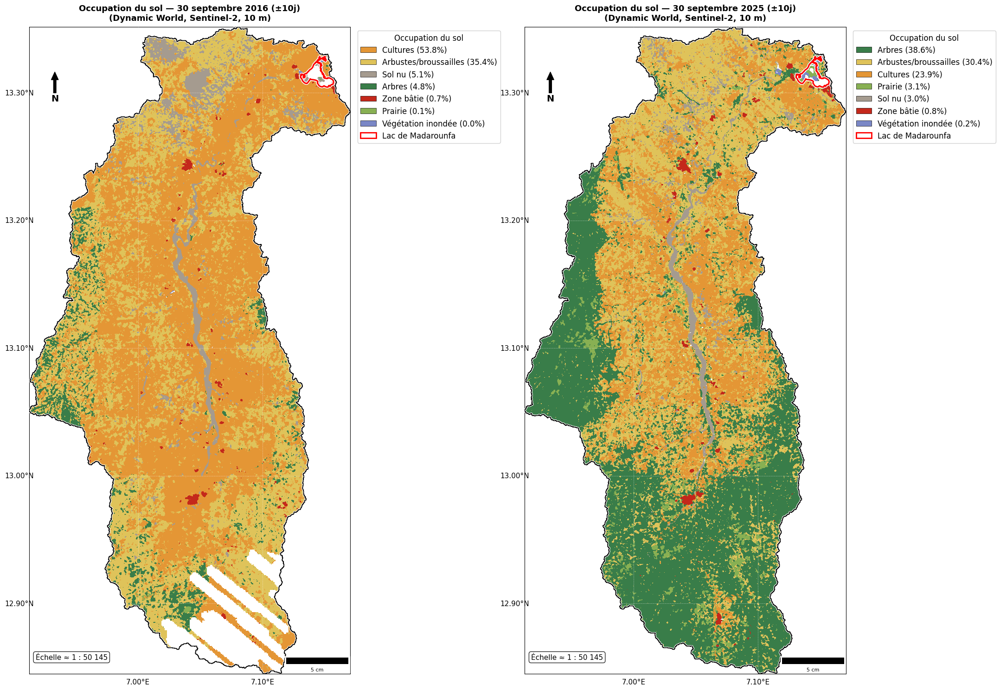

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE FINALE — MASQUÉE, AVEC POURCENTAGES ET HABILLAGE COMPLET
# ============================================================
def bounds_from_transform(arr, transform):
    b = rasterio.transform.array_bounds(arr.shape[0], arr.shape[1], transform)
    return [b[0], b[2], b[1], b[3]]  # left, right, bottom, top

extent_anc = bounds_from_transform(arr_anc, transform_anc)
extent_rec = bounds_from_transform(arr_rec, transform_rec)

fig, axes = plt.subplots(1, 2, figsize=(22, 15))

for ax, arr, transform, extent, annee, pct_dict in [
    (axes[0], arr_anc, transform_anc, extent_anc, annee_ancienne, pct_anc),
    (axes[1], arr_rec, transform_rec, extent_rec, annee_recente, pct_rec),
]:
    valeurs = sorted(pct_dict.keys())
    cmap = ListedColormap([classes_dynamicworld[v][1] for v in valeurs])
    norm = BoundaryNorm(valeurs + [valeurs[-1] + 1], cmap.N)

    ax.imshow(arr, cmap=cmap, norm=norm, extent=extent, zorder=1, interpolation='nearest')

    bassin_wgs84.boundary.plot(ax=ax, color='white', linewidth=2.8, zorder=3)
    bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.2, zorder=4)
    lake.boundary.plot(ax=ax, color='red', linewidth=2.2, zorder=5,
                        path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])

    # --- Habillage cartographique complet ---
    minx, miny, maxx, maxy = extent[0], extent[2], extent[1], extent[3]
    ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy, source_crs="EPSG:4326")

    ax.set_title(f"Occupation du sol — 30 septembre {annee} (±10j)\n(Dynamic World, Sentinel-2, 10 m)",
                 fontsize=13, fontweight='bold', pad=10)

    # --- Légende AVEC pourcentages, propre à chaque carte ---
    legend_elements = [
        Patch(facecolor=pct_dict[v]['couleur'], edgecolor='black', linewidth=0.5,
              label=f"{pct_dict[v]['nom']} ({pct_dict[v]['pct']:.1f}%)")
        for v in sorted(pct_dict.keys(), key=lambda x: -pct_dict[x]['pct'])
    ]
    legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=2, label='Lac de Madarounfa'))
    ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.01, 1),
              fontsize=12, framealpha=0.9, title="Occupation du sol", title_fontsize=12)

    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_dynamicworld_FINAL.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_dynamicworld_FINAL.png"))

In [ ]:
# ============================================================
# TABLEAU RÉCAPITULATIF DES POURCENTAGES + EXPORT
# ============================================================
toutes_classes = sorted(set(pct_anc.keys()) | set(pct_rec.keys()))
tableau_pct = pd.DataFrame({
    "Classe": [classes_dynamicworld[v][0] for v in toutes_classes],
    f"{annee_ancienne} (%)": [round(pct_anc.get(v, {}).get('pct', 0), 1) for v in toutes_classes],
    f"{annee_recente} (%)": [round(pct_rec.get(v, {}).get('pct', 0), 1) for v in toutes_classes],
})
tableau_pct["Variation (points %)"] = (tableau_pct[f"{annee_recente} (%)"] - tableau_pct[f"{annee_ancienne} (%)"]).round(1)
tableau_pct = tableau_pct.sort_values(f"{annee_recente} (%)", ascending=False).reset_index(drop=True)

tableau_pct.to_csv(os.path.join(RESULT_DIR, "occupation_sol_pourcentages.csv"), index=False)
files.download(os.path.join(RESULT_DIR, "occupation_sol_pourcentages.csv"))
tableau_pct

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Classe,2016 (%),2025 (%),Variation (points %)
0,Arbres,4.8,38.6,33.8
1,Arbustes/broussailles,35.4,30.4,-5.0
2,Cultures,53.8,23.9,-29.9
3,Prairie,0.1,3.1,3.0
4,Sol nu,5.1,3.0,-2.1
5,Zone bâtie,0.7,0.8,0.1
6,Végétation inondée,0.0,0.2,0.2


In [ ]:
# ============================================================
# TÉLÉCHARGEMENT DYNAMIC WORLD — 2017 (au lieu de 2016)
# ============================================================
annee_ancienne = 2017
annee_recente = 2025

composite_ancien, n_anc = dynamicworld_composite(annee_ancienne)
composite_recent, n_rec = dynamicworld_composite(annee_recente)
print(f"{annee_ancienne} : {n_anc} images utilisées (30 sept ± 10j)")
print(f"{annee_recente} : {n_rec} images utilisées (30 sept ± 10j)")

dw_ancien_path = os.path.join(DEM_DIR, f"dynamicworld_{annee_ancienne}.tif")
dw_recent_path = os.path.join(DEM_DIR, f"dynamicworld_{annee_recente}.tif")

geemap.ee_export_image(composite_ancien, filename=dw_ancien_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
geemap.ee_export_image(composite_recent, filename=dw_recent_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
print("✅ Téléchargements terminés")

2017 : 4 images utilisées (30 sept ± 10j)
2025 : 4 images utilisées (30 sept ± 10j)
Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2017.tif
Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2025.tif
✅ Téléchargements terminés


In [ ]:
def dynamicworld_composite(annee, mois=9, jour=30, marge_jours=10):
    date_cible = ee.Date.fromYMD(annee, mois, jour)
    debut = date_cible.advance(-marge_jours, 'day')
    fin = date_cible.advance(marge_jours, 'day')
    coll = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
            .filterBounds(bassin_geometry)
            .filterDate(debut, fin))
    n_images = coll.size().getInfo()
    composite = coll.select('label').mode().clip(bassin_geometry)
    return composite, n_images

In [ ]:
# ============================================================
# MASQUAGE STRICT + POURCENTAGES (2017 vs 2025)
# ============================================================
arr_anc, transform_anc = masquer_sur_bassin(dw_ancien_path, bassin_wgs84)
arr_rec, transform_rec = masquer_sur_bassin(dw_recent_path, bassin_wgs84)

pct_anc = calculer_pourcentages(arr_anc, classes_dynamicworld)
pct_rec = calculer_pourcentages(arr_rec, classes_dynamicworld)
print("✅ Masquage et pourcentages recalculés pour 2017 vs 2025")

✅ Masquage et pourcentages recalculés pour 2017 vs 2025


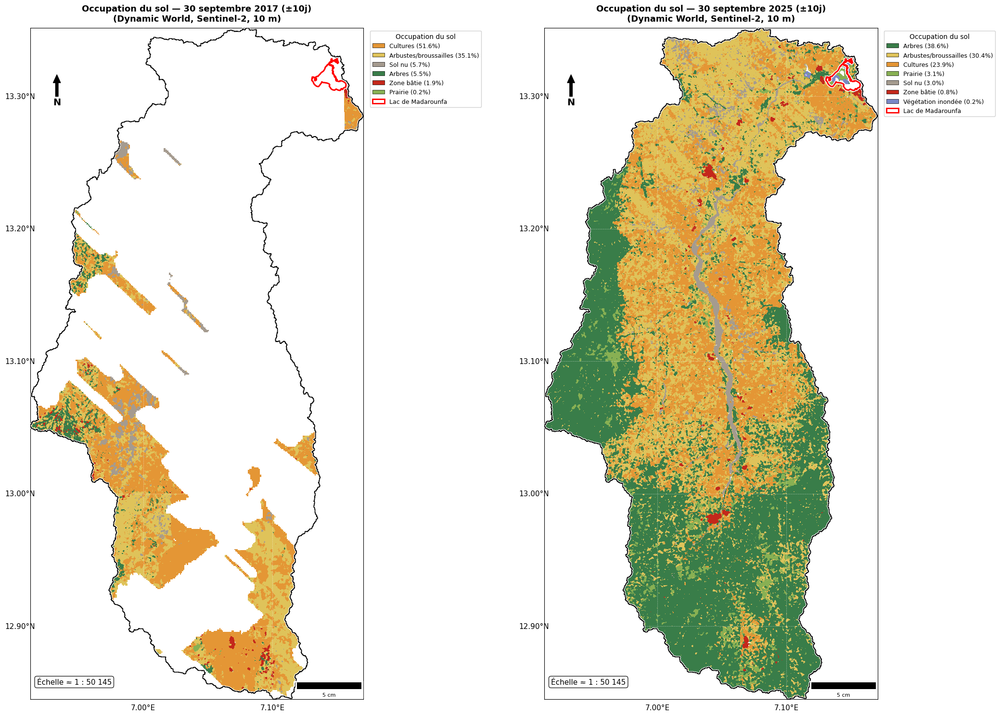

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE FINALE — MASQUÉE, AVEC POURCENTAGES ET HABILLAGE COMPLET
# ============================================================
def bounds_from_transform(arr, transform):
    b = rasterio.transform.array_bounds(arr.shape[0], arr.shape[1], transform)
    return [b[0], b[2], b[1], b[3]]  # left, right, bottom, top

extent_anc = bounds_from_transform(arr_anc, transform_anc)
extent_rec = bounds_from_transform(arr_rec, transform_rec)

fig, axes = plt.subplots(1, 2, figsize=(22, 15))

for ax, arr, transform, extent, annee, pct_dict in [
    (axes[0], arr_anc, transform_anc, extent_anc, annee_ancienne, pct_anc),
    (axes[1], arr_rec, transform_rec, extent_rec, annee_recente, pct_rec),
]:
    valeurs = sorted(pct_dict.keys())
    cmap = ListedColormap([classes_dynamicworld[v][1] for v in valeurs])
    norm = BoundaryNorm(valeurs + [valeurs[-1] + 1], cmap.N)

    ax.imshow(arr, cmap=cmap, norm=norm, extent=extent, zorder=1, interpolation='nearest')

    bassin_wgs84.boundary.plot(ax=ax, color='white', linewidth=2.8, zorder=3)
    bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.2, zorder=4)
    lake.boundary.plot(ax=ax, color='red', linewidth=2.2, zorder=5,
                        path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])

    # --- Habillage cartographique complet ---
    minx, miny, maxx, maxy = extent[0], extent[2], extent[1], extent[3]
    ajouter_habillage_carte_v2(ax, fig, minx, miny, maxx, maxy, source_crs="EPSG:4326")

    ax.set_title(f"Occupation du sol — 30 septembre {annee} (±10j)\n(Dynamic World, Sentinel-2, 10 m)",
                 fontsize=13, fontweight='bold', pad=10)

    # --- Légende AVEC pourcentages, propre à chaque carte ---
    legend_elements = [
        Patch(facecolor=pct_dict[v]['couleur'], edgecolor='black', linewidth=0.5,
              label=f"{pct_dict[v]['nom']} ({pct_dict[v]['pct']:.1f}%)")
        for v in sorted(pct_dict.keys(), key=lambda x: -pct_dict[x]['pct'])
    ]
    legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=2, label='Lac de Madarounfa'))
    ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.01, 1),
              fontsize=9, framealpha=0.9, title="Occupation du sol", title_fontsize=10)

    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_dynamicworld_FINAL.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_dynamicworld_FINAL.png"))

In [ ]:
# ============================================================
# DIAGNOSTIC — NOMBRE D'IMAGES DYNAMIC WORLD DISPONIBLES EN 2017 vs 2025
# ============================================================
print(f"Images utilisées pour {annee_ancienne} (30 sept ± 10j) : {n_anc}")
print(f"Images utilisées pour {annee_recente} (30 sept ± 10j) : {n_rec}")

Images utilisées pour 2017 (30 sept ± 10j) : 4
Images utilisées pour 2025 (30 sept ± 10j) : 4


In [ ]:
# ============================================================
# RETÉLÉCHARGEMENT 2017 AVEC FENÊTRE ÉLARGIE (±30 jours au lieu de ±10)
# ============================================================
composite_ancien, n_anc = dynamicworld_composite(2017, marge_jours=30)
print(f"2017 (±30j) : {n_anc} images utilisées")

dw_ancien_path = os.path.join(DEM_DIR, "dynamicworld_2017_v2.tif")
geemap.ee_export_image(composite_ancien, filename=dw_ancien_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
print("✅ Retéléchargé avec fenêtre élargie")

2017 (±30j) : 18 images utilisées
Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2017_v2.tif
✅ Retéléchargé avec fenêtre élargie


In [ ]:
# ============================================================
# ALTERNATIVE — REMPLISSAGE DES PIXELS MANQUANTS PAR UN COMPOSITE SAISONNIER PLUS LARGE
# ============================================================
def dynamicworld_composite_fallback(annee, mois=9, jour=30, marge_jours=30, marge_secours=90):
    date_cible = ee.Date.fromYMD(annee, mois, jour)

    coll_stricte = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
                     .filterBounds(bassin_geometry)
                     .filterDate(date_cible.advance(-marge_jours, 'day'), date_cible.advance(marge_jours, 'day')))
    composite_strict = coll_stricte.select('label').mode()

    coll_large = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
                   .filterBounds(bassin_geometry)
                   .filterDate(date_cible.advance(-marge_secours, 'day'), date_cible.advance(marge_secours, 'day')))
    composite_large = coll_large.select('label').mode()

    # Comble les trous du composite strict avec le composite large
    composite_final = composite_strict.unmask(composite_large).clip(bassin_geometry)
    return composite_final

composite_ancien = dynamicworld_composite_fallback(2017)
dw_ancien_path = os.path.join(DEM_DIR, "dynamicworld_2017_v3.tif")
geemap.ee_export_image(composite_ancien, filename=dw_ancien_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
print("✅ Composite 2017 avec remplissage des trous (fenêtre de secours ±90j)")

Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2017_v3.tif
✅ Composite 2017 avec remplissage des trous (fenêtre de secours ±90j)


In [ ]:
# ============================================================
# DIAGNOSTIC — COUVERTURE SPATIALE RÉELLE DES 4 IMAGES 2017
# ============================================================
def verifier_couverture(annee, mois=9, jour=30, marge_jours=10):
    date_cible = ee.Date.fromYMD(annee, mois, jour)
    coll = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
            .filterBounds(bassin_geometry)
            .filterDate(date_cible.advance(-marge_jours, 'day'), date_cible.advance(marge_jours, 'day')))
    count_img = coll.select('label').count().clip(bassin_geometry)  # nb d'observations valides par pixel
    stats = count_img.reduceRegion(reducer=ee.Reducer.frequencyHistogram(), geometry=bassin_geometry, scale=100, maxPixels=1e9).getInfo()
    return stats

print("2017 :", verifier_couverture(2017))
print("2025 :", verifier_couverture(2025))

2017 : {'label': {'1': 20252.160784313302, '2': 2154.5999999999995}}
2025 : {'label': {'1': 9258.847058823534, '2': 82937.6235294118, '3': 5, '4': 316.5647058823529}}


In [ ]:
# ============================================================
# COMPOSITE 2017 AVEC REMPLISSAGE DES TROUS (fenêtre stricte + secours)
# ============================================================
def dynamicworld_composite_fallback(annee, mois=9, jour=30, marge_jours=10, marge_secours=60):
    date_cible = ee.Date.fromYMD(annee, mois, jour)

    coll_stricte = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
                     .filterBounds(bassin_geometry)
                     .filterDate(date_cible.advance(-marge_jours, 'day'), date_cible.advance(marge_jours, 'day')))
    composite_strict = coll_stricte.select('label').mode()

    coll_large = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
                   .filterBounds(bassin_geometry)
                   .filterDate(date_cible.advance(-marge_secours, 'day'), date_cible.advance(marge_secours, 'day')))
    composite_large = coll_large.select('label').mode()
    n_secours = coll_large.size().getInfo()

    composite_final = composite_strict.unmask(composite_large).clip(bassin_geometry)
    print(f"{annee} : {n_secours} images dans la fenêtre de secours (±{marge_secours}j)")
    return composite_final

composite_ancien = dynamicworld_composite_fallback(2017)
dw_ancien_path = os.path.join(DEM_DIR, "dynamicworld_2017_final.tif")
geemap.ee_export_image(composite_ancien, filename=dw_ancien_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
print("✅ Composite 2017 régénéré avec remplissage des trous")

2017 : 32 images dans la fenêtre de secours (±60j)
Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2017_final.tif
✅ Composite 2017 régénéré avec remplissage des trous


In [ ]:
# ============================================================
# SECOURS ULTIME — SI ±60 JOURS NE SUFFIT PAS : COMPOSITE SUR L'ANNÉE ENTIÈRE
# ============================================================
coll_annee = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
              .filterBounds(bassin_geometry)
              .filterDate('2017-01-01', '2017-12-31'))
print(f"Images disponibles sur toute l'année 2017 : {coll_annee.size().getInfo()}")
composite_annee_2017 = coll_annee.select('label').mode().clip(bassin_geometry)

Images disponibles sur toute l'année 2017 : 68


In [ ]:
# ============================================================
# VÉRIFICATION DE LA COUVERTURE APRÈS REMPLISSAGE (2017)
# ============================================================
with rasterio.open(dw_ancien_path) as src:
    arr_verif = src.read(1)

total_pixels = arr_verif.size
pixels_valides = np.sum(arr_verif != src.nodata) if src.nodata is not None else np.sum(~np.isnan(arr_verif.astype(float)))
print(f"Pixels valides : {pixels_valides} / {total_pixels} ({100*pixels_valides/total_pixels:.1f}%)")

Pixels valides : 16198860 / 16223516 (99.8%)


In [ ]:
# ============================================================
# 2017 — COMPOSITE SUR TOUTE L'ANNÉE (solution de dernier recours)
# ============================================================
coll_annee_2017 = (ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')
                    .filterBounds(bassin_geometry)
                    .filterDate('2017-01-01', '2017-12-31'))
n_annee = coll_annee_2017.size().getInfo()
print(f"Images disponibles sur toute l'année 2017 : {n_annee}")

composite_2017_annee = coll_annee_2017.select('label').mode().clip(bassin_geometry)
dw_ancien_path = os.path.join(DEM_DIR, "dynamicworld_2017_annee_complete.tif")
geemap.ee_export_image(composite_2017_annee, filename=dw_ancien_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
print("✅ Composite 2017 sur année complète téléchargé")

Images disponibles sur toute l'année 2017 : 68
Generating URL ...
Please wait ...


In [ ]:
# ============================================================
# RELANCE DU MASQUAGE + POURCENTAGES SUR LE FICHIER CORRIGÉ
# ============================================================
print("Fichier utilisé pour 2017 :", dw_ancien_path)

arr_anc, transform_anc = masquer_sur_bassin(dw_ancien_path, bassin_wgs84)
arr_rec, transform_rec = masquer_sur_bassin(dw_recent_path, bassin_wgs84)

# Vérification rapide après masquage strict sur le bassin (pas juste la bounding box)
print(f"2017 — pixels valides après masquage bassin : {np.sum(~np.isnan(arr_anc))} / {arr_anc.size} "
      f"({100*np.sum(~np.isnan(arr_anc))/arr_anc.size:.1f}%)")

pct_anc = calculer_pourcentages(arr_anc, classes_dynamicworld)
pct_rec = calculer_pourcentages(arr_rec, classes_dynamicworld)
print("✅ Recalculé")

In [ ]:
# ============================================================
# RETOUR SUR LE FICHIER CORRECT (remplissage ±60j, 99.8% valide)
# ============================================================
dw_ancien_path = os.path.join(DEM_DIR, "dynamicworld_2017_final.tif")
print("Fichier utilisé :", dw_ancien_path)
print("Existe :", os.path.exists(dw_ancien_path))

Fichier utilisé : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2017_final.tif
Existe : True


In [ ]:
# ============================================================
# MASQUAGE CORRIGÉ — DIAGNOSTIC DE LA VRAIE VALEUR NODATA DU RASTER
# ============================================================
with rasterio.open(dw_ancien_path) as src:
    print("Nodata déclaré dans le fichier :", src.nodata)
    print("Valeurs uniques présentes :", np.unique(src.read(1))[:20], "...")

Nodata déclaré dans le fichier : 0.0
Valeurs uniques présentes : [0 1 2 3 4 5 6 7] ...


In [ ]:
# ============================================================
# MASQUAGE CORRIGÉ — SANS COLLISION AVEC LES VALEURS DE CLASSE RÉELLES
# ============================================================
def masquer_sur_bassin_v2(chemin_raster, bassin_geom_wgs84):
    with rasterio.open(chemin_raster) as src:
        # On masque avec crop=True mais SANS forcer de nodata arbitraire —
        # rasterio renvoie un masked array, qu'on convertit proprement en NaN
        arr_masked, transform_masked = rio_mask(src, bassin_geom_wgs84.geometry, crop=True, filled=False)
    arr = arr_masked[0].astype(float)
    arr = np.where(arr_masked[0].mask, np.nan, arr)  # NaN uniquement là où le mask indique "hors bassin"
    return arr, transform_masked

arr_anc, transform_anc = masquer_sur_bassin_v2(dw_ancien_path, bassin_wgs84)
arr_rec, transform_rec = masquer_sur_bassin_v2(dw_recent_path, bassin_wgs84)

print(f"2017 — pixels valides après masquage corrigé : {np.sum(~np.isnan(arr_anc))} / {arr_anc.size} "
      f"({100*np.sum(~np.isnan(arr_anc))/arr_anc.size:.1f}%)")

2017 — pixels valides après masquage corrigé : 9229707 / 16223516 (56.9%)


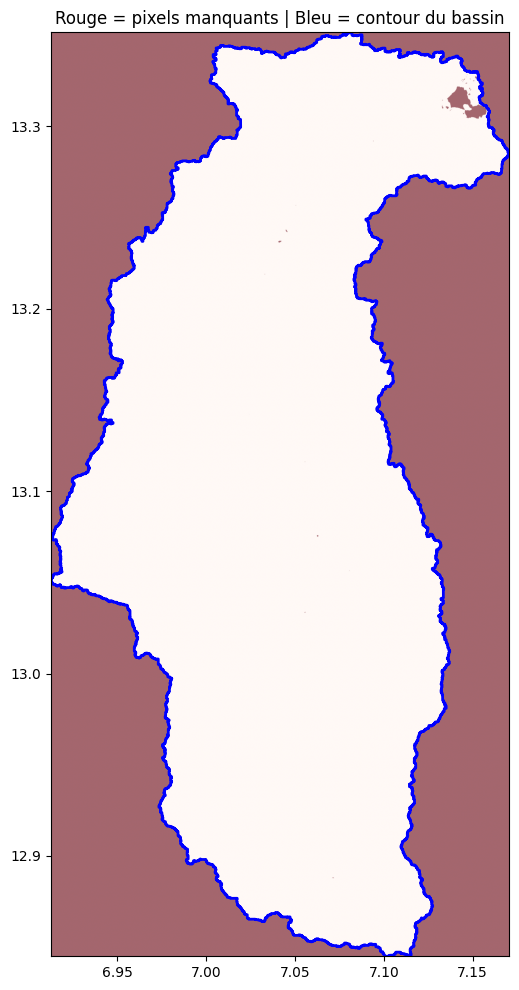

In [ ]:
# ============================================================
# VÉRIFICATION — LE BLANC EST-IL BIEN À L'EXTÉRIEUR DU CONTOUR, PAS DEDANS ?
# ============================================================
fig, ax = plt.subplots(figsize=(8, 12))
extent_verif = bounds_from_transform(arr_anc, transform_anc)

# Affiche en rouge les pixels manquants (NaN), en gris les pixels valides
verif_display = np.where(np.isnan(arr_anc), 1, 0)
ax.imshow(verif_display, cmap='Reds', extent=extent_verif, alpha=0.6)
bassin_wgs84.boundary.plot(ax=ax, color='blue', linewidth=2)
ax.set_title("Rouge = pixels manquants | Bleu = contour du bassin")
plt.show()

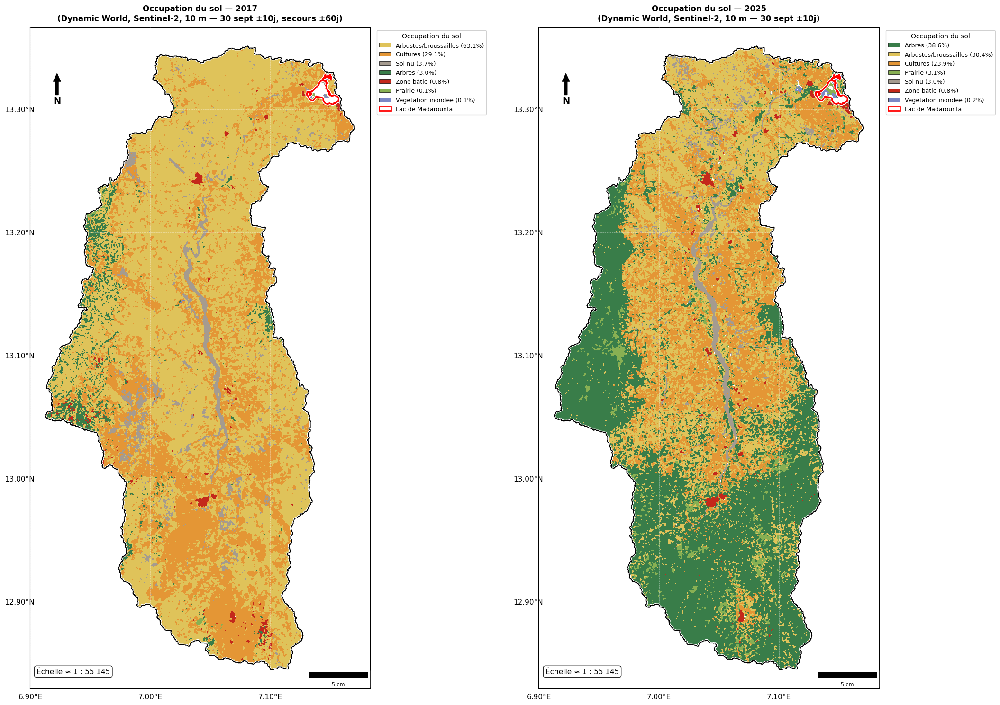

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE FINALE — 2017 vs 2025, COMPOSITES CORRIGÉS
# ============================================================
pct_anc = calculer_pourcentages(arr_anc, classes_dynamicworld)
pct_rec = calculer_pourcentages(arr_rec, classes_dynamicworld)

extent_anc = bounds_from_transform(arr_anc, transform_anc)
extent_rec = bounds_from_transform(arr_rec, transform_rec)

fig, axes = plt.subplots(1, 2, figsize=(22, 15))

for ax, arr, transform, extent, annee, pct_dict in [
    (axes[0], arr_anc, transform_anc, extent_anc, 2017, pct_anc),
    (axes[1], arr_rec, transform_rec, extent_rec, 2025, pct_rec),
]:
    valeurs = sorted(pct_dict.keys())
    cmap = ListedColormap([classes_dynamicworld[v][1] for v in valeurs])
    norm = BoundaryNorm(valeurs + [valeurs[-1] + 1], cmap.N)

    ax.imshow(arr, cmap=cmap, norm=norm, extent=extent, zorder=1, interpolation='nearest')

    bassin_wgs84.boundary.plot(ax=ax, color='white', linewidth=2.8, zorder=3)
    bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.2, zorder=4)
    lake.boundary.plot(ax=ax, color='red', linewidth=2.2, zorder=5,
                        path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])

    minx, miny, maxx, maxy = bassin_wgs84.total_bounds
    marge_x, marge_y = (maxx - minx) * 0.05, (maxy - miny) * 0.03
    ajouter_habillage_carte_v2(ax, fig, minx - marge_x, miny - marge_y, maxx + marge_x, maxy + marge_y,
                                 source_crs="EPSG:4326")

    n_images_label = "année complète" if "annee_complete" in dw_ancien_path and annee == 2017 else "30 sept ±10j, secours ±60j"
    ax.set_title(f"Occupation du sol — {annee}\n(Dynamic World, Sentinel-2, 10 m — {n_images_label if annee == 2017 else '30 sept ±10j'})",
                 fontsize=12, fontweight='bold', pad=10)

    legend_elements = [
        Patch(facecolor=pct_dict[v]['couleur'], edgecolor='black', linewidth=0.5,
              label=f"{pct_dict[v]['nom']} ({pct_dict[v]['pct']:.1f}%)")
        for v in sorted(pct_dict.keys(), key=lambda x: -pct_dict[x]['pct'])
    ]
    legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=2, label='Lac de Madarounfa'))
    ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.01, 1),
              fontsize=9, framealpha=0.9, title="Occupation du sol", title_fontsize=10)

    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_2017_2025_FINAL.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_2017_2025_FINAL.png"))

In [ ]:
# ============================================================
# CONFIRMATION DU BON FICHIER — SECOURS ±60 JOURS
# ============================================================
dw_ancien_path = os.path.join(DEM_DIR, "dynamicworld_2017_final.tif")
print("Fichier utilisé pour 2017 :", dw_ancien_path)
print("Existe :", os.path.exists(dw_ancien_path))

with rasterio.open(dw_ancien_path) as src:
    arr_test = src.read(1)
print(f"Pixels non-nuls avant masquage : {np.sum(arr_test != 0) + np.sum(arr_test == 0)} / {arr_test.size}")

Fichier utilisé pour 2017 : /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2017_final.tif
Existe : True
Pixels non-nuls avant masquage : 16223516 / 16223516


In [ ]:
# ============================================================
# MASQUAGE + POURCENTAGES SUR LE BON FICHIER
# ============================================================
arr_anc, transform_anc = masquer_sur_bassin_v2(dw_ancien_path, bassin_wgs84)
arr_rec, transform_rec = masquer_sur_bassin_v2(dw_recent_path, bassin_wgs84)

print(f"2017 (secours ±60j) — pixels valides après masquage : {np.sum(~np.isnan(arr_anc))} / {arr_anc.size} "
      f"({100*np.sum(~np.isnan(arr_anc))/arr_anc.size:.1f}%)")

pct_anc = calculer_pourcentages(arr_anc, classes_dynamicworld)
pct_rec = calculer_pourcentages(arr_rec, classes_dynamicworld)
print("✅ Recalculé sur le fichier ±60 jours")

2017 (secours ±60j) — pixels valides après masquage : 9229707 / 16223516 (56.9%)
✅ Recalculé sur le fichier ±60 jours


In [ ]:
# ============================================================
# 2016 — DIAGNOSTIC PUIS CORRECTION (même méthode que 2017)
# ============================================================
print("Couverture stricte 2016 (30 sept ±10j) :", verifier_couverture(2016))

composite_2016 = dynamicworld_composite_fallback(2016, marge_secours=60)
dw_2016_path = os.path.join(DEM_DIR, "dynamicworld_2016_final.tif")
geemap.ee_export_image(composite_2016, filename=dw_2016_path, scale=10, region=bassin_geometry, crs='EPSG:4326')
print("✅ Composite 2016 régénéré (secours ±60j)")

Couverture stricte 2016 (30 sept ±10j) : {'label': {'1': 251.52549019607827, '2': 86948.51372549015, '4': 388.5647058823528}}
2016 : 32 images dans la fenêtre de secours (±60j)
Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/Madarounfa_bassin_versant/dem/dynamicworld_2016_final.tif
✅ Composite 2016 régénéré (secours ±60j)


In [ ]:
# ============================================================
# VÉRIFICATION DE LA COUVERTURE APRÈS REMPLISSAGE (2016)
# ============================================================
with rasterio.open(dw_2016_path) as src:
    arr_verif_2016 = src.read(1)

total_pixels = arr_verif_2016.size
pixels_valides = np.sum(arr_verif_2016 != 0) + np.sum(arr_verif_2016 == 0)  # ajustez si nodata connu

arr_2016_masque, transform_2016 = masquer_sur_bassin_v2(dw_2016_path, bassin_wgs84)
print(f"2016 (secours ±60j) — pixels valides après masquage bassin : {np.sum(~np.isnan(arr_2016_masque))} / {arr_2016_masque.size} "
      f"({100*np.sum(~np.isnan(arr_2016_masque))/arr_2016_masque.size:.1f}%)")

2016 (secours ±60j) — pixels valides après masquage bassin : 9231586 / 16223516 (56.9%)


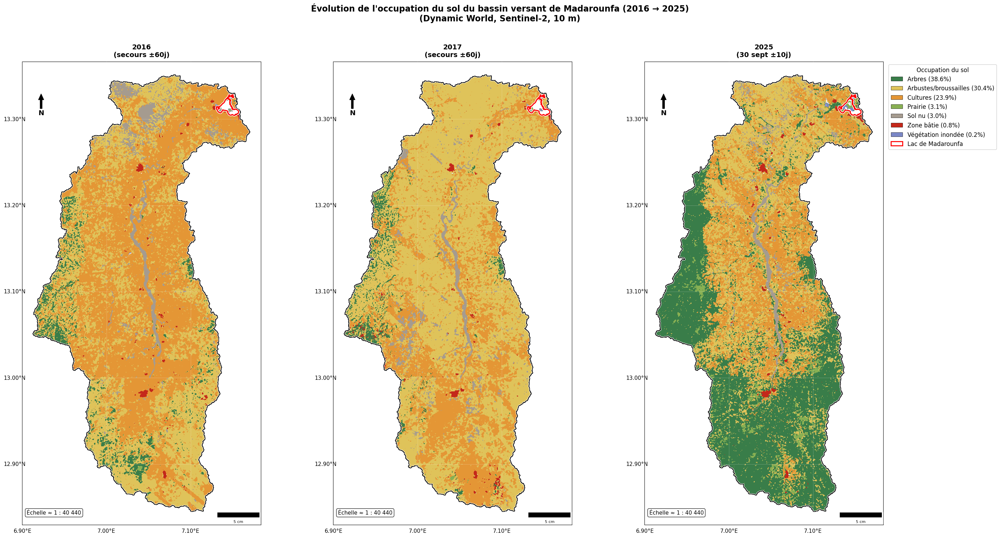

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE COMPARATIVE — 3 PANNEAUX (2016, 2017, 2025)
# ============================================================
arr_2016, transform_2016 = masquer_sur_bassin_v2(dw_2016_path, bassin_wgs84)
arr_2017, transform_2017 = masquer_sur_bassin_v2(dw_ancien_path, bassin_wgs84)  # dw_ancien_path = dynamicworld_2017_final.tif
arr_2025, transform_2025 = masquer_sur_bassin_v2(dw_recent_path, bassin_wgs84)

pct_2016 = calculer_pourcentages(arr_2016, classes_dynamicworld)
pct_2017 = calculer_pourcentages(arr_2017, classes_dynamicworld)
pct_2025 = calculer_pourcentages(arr_2025, classes_dynamicworld)

extent_2016 = bounds_from_transform(arr_2016, transform_2016)
extent_2017 = bounds_from_transform(arr_2017, transform_2017)
extent_2025 = bounds_from_transform(arr_2025, transform_2025)

fig, axes = plt.subplots(1, 3, figsize=(30, 15))

donnees_panneaux = [
    (axes[0], arr_2016, transform_2016, extent_2016, 2016, pct_2016, "secours ±60j"),
    (axes[1], arr_2017, transform_2017, extent_2017, 2017, pct_2017, "secours ±60j"),
    (axes[2], arr_2025, transform_2025, extent_2025, 2025, pct_2025, "30 sept ±10j"),
]

for ax, arr, transform, extent, annee, pct_dict, note_methode in donnees_panneaux:
    valeurs = sorted(pct_dict.keys())
    cmap = ListedColormap([classes_dynamicworld[v][1] for v in valeurs])
    norm = BoundaryNorm(valeurs + [valeurs[-1] + 1], cmap.N)

    ax.imshow(arr, cmap=cmap, norm=norm, extent=extent, zorder=1, interpolation='nearest')
    bassin_wgs84.boundary.plot(ax=ax, color='white', linewidth=2.8, zorder=3)
    bassin_wgs84.boundary.plot(ax=ax, color='black', linewidth=1.2, zorder=4)
    lake.boundary.plot(ax=ax, color='red', linewidth=2.2, zorder=5,
                        path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])

    minx, miny, maxx, maxy = bassin_wgs84.total_bounds
    marge_x, marge_y = (maxx - minx) * 0.05, (maxy - miny) * 0.03
    ajouter_habillage_carte_v2(ax, fig, minx - marge_x, miny - marge_y, maxx + marge_x, maxy + marge_y,
                                 source_crs="EPSG:4326")

    ax.set_title(f"{annee}\n({note_methode})", fontsize=14, fontweight='bold', pad=10)

    legend_elements = [
        Patch(facecolor=pct_dict[v]['couleur'], edgecolor='black', linewidth=0.5,
              label=f"{pct_dict[v]['nom']} ({pct_dict[v]['pct']:.1f}%)")
        for v in sorted(pct_dict.keys(), key=lambda x: -pct_dict[x]['pct'])
    ]
    if annee == 2025:
        legend_elements.append(Patch(facecolor='none', edgecolor='red', linewidth=2, label='Lac de Madarounfa'))
        ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.01, 1),
                  fontsize=12, framealpha=0.9, title="Occupation du sol", title_fontsize=12)

    ax.set_xticks([]); ax.set_yticks([])

fig.suptitle("Évolution de l'occupation du sol du bassin versant de Madarounfa (2016 → 2025)\n(Dynamic World, Sentinel-2, 10 m)",
             fontsize=17, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "occupation_sol_3panneaux_2016_2017_2025.png"), dpi=200, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "occupation_sol_3panneaux_2016_2017_2025.png"))

In [ ]:
# ============================================================
# CORRECTION — COULEUR DU CONTOUR DU LAC (magenta au lieu de rouge)
# ============================================================
COULEUR_LAC = "#E91E8C"  # magenta vif, absent de toute palette d'occupation du sol utilisée

# Dans vos cellules de carte, remplacez chaque occurrence de :
#   lake.boundary.plot(ax=ax, color='red', linewidth=2.2, zorder=5, ...)
# par :
#   lake.boundary.plot(ax=ax, color=COULEUR_LAC, linewidth=2.2, zorder=5,
#                       path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])

In [ ]:
# ============================================================
# FONCTION D'HABILLAGE — VERSION "LISIBLE MOBILE / WHATSAPP"
# ============================================================
def ajouter_habillage_carte_mobile(ax, fig, minx, miny, maxx, maxy, source_crs="EPSG:3857", couleur_grille='white'):
    transformer_to_wgs84 = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)
    transformer_to_meters = Transformer.from_crs(source_crs, "EPSG:32632", always_xy=True)

    x0_m, y0_m = transformer_to_meters.transform(minx, (miny + maxy) / 2)
    x1_m, y1_m = transformer_to_meters.transform(maxx, (miny + maxy) / 2)
    largeur_carte_m = np.hypot(x1_m - x0_m, y1_m - y0_m)

    lon_min, lat_min = transformer_to_wgs84.transform(minx, miny)
    lon_max, lat_max = transformer_to_wgs84.transform(maxx, maxy)
    etendue_deg = max(lon_max - lon_min, lat_max - lat_min)
    intervalle_deg = 0.5 if etendue_deg > 2 else 0.25 if etendue_deg > 1 else 0.1 if etendue_deg > 0.3 else 0.05

    transformer_to_src = Transformer.from_crs("EPSG:4326", source_crs, always_xy=True)
    lons = np.arange(np.floor(lon_min / intervalle_deg) * intervalle_deg, lon_max + intervalle_deg, intervalle_deg)
    lats = np.arange(np.floor(lat_min / intervalle_deg) * intervalle_deg, lat_max + intervalle_deg, intervalle_deg)

    for lon in lons:
        x0, y0 = transformer_to_src.transform(lon, lat_min); x1, y1 = transformer_to_src.transform(lon, lat_max)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.8, linestyle='--', alpha=0.6, zorder=6)
        ax.annotate(f"{lon:.2f}°E", xy=(x0, miny), xytext=(0, -20), textcoords='offset points',
                    ha='center', fontsize=11, color='black', fontweight='bold')
    for lat in lats:
        x0, y0 = transformer_to_src.transform(lon_min, lat); x1, y1 = transformer_to_src.transform(lon_max, lat)
        ax.plot([x0, x1], [y0, y1], color=couleur_grille, linewidth=0.8, linestyle='--', alpha=0.6, zorder=6)
        ax.annotate(f"{lat:.2f}°N", xy=(minx, y0), xytext=(-46, 0), textcoords='offset points',
                    va='center', fontsize=11, color='black', fontweight='bold')

    ax.set_xlim(minx, maxx); ax.set_ylim(miny, maxy)

    x_arrow, y_arrow = 0.08, 0.93
    ax.annotate('N', xy=(x_arrow, y_arrow), xytext=(x_arrow, y_arrow - 0.05),
                xycoords='axes fraction', textcoords='axes fraction',
                fontsize=20, fontweight='bold', ha='center', color='black',
                arrowprops=dict(facecolor='black', edgecolor='black', width=6, headwidth=16), zorder=10)

    ax.add_artist(ScaleBar(1, location='lower right', box_alpha=0.9, color='black',
                            box_color='white', font_properties={'size': 12, 'weight': 'bold'}))

    largeur_papier_m = fig.get_size_inches()[0] * 0.0254
    denominateur = largeur_carte_m / largeur_papier_m
    ax.text(0.02, 0.02, f"Échelle ≈ 1 : {denominateur:,.0f}".replace(",", " "),
            transform=ax.transAxes, fontsize=11, fontweight='bold', ha='left', va='bottom', color='black',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9), zorder=10)

print("✅ Fonction mobile créée — polices et traits agrandis")

✅ Fonction mobile créée — polices et traits agrandis


In [ ]:
# ============================================================
# TÉLÉCHARGEMENT DES LIMITES ADMINISTRATIVES (Niger + Nigeria)
# ============================================================
def telecharger_geoboundaries(iso3, niveau):
    meta = requests.get(f"https://www.geoboundaries.org/api/current/gbOpen/{iso3}/{niveau}/").json()
    return gpd.read_file(meta['gjDownloadURL'])

communes_niger = telecharger_geoboundaries("NER", "ADM2")   # départements du Niger
communes_nigeria = telecharger_geoboundaries("NGA", "ADM2")  # LGA du Nigeria
pays_niger = telecharger_geoboundaries("NER", "ADM0")
regions_niger = telecharger_geoboundaries("NER", "ADM1")     # régions (Maradi, etc.)

print(f"✅ Niger : {len(communes_niger)} départements | Nigeria : {len(communes_nigeria)} LGA")

✅ Niger : 67 départements | Nigeria : 774 LGA


In [ ]:
# ============================================================
# COMMUNES/DÉPARTEMENTS CHEVAUCHÉS PAR LE BASSIN
# ============================================================
communes_niger = communes_niger.to_crs("EPSG:4326")
communes_nigeria = communes_nigeria.to_crs("EPSG:4326")
communes_toutes = pd.concat([communes_niger.assign(pays="Niger"), communes_nigeria.assign(pays="Nigeria")], ignore_index=True)

bassin_union = bassin_wgs84.geometry.unary_union
communes_bassin = communes_toutes[communes_toutes.intersects(bassin_union)].copy()

print(f"Le bassin chevauche {len(communes_bassin)} unité(s) administrative(s) :")
print(communes_bassin[['shapeName', 'pays']].to_string(index=False))

transfrontalier = communes_bassin['pays'].nunique() > 1
print(f"\n🌍 Caractère transfrontalier : {'CONFIRMÉ' if transfrontalier else 'non confirmé — bassin entièrement au Niger'}")

Le bassin chevauche 4 unité(s) administrative(s) :
 shapeName    pays
Madarounfa   Niger
     Zurmi Nigeria
     Jibia Nigeria
   Batsari Nigeria

🌍 Caractère transfrontalier : CONFIRMÉ


NameError: name 'COULEUR_LAC' is not defined

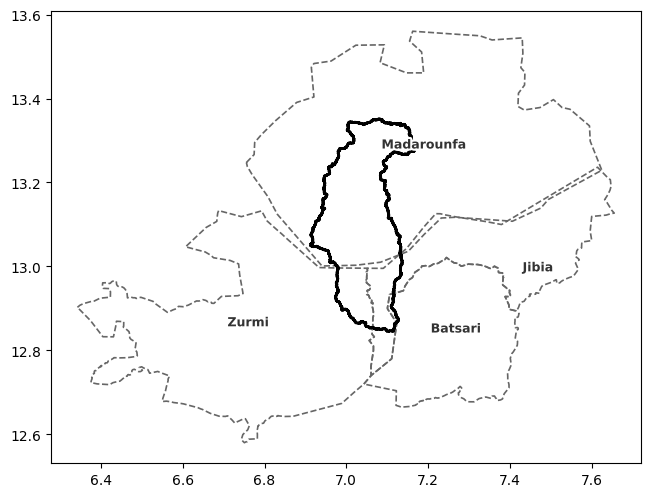

In [ ]:
# ============================================================
# CARTE COMPOSITE — PRINCIPALE + 2 CARTONS DE LOCALISATION
# ============================================================
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(16, 15))
gs = gridspec.GridSpec(2, 3, width_ratios=[2.2, 1, 1], height_ratios=[1, 1], wspace=0.15, hspace=0.15)

# --- Carte principale (bassin + lac + communes chevauchées) ---
ax_main = fig.add_subplot(gs[:, 0])
communes_bassin.boundary.plot(ax=ax_main, color='#666666', linewidth=1.2, linestyle='--', zorder=2)
for _, row in communes_bassin.iterrows():
    pt = row.geometry.representative_point()
    ax_main.annotate(row['shapeName'], xy=(pt.x, pt.y), fontsize=9, fontweight='bold', ha='center',
                      color='#333333', zorder=6, path_effects=[pe.withStroke(linewidth=3, foreground='white')])

bassin_wgs84.boundary.plot(ax=ax_main, color='black', linewidth=2, zorder=4)
lake.boundary.plot(ax=ax_main, color=COULEUR_LAC, linewidth=2.2, zorder=5,
                    path_effects=[pe.withStroke(linewidth=4.5, foreground='white')])

minx, miny, maxx, maxy = bassin_wgs84.total_bounds
marge = 0.15
ajouter_habillage_carte_mobile(ax_main, fig, minx - marge, miny - marge, maxx + marge, maxy + marge, source_crs="EPSG:4326")
ax_main.set_title("Bassin versant de Madarounfa\net limites administratives chevauchées", fontsize=15, fontweight='bold')
ax_main.set_xticks([]); ax_main.set_yticks([])

# --- Carton 1 : Niger entier, avec rectangle de localisation ---
ax_niger = fig.add_subplot(gs[0, 1:])
pays_niger.boundary.plot(ax=ax_niger, color='black', linewidth=1)
regions_niger.boundary.plot(ax=ax_niger, color='#999999', linewidth=0.5)
rect = plt.Rectangle((minx - marge, miny - marge), (maxx - minx) + 2*marge, (maxy - miny) + 2*marge,
                      fill=False, edgecolor=COULEUR_LAC, linewidth=2, zorder=5)
ax_niger.add_patch(rect)
ax_niger.set_title("Localisation dans le Niger", fontsize=11, fontweight='bold')
ax_niger.set_xticks([]); ax_niger.set_yticks([])
ax_niger.set_aspect('equal')

# --- Carton 2 : département de Madarounfa, zoomé ---
ax_dept = fig.add_subplot(gs[1, 1:])
dept_madarounfa = communes_niger[communes_niger['shapeName'].str.contains("Madarounfa", case=False, na=False)]
if not dept_madarounfa.empty:
    dept_madarounfa.boundary.plot(ax=ax_dept, color='black', linewidth=1.5)
    dminx, dminy, dmaxx, dmaxy = dept_madarounfa.total_bounds
    dm = 0.05
    ax_dept.set_xlim(dminx - dm, dmaxx + dm); ax_dept.set_ylim(dminy - dm, dmaxy + dm)
bassin_wgs84.boundary.plot(ax=ax_dept, color=COULEUR_LAC, linewidth=1.8, zorder=4)
lake.boundary.plot(ax=ax_dept, color=COULEUR_LAC, linewidth=1.5, zorder=5)
ax_dept.set_title("Localisation dans le département\nde Madarounfa", fontsize=11, fontweight='bold')
ax_dept.set_xticks([]); ax_dept.set_yticks([])
ax_dept.set_aspect('equal')

plt.savefig(os.path.join(FIG_DIR, "carte_localisation_madarounfa.png"), dpi=150, bbox_inches='tight')
plt.show()
files.download(os.path.join(FIG_DIR, "carte_localisation_madarounfa.png"))

In [ ]:
# ============================================================
# FONCTION D'ÉCHELLE MANUELLE POUR CARTES EN DEGRÉS (remplace ScaleBar, buggé en WGS84)
# ============================================================
def ajouter_echelle_degres(ax, minx, miny, maxx, maxy, position='lower right'):
    """Dessine une barre d'échelle graphique correcte pour un axe en degrés."""
    transformer = Transformer.from_crs("EPSG:4326", "EPSG:32632", always_xy=True)
    lat_ref = (miny + maxy) / 2
    x0, y0 = transformer.transform(minx, lat_ref)
    x1, y1 = transformer.transform(maxx, lat_ref)
    largeur_totale_km = np.hypot(x1 - x0, y1 - y0) / 1000

    # Choix d'une longueur "ronde" pour la barre (environ 1/4 de la largeur de carte)
    cible_km = largeur_totale_km / 4
    paliers = [1, 2, 5, 10, 20, 25, 50, 100, 200, 250, 500]
    barre_km = min(paliers, key=lambda p: abs(p - cible_km))

    # Conversion de cette distance réelle en équivalent degrés à cette latitude
    x0b, y0b = transformer.transform(minx, lat_ref)
    x_end, _ = transformer.transform(minx, lat_ref)
    from pyproj import Geod
    geod = Geod(ellps="WGS84")
    lon_end, _, _ = geod.fwd(minx, lat_ref, 90, barre_km * 1000)
    barre_deg = lon_end - minx

    x_start = maxx - (maxx - minx) * 0.32
    y_bar = miny + (maxy - miny) * 0.035

    ax.plot([x_start, x_start + barre_deg], [y_bar, y_bar], color='black', linewidth=3, zorder=10,
            solid_capstyle='butt')
    for x_tick in [x_start, x_start + barre_deg]:
        ax.plot([x_tick, x_tick], [y_bar - (maxy-miny)*0.006, y_bar + (maxy-miny)*0.006], color='black', linewidth=1.5, zorder=10)
    ax.text(x_start + barre_deg / 2, y_bar + (maxy - miny) * 0.018, f"{barre_km} km",
            ha='center', fontsize=10, fontweight='bold', color='black', zorder=10)

    denom = (largeur_totale_km * 1000) / (8 * 0.0254)  # équivalent 1:N pour une carte de ~8 pouces de large
    ax.text(0.02, 0.02, f"1 : {denom:,.0f}".replace(",", " "), transform=ax.transAxes,
            fontsize=9, ha='left', va='bottom', color='#444444',
            bbox=dict(boxstyle='round', facecolor='white', edgecolor='#cccccc', alpha=0.9), zorder=10)

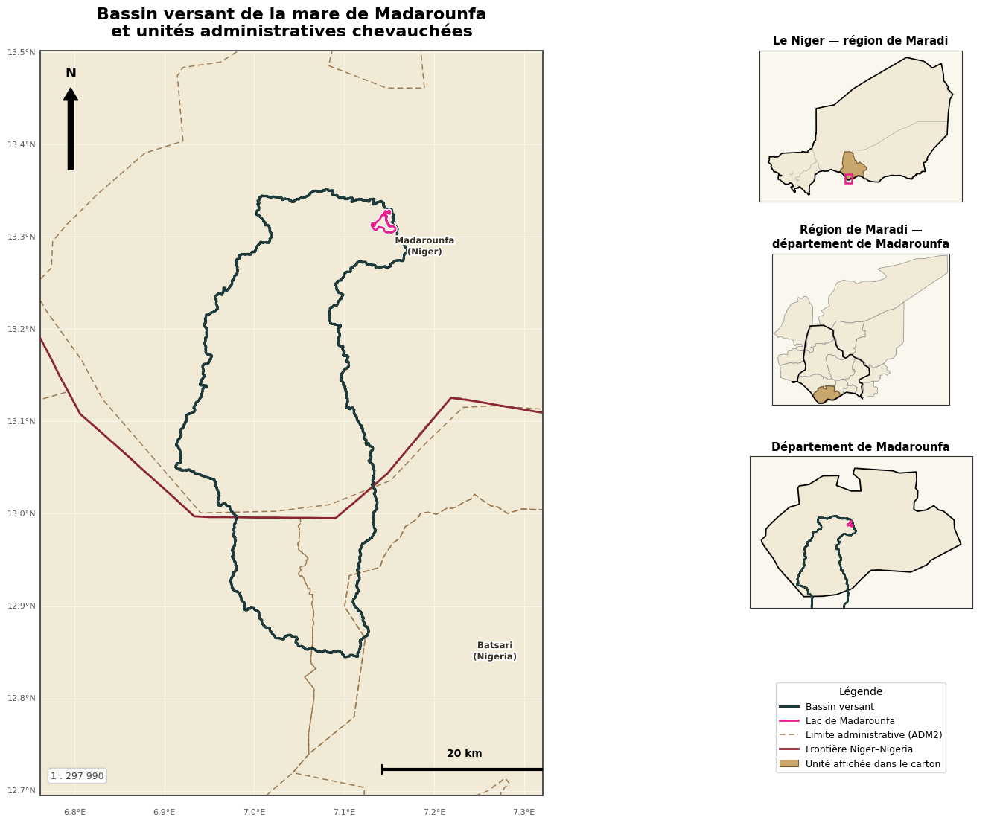

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE COMPOSITE — MISE EN PAGE REVUE (3 cartons + légende alignés, palette harmonisée)
# ============================================================
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as pe
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle

# --- Palette harmonisée ---
COULEUR_LAC = "#E91E8C"
COULEUR_BASSIN = "#1F3A3A"
COULEUR_ADMIN = "#9C7A54"
COULEUR_FRONTIERE = "#8B2635"
COULEUR_FOND_TERRE = "#F1EAD6"
COULEUR_FOND_CARTON = "#FAF7EE"
COULEUR_SURLIGNAGE = "#C9A66B"

# --- Récupération de la région de Maradi (pour le nouveau carton) ---
region_maradi = regions_niger[regions_niger['shapeName'].str.contains("Maradi", case=False, na=False)]
departements_maradi = communes_niger[communes_niger.intersects(region_maradi.unary_union)] if not region_maradi.empty else communes_niger.iloc[[]]

fig = plt.figure(figsize=(19, 13), facecolor='white')
# Colonne principale large (carte) + colonne étroite (3 cartons + légende empilés)
gs = gridspec.GridSpec(4, 2, width_ratios=[3.0, 1.0], height_ratios=[1, 1, 1, 0.9], wspace=0.08, hspace=0.35)

# ============================================================
# CARTE PRINCIPALE
# ============================================================
ax_main = fig.add_subplot(gs[:, 0])
ax_main.set_facecolor(COULEUR_FOND_TERRE)

pays_niger.boundary.plot(ax=ax_main, color=COULEUR_FRONTIERE, linewidth=2, zorder=3)
communes_bassin.boundary.plot(ax=ax_main, color=COULEUR_ADMIN, linewidth=1.1, linestyle=(0, (5, 3)), zorder=2)
for _, row in communes_bassin.iterrows():
    pt = row.geometry.representative_point()
    ax_main.annotate(f"{row['shapeName']}\n({row['pays']})", xy=(pt.x, pt.y), fontsize=8.5, fontweight='bold',
                      ha='center', color='#3A3226', zorder=6,
                      path_effects=[pe.withStroke(linewidth=3, foreground='white')])

bassin_wgs84.boundary.plot(ax=ax_main, color=COULEUR_BASSIN, linewidth=2.2, zorder=4)
lake.boundary.plot(ax=ax_main, color=COULEUR_LAC, linewidth=2, zorder=5,
                    path_effects=[pe.withStroke(linewidth=4, foreground='white')])

minx, miny, maxx, maxy = bassin_wgs84.total_bounds
marge = 0.15
xmin_m, xmax_m, ymin_m, ymax_m = minx - marge, maxx + marge, miny - marge, maxy + marge
ax_main.set_xlim(xmin_m, xmax_m); ax_main.set_ylim(ymin_m, ymax_m)

for lon in np.arange(np.floor(xmin_m*10)/10, xmax_m, 0.1):
    ax_main.axvline(lon, color='white', linewidth=0.6, alpha=0.7, zorder=1)
    ax_main.annotate(f"{lon:.1f}°E", xy=(lon, ymin_m), xytext=(0, -18), textcoords='offset points',
                      ha='center', fontsize=8, color='#555555')
for lat in np.arange(np.floor(ymin_m*10)/10, ymax_m, 0.1):
    ax_main.axhline(lat, color='white', linewidth=0.6, alpha=0.7, zorder=1)
    ax_main.annotate(f"{lat:.1f}°N", xy=(xmin_m, lat), xytext=(-32, 0), textcoords='offset points',
                      va='center', fontsize=8, color='#555555')

ajouter_echelle_degres(ax_main, xmin_m, ymin_m, xmax_m, ymax_m)

ax_main.annotate('', xy=(0.06, 0.95), xytext=(0.06, 0.84), xycoords='axes fraction',
                  arrowprops=dict(facecolor='black', edgecolor='black', width=5, headwidth=14))
ax_main.text(0.06, 0.965, 'N', transform=ax_main.transAxes, ha='center', fontsize=13, fontweight='bold')

ax_main.set_title("Bassin versant de la mare de Madarounfa\net unités administratives chevauchées",
                   fontsize=16, fontweight='bold', pad=14)
ax_main.set_xticks([]); ax_main.set_yticks([])
for spine in ax_main.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(1.2)

# ============================================================
# CARTON 1 — NIGER (avec région de Maradi surlignée)
# ============================================================
ax_niger = fig.add_subplot(gs[0, 1])
ax_niger.set_facecolor(COULEUR_FOND_CARTON)
regions_niger.plot(ax=ax_niger, color=COULEUR_FOND_TERRE, edgecolor='#AAAAAA', linewidth=0.4)
if not region_maradi.empty:
    region_maradi.plot(ax=ax_niger, color=COULEUR_SURLIGNAGE, edgecolor='#7A5C33', linewidth=0.8, zorder=3)
pays_niger.boundary.plot(ax=ax_niger, color='black', linewidth=1.2, zorder=4)
rect = Rectangle((xmin_m, ymin_m), xmax_m - xmin_m, ymax_m - ymin_m,
                  fill=False, edgecolor=COULEUR_LAC, linewidth=1.8, zorder=5)
ax_niger.add_patch(rect)
ax_niger.set_title("Le Niger — région de Maradi", fontsize=10.5, fontweight='bold', pad=6)
ax_niger.set_xticks([]); ax_niger.set_yticks([])
ax_niger.set_aspect('equal')
for spine in ax_niger.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(0.8)

# ============================================================
# CARTON 2 — RÉGION DE MARADI (avec départements, Madarounfa surligné)
# ============================================================
ax_region = fig.add_subplot(gs[1, 1])
ax_region.set_facecolor(COULEUR_FOND_CARTON)
if not departements_maradi.empty:
    departements_maradi.plot(ax=ax_region, color=COULEUR_FOND_TERRE, edgecolor='#999999', linewidth=0.6)
    dept_madarounfa_hl = departements_maradi[departements_maradi['shapeName'].str.contains("Madarounfa", case=False, na=False)]
    if not dept_madarounfa_hl.empty:
        dept_madarounfa_hl.plot(ax=ax_region, color=COULEUR_SURLIGNAGE, edgecolor='#7A5C33', linewidth=1, zorder=3)
    rminx, rminy, rmaxx, rmaxy = departements_maradi.total_bounds
    rm = 0.05
    ax_region.set_xlim(rminx - rm, rmaxx + rm); ax_region.set_ylim(rminy - rm, rmaxy + rm)
if not region_maradi.empty:
    region_maradi.boundary.plot(ax=ax_region, color='black', linewidth=1.2, zorder=4)
ax_region.set_title("Région de Maradi —\ndépartement de Madarounfa", fontsize=10.5, fontweight='bold', pad=6)
ax_region.set_xticks([]); ax_region.set_yticks([])
ax_region.set_aspect('equal')
for spine in ax_region.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(0.8)

# ============================================================
# CARTON 3 — DÉPARTEMENT DE MADAROUNFA
# ============================================================
ax_dept = fig.add_subplot(gs[2, 1])
ax_dept.set_facecolor(COULEUR_FOND_CARTON)
dept_madarounfa = communes_niger[communes_niger['shapeName'].str.contains("Madarounfa", case=False, na=False)]
if not dept_madarounfa.empty:
    dept_madarounfa.plot(ax=ax_dept, color=COULEUR_FOND_TERRE, edgecolor='black', linewidth=1.3)
    dminx, dminy, dmaxx, dmaxy = dept_madarounfa.total_bounds
    dm = 0.05
    ax_dept.set_xlim(dminx - dm, dmaxx + dm); ax_dept.set_ylim(dminy - dm, dmaxy + dm)
bassin_wgs84.boundary.plot(ax=ax_dept, color=COULEUR_BASSIN, linewidth=1.6, zorder=4)
lake.boundary.plot(ax=ax_dept, color=COULEUR_LAC, linewidth=1.4, zorder=5)
ax_dept.set_title("Département de Madarounfa", fontsize=10.5, fontweight='bold', pad=6)
ax_dept.set_xticks([]); ax_dept.set_yticks([])
ax_dept.set_aspect('equal')
for spine in ax_dept.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(0.8)

# ============================================================
# LÉGENDE — panneau dédié, même colonne que les cartons
# ============================================================
ax_legend = fig.add_subplot(gs[3, 1])
ax_legend.axis('off')
legend_elements = [
    Line2D([0], [0], color=COULEUR_BASSIN, linewidth=2.2, label='Bassin versant'),
    Line2D([0], [0], color=COULEUR_LAC, linewidth=2, label='Lac de Madarounfa'),
    Line2D([0], [0], color=COULEUR_ADMIN, linewidth=1.1, linestyle=(0, (5, 3)), label='Limite administrative (ADM2)'),
    Line2D([0], [0], color=COULEUR_FRONTIERE, linewidth=2, label='Frontière Niger–Nigeria'),
    Rectangle((0, 0), 1, 1, facecolor=COULEUR_SURLIGNAGE, edgecolor='#7A5C33', linewidth=0.8, label='Unité affichée dans le carton'),
]
ax_legend.legend(handles=legend_elements, loc='center', fontsize=9, frameon=True,
                  facecolor='white', edgecolor='#cccccc', title="Légende", title_fontsize=10)

plt.savefig(os.path.join(FIG_DIR, "carte_localisation_madarounfa_v3.png"), dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
files.download(os.path.join(FIG_DIR, "carte_localisation_madarounfa_v3.png"))

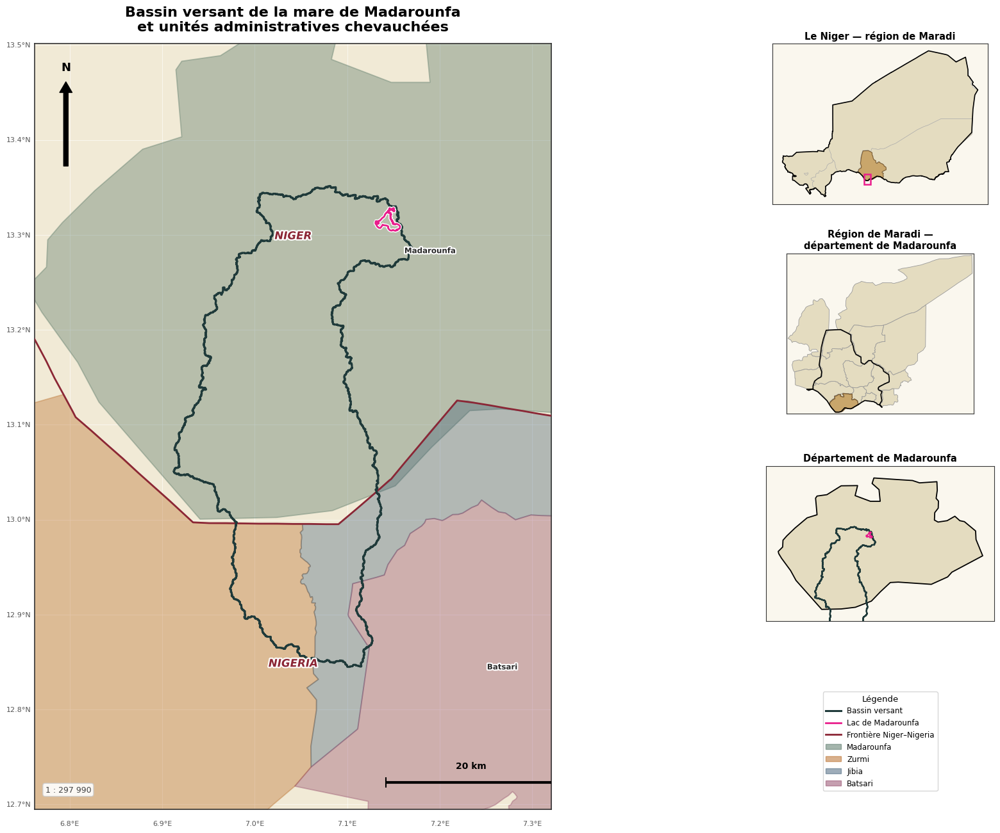

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# CARTE COMPOSITE — ESPACEMENT RÉDUIT, LABEL NIGERIA, COULEURS UNIQUES PAR ENTITÉ
# ============================================================
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as pe
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle
from shapely.geometry import box

COULEUR_LAC = "#E91E8C"
COULEUR_BASSIN = "#1F3A3A"
COULEUR_FRONTIERE = "#8B2635"
COULEUR_FOND_CARTON = "#FAF7EE"
COULEUR_SURLIGNAGE = "#C9A66B"

# --- Palette unique par entité administrative chevauchée (aucune couleur partagée) ---
palette_entites = ["#4C6E5D", "#B5651D", "#3E5C76", "#8E4162", "#6A8E3A", "#A67C52", "#4A4E69", "#C08497"]
noms_entites = communes_bassin['shapeName'].tolist()
couleur_par_entite = {nom: palette_entites[i % len(palette_entites)] for i, nom in enumerate(noms_entites)}

region_maradi = regions_niger[regions_niger['shapeName'].str.contains("Maradi", case=False, na=False)]
departements_maradi = communes_niger[communes_niger.intersects(region_maradi.unary_union)] if not region_maradi.empty else communes_niger.iloc[[]]

fig = plt.figure(figsize=(19, 13), facecolor='white')
# Colonne principale élargie, cartons resserrés, espacement horizontal réduit
gs = gridspec.GridSpec(4, 2, width_ratios=[3.6, 0.9], height_ratios=[1, 1, 1, 0.85], wspace=0.03, hspace=0.32)

# ============================================================
# CARTE PRINCIPALE
# ============================================================
ax_main = fig.add_subplot(gs[:, 0])
ax_main.set_facecolor("#F1EAD6")

pays_niger.boundary.plot(ax=ax_main, color=COULEUR_FRONTIERE, linewidth=2, zorder=3)

# Chaque entité administrative remplie de sa propre couleur
for _, row in communes_bassin.iterrows():
    couleur = couleur_par_entite[row['shapeName']]
    gpd.GeoSeries([row.geometry]).plot(ax=ax_main, color=couleur, alpha=0.35, edgecolor=couleur, linewidth=1.3, zorder=2)
    pt = row.geometry.representative_point()
    ax_main.annotate(row['shapeName'], xy=(pt.x, pt.y), fontsize=8.5, fontweight='bold',
                      ha='center', color='#2A2A2A', zorder=6,
                      path_effects=[pe.withStroke(linewidth=3, foreground='white')])

bassin_wgs84.boundary.plot(ax=ax_main, color=COULEUR_BASSIN, linewidth=2.2, zorder=4)
lake.boundary.plot(ax=ax_main, color=COULEUR_LAC, linewidth=2, zorder=5,
                    path_effects=[pe.withStroke(linewidth=4, foreground='white')])

minx, miny, maxx, maxy = bassin_wgs84.total_bounds
marge = 0.15
xmin_m, xmax_m, ymin_m, ymax_m = minx - marge, maxx + marge, miny - marge, maxy + marge
ax_main.set_xlim(xmin_m, xmax_m); ax_main.set_ylim(ymin_m, ymax_m)

# --- Labels de pays, placés automatiquement selon la géométrie réelle dans la vue ---
view_box = box(xmin_m, ymin_m, xmax_m, ymax_m)
niger_geom = pays_niger.unary_union
niger_in_view = view_box.intersection(niger_geom)
nigeria_in_view = view_box.difference(niger_geom)

if not niger_in_view.is_empty:
    pt_niger = niger_in_view.representative_point()
    ax_main.annotate("NIGER", xy=(pt_niger.x, pt_niger.y - 0.05), fontsize=12, fontweight='bold',
                      ha='center', color=COULEUR_FRONTIERE, zorder=7, style='italic',
                      path_effects=[pe.withStroke(linewidth=3, foreground='white')])
if not nigeria_in_view.is_empty:
    pt_nigeria = nigeria_in_view.representative_point()
    ax_main.annotate("NIGERIA", xy=(pt_nigeria.x, pt_nigeria.y), fontsize=12, fontweight='bold',
                      ha='center', color=COULEUR_FRONTIERE, zorder=7, style='italic',
                      path_effects=[pe.withStroke(linewidth=3, foreground='white')])

for lon in np.arange(np.floor(xmin_m*10)/10, xmax_m, 0.1):
    ax_main.axvline(lon, color='white', linewidth=0.6, alpha=0.7, zorder=1)
    ax_main.annotate(f"{lon:.1f}°E", xy=(lon, ymin_m), xytext=(0, -18), textcoords='offset points',
                      ha='center', fontsize=8, color='#555555')
for lat in np.arange(np.floor(ymin_m*10)/10, ymax_m, 0.1):
    ax_main.axhline(lat, color='white', linewidth=0.6, alpha=0.7, zorder=1)
    ax_main.annotate(f"{lat:.1f}°N", xy=(xmin_m, lat), xytext=(-32, 0), textcoords='offset points',
                      va='center', fontsize=8, color='#555555')

ajouter_echelle_degres(ax_main, xmin_m, ymin_m, xmax_m, ymax_m)

ax_main.annotate('', xy=(0.06, 0.95), xytext=(0.06, 0.84), xycoords='axes fraction',
                  arrowprops=dict(facecolor='black', edgecolor='black', width=5, headwidth=14))
ax_main.text(0.06, 0.965, 'N', transform=ax_main.transAxes, ha='center', fontsize=13, fontweight='bold')

ax_main.set_title("Bassin versant de la mare de Madarounfa\net unités administratives chevauchées",
                   fontsize=16, fontweight='bold', pad=14)
ax_main.set_xticks([]); ax_main.set_yticks([])
for spine in ax_main.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(1.2)

# ============================================================
# CARTON 1 — NIGER (région de Maradi surlignée)
# ============================================================
ax_niger = fig.add_subplot(gs[0, 1])
ax_niger.set_facecolor(COULEUR_FOND_CARTON)
regions_niger.plot(ax=ax_niger, color="#E4DCC0", edgecolor='#AAAAAA', linewidth=0.4)
if not region_maradi.empty:
    region_maradi.plot(ax=ax_niger, color=COULEUR_SURLIGNAGE, edgecolor='#7A5C33', linewidth=0.8, zorder=3)
pays_niger.boundary.plot(ax=ax_niger, color='black', linewidth=1.2, zorder=4)
rect = Rectangle((xmin_m, ymin_m), xmax_m - xmin_m, ymax_m - ymin_m,
                  fill=False, edgecolor=COULEUR_LAC, linewidth=1.8, zorder=5)
ax_niger.add_patch(rect)
ax_niger.set_title("Le Niger — région de Maradi", fontsize=10.5, fontweight='bold', pad=5)
ax_niger.set_xticks([]); ax_niger.set_yticks([]); ax_niger.set_aspect('equal')
for spine in ax_niger.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(0.8)

# ============================================================
# CARTON 2 — RÉGION DE MARADI (Madarounfa surligné)
# ============================================================
ax_region = fig.add_subplot(gs[1, 1])
ax_region.set_facecolor(COULEUR_FOND_CARTON)
if not departements_maradi.empty:
    departements_maradi.plot(ax=ax_region, color="#E4DCC0", edgecolor='#999999', linewidth=0.6)
    dept_hl = departements_maradi[departements_maradi['shapeName'].str.contains("Madarounfa", case=False, na=False)]
    if not dept_hl.empty:
        dept_hl.plot(ax=ax_region, color=COULEUR_SURLIGNAGE, edgecolor='#7A5C33', linewidth=1, zorder=3)
    rminx, rminy, rmaxx, rmaxy = departements_maradi.total_bounds
    rm = 0.05
    ax_region.set_xlim(rminx - rm, rmaxx + rm); ax_region.set_ylim(rminy - rm, rmaxy + rm)
if not region_maradi.empty:
    region_maradi.boundary.plot(ax=ax_region, color='black', linewidth=1.2, zorder=4)
ax_region.set_title("Région de Maradi —\ndépartement de Madarounfa", fontsize=10.5, fontweight='bold', pad=5)
ax_region.set_xticks([]); ax_region.set_yticks([]); ax_region.set_aspect('equal')
for spine in ax_region.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(0.8)

# ============================================================
# CARTON 3 — DÉPARTEMENT DE MADAROUNFA
# ============================================================
ax_dept = fig.add_subplot(gs[2, 1])
ax_dept.set_facecolor(COULEUR_FOND_CARTON)
dept_madarounfa = communes_niger[communes_niger['shapeName'].str.contains("Madarounfa", case=False, na=False)]
if not dept_madarounfa.empty:
    dept_madarounfa.plot(ax=ax_dept, color="#E4DCC0", edgecolor='black', linewidth=1.3)
    dminx, dminy, dmaxx, dmaxy = dept_madarounfa.total_bounds
    dm = 0.05
    ax_dept.set_xlim(dminx - dm, dmaxx + dm); ax_dept.set_ylim(dminy - dm, dmaxy + dm)
bassin_wgs84.boundary.plot(ax=ax_dept, color=COULEUR_BASSIN, linewidth=1.6, zorder=4)
lake.boundary.plot(ax=ax_dept, color=COULEUR_LAC, linewidth=1.4, zorder=5)
ax_dept.set_title("Département de Madarounfa", fontsize=10.5, fontweight='bold', pad=5)
ax_dept.set_xticks([]); ax_dept.set_yticks([]); ax_dept.set_aspect('equal')
for spine in ax_dept.spines.values():
    spine.set_edgecolor('#333333'); spine.set_linewidth(0.8)

# ============================================================
# LÉGENDE — une entrée par entité (couleur unique) + éléments fixes
# ============================================================
ax_legend = fig.add_subplot(gs[3, 1])
ax_legend.axis('off')
legend_elements = [Line2D([0], [0], color=COULEUR_BASSIN, linewidth=2.2, label='Bassin versant'),
                    Line2D([0], [0], color=COULEUR_LAC, linewidth=2, label='Lac de Madarounfa'),
                    Line2D([0], [0], color=COULEUR_FRONTIERE, linewidth=2, label='Frontière Niger–Nigeria')]
for nom in noms_entites:
    legend_elements.append(Rectangle((0, 0), 1, 1, facecolor=couleur_par_entite[nom], alpha=0.5,
                                       edgecolor=couleur_par_entite[nom], label=nom))
ax_legend.legend(handles=legend_elements, loc='center', fontsize=8.5, frameon=True,
                  facecolor='white', edgecolor='#cccccc', title="Légende", title_fontsize=9.5)

plt.subplots_adjust(left=0.03, right=0.98, top=0.95, bottom=0.03)
plt.savefig(os.path.join(FIG_DIR, "carte_localisation_madarounfa_v4.png"), dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
files.download(os.path.join(FIG_DIR, "carte_localisation_madarounfa_v4.png"))